# Práctica 2 - Self-Organising Maps - JUGADORES
## Preparación de entorno
#### Importar librerías de código

Álvaro Chavarri, Daniel Ojeda, Carlos Vega y Lucía Gálvez

In [1]:
# from __future__ import division

import pandas as pd
import numpy as np
import random
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
from matplotlib import pyplot as plt
from matplotlib import patches as patches
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import copy 

%matplotlib inline

#### Dataset que se va a utilizar para el entrenamiento

In [2]:
# Código para obtener el Dataset que se va a usar en el entrenamiento
file1 = 'Jugadores_Característica.csv'
file2 = 'Jugadores_DatosPersonales.csv'
file3 = 'Jugadores_Posiciones.csv'
#leemos los datasets
data1 = pd.read_csv(file1, low_memory = False, encoding='ISO-8859-1')
data2 = pd.read_csv(file2,low_memory = False,encoding='ISO-8859-1')
data3 = pd.read_csv(file3)

# creamos la matriz por separado
#datos = np.random.randint(valor_min, valor_max, (valores_color, num_colores))

In [3]:
data2['Value'] = data2['Value'].str[3:]
data2['Value']=data2['Value'].to_numpy()
data2B = data2['Value']
datos=[]
for elemento in data2B:
    if "K" in elemento:
        txt=str(elemento)
        txt=txt.split("K")[0]
        elemento=float(txt)*1000
        datos.append(elemento)
    if "M" in str(elemento):
        txt=str(elemento)
        txt=txt.split("M")[0]
        elemento=float(txt)*1000000
        datos.append(elemento)
print(datos)

[95500000.0, 105000000.0, 123000000.0, 97000000.0, 61000000.0, 92000000.0, 64500000.0, 90500000.0, 79000000.0, 77000000.0, 52000000.0, 83000000.0, 59000000.0, 67500000.0, 57000000.0, 69500000.0, 66500000.0, 38000000.0, 4500000.0, 79000000.0, 57000000.0, 75000000.0, 70500000.0, 61000000.0, 44000000.0, 48000000.0, 40000000.0, 48000000.0, 60000000.0, 38000000.0, 34000000.0, 27000000.0, 36000000.0, 52500000.0, 64500000.0, 66500000.0, 65000000.0, 37500000.0, 48500000.0, 38000000.0, 48500000.0, 48500000.0, 44000000.0, 29000000.0, 37500000.0, 29500000.0, 59000000.0, 56000000.0, 56500000.0, 44500000.0, 59000000.0, 44000000.0, 47500000.0, 36000000.0, 56000000.0, 45000000.0, 40500000.0, 33000000.0, 46000000.0, 42500000.0, 36000000.0, 43000000.0, 34500000.0, 25500000.0, 44500000.0, 41000000.0, 22500000.0, 13500000.0, 10500000.0, 51500000.0, 46500000.0, 42000000.0, 45000000.0, 48500000.0, 24500000.0, 39000000.0, 22000000.0, 34000000.0, 35500000.0, 30000000.0, 30500000.0, 46000000.0, 37500000.0, 37

In [4]:
datos3=pd.DataFrame(datos,columns=["Value"])
datos3['Overall']=data2['Overall']
datos3

,Value,Overall
0,95500000.0,94
1,105000000.0,93
2,123000000.0,92
3,97000000.0,92
4,61000000.0,92
5,92000000.0,91
6,64500000.0,90
7,90500000.0,90
8,79000000.0,90
9,77000000.0,90


In [5]:
# cuartiles para dividir el 4 rangos
datos3['Value'].quantile([.1, .25, .5, .75])

0.10     140000.0
0.25     325000.0
0.50     700000.0
0.75    2100000.0
Name: Value, dtype: float64

In [6]:
#de la segunda y tercera tabla, limpiamos y seleccionamos las columnas que nos interesan para este análisis

#selecciono las columnas que quiero usar
datosData2 = datos3[['Value', 'Overall']]
datosData3 = data3['Preferred Positions']

#agrupacion de las columnas
gruposA = [
    datosData2['Value'] >= 2100000,
    datosData2['Value'] >= 700000,
    datosData2['Value'] <= 325000,
    datosData2['Value'] < 140000
]
nombresA = ['1', '2', '3', '4']
#alto, medio, bajo, muy bajo
datosData2['Value'] = np.select(gruposA, nombresA, default = '0')

gruposB = [
    datosData2['Overall'] >= 90, 
    datosData2['Overall'] >= 80, 
    datosData2['Overall'] >= 70,
    datosData2['Overall'] < 70
]
nombresB = ['1', '2', '3', '4']
#alto, medio, bajo, muy bajo
datosData2['Overall'] = np.select(gruposB, nombresB, default = '0')
datosData2

,Value,Overall
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [36]:
datosD3 = datosData3.astype('category').astype(str).astype(int).values

ValueError: invalid literal for int() with base 10: 'ST LW '

In [34]:
datosD3

array(['ST LW ', 'RW ', 'LW ', ..., 'ST ', 'CM ', 'ST CB '], dtype=object)

In [9]:
datosD2 = datosData2.to_numpy()
datosD2 = datosD2.astype("int")
datosD2

array([[1, 1],
       [1, 1],
       [1, 1],
       ...,
       [3, 4],
       [3, 4],
       [3, 4]])

De momento solo usaremos la tabla data1

In [10]:
data1 = pd.concat([data1, datosData2], axis=1)
data1 = data1.dropna()

In [11]:
#Eliminamos la columna Unnamed: 0 ya que se repite y no es necesaria
datos = data1.drop(columns='Unnamed: 0')
datos1 = datos.drop(columns='ID')
ids = datos.iloc[:,0]
datos2=datos1.to_numpy()
for index,x in enumerate(datos2):
    for i in range(datos2.shape[1]):
        if "+" in str(x[i]):
            txt=str(x[i])
            txt=txt.split("+")
            x[i]=int(txt[0])+int(txt[1])
        if "-" in str(x[i]):
            txt=str(x[i])
            txt=txt.split("-")
            x[i]=int(txt[0])-int(txt[1])
datos2=datos2.astype(int)
datos2

array([[89, 63, 89, ..., 88,  1,  1],
       [92, 48, 90, ..., 85,  1,  1],
       [94, 56, 96, ..., 83,  1,  1],
       ...,
       [61, 61, 91, ..., 34,  3,  4],
       [15, 16, 34, ...,  7,  3,  4],
       [54, 45, 37, ..., 27,  3,  4]])

## SOM Setup
#### Variables definidas por el jugador

In [12]:
valores_jugadores = len(datos2[0])
num_jugadores = len(datos2)
print("valores_jugadores:",valores_jugadores)
print("num_jugadores",num_jugadores)

valores_jugadores: 36
num_jugadores 17726


In [13]:
# Inicializa tamaño del mapa de Kohonen, número de iteraciones y learning rate
lado_mapa = 20
periodo = 10000
learning_rate = 0.02 
normalizar_datos = 'true'

#### A partir de este punto solo hay cálculos. No se introducen más valores "a mano"

In [14]:
# Establece el numero de entradas del mapa y el número de datos que se van a usar para entrenar. 
# Utiliza una función que obtenga automáticamente los valores a partir del Dataset.
    
num_entradas = valores_jugadores
num_datos = num_jugadores
# Calcula el vecindario inicial. Debe ser la mitad del lado del mapa de Kohonen
vecindario_inicial = lado_mapa/2

# Normaliza los datos si fuese necesario dividiendo cada dato por el máximo en la matriz
if normalizar_datos == 'true':
    datosN = (datos2-np.min(datos2))/(np.max(datos2)-(np.min(datos2)))
    datosN2 = (datosD2-np.min(datosD2))/(np.max(datosD2)-(np.min(datosD2)))
# Crea una matriz de pesos con valores random entre 0 y 1. Usa la función random.random de la librería NumPy
m_pesos = np.random.random((num_entradas*lado_mapa*lado_mapa)).reshape(lado_mapa,lado_mapa,num_entradas)

#### Funciones para entrenar/clasificar

##### Calcular BMU
Esta función encuentra la neurona ganadora, calculando la distancia Euclídea neurona-patrón y guardando las coordenadas en la BMU (bmu_idx)

In [15]:
# Función para encontrar la BMU
"""
   Encuentra la BMU para un patrón de entrada.
   Entradas: (patrón_de_entrada, matriz_de_pesos, número_de_entradas)
   Salidas:  (bmu, bmu_idx) tupla donde
               bmu: vector de pesos de la neurona ganadora
               bum_idx: coordenadas de la neurona ganadora
"""
def calcular_bmu(patron_entrada, m_pesos, m):
    bmu_idx = np.array([0, 0])
    bmu = np.array([None, None, None])
    #inicializamos la distancia minina
    dMin = np.iinfo(np.int).max
    #recorremos la matriz de pesos
    for x in range (m_pesos.shape[0]): #para x
        for y in range (m_pesos.shape[1]): #para y
            w = m_pesos[x, y] #vector de pesos
            dEuclidea = np.sqrt(np.sum((w - patron_entrada)** 2)) #distancia Euclidea
            if dMin==None or dEuclidea < dMin:
                dMin = dEuclidea
                bmu=w
                bmu_idx = np.array([x, y])
    #vector de pesos de la neurona ganadora
    return (bmu, bmu_idx)

##### Variación learning rate
Esta función calcula eta para la i-ésima iteración

In [16]:
# Función para calcular el descenso del coeficiente de aprendizaje (eta)
"""
   Calcula el Learning Rate (eta) que corresponde a la i-ésima presentación.
   Entradas: (learning_rate_inicial, iteracion, período)
   Salidas:  learning_rate para la iteración i

"""
def variacion_learning_rate(learning_rate, i, periodo):
    learning_rateV = learning_rate * (1-(i/periodo))
    return learning_rateV

##### Variación vecindario
Esta función calcula el desdenso del vecindario

In [17]:
# Función para calcular el descenso del vecindario (v)
"""
   Calcula el vecindario  (v) que corresponde a la i-ésima presentación.
   Entradas: (vecindario_inicial, iteracion, período)
   Salidas:  lvecindario para la iteración i

"""
def variacion_vecindario(vecindario_inicial, i, periodo):
    lvecindario = 1 + vecindario_inicial * (1-(i/periodo))
    return lvecindario

##### Decay
Esta función calcula eta en función de la distancia a la BMU

In [18]:
# Función para calcular el descenso del coeficiente de aprendizaje (eta) en función de la distancia a la BMU
"""
   Calcula la amortiguación de eta en función de la distancia en el mapa entre una neurona y la BMU.
   Entradas: (distancia_BMU, vecindario_actual)
   Salidas:  amortiguación para la iteración

"""
def decay(distancia_BMU, vecindario_actual):
    return np.exp(-distancia_BMU**2 / (2*vecindario_actual**2))

#### Funciones para dibujar la salida de la red

Esta función nos permite pintar la matriz de los valores con los colores RGB

In [19]:
# Función para pintar una matriz de valores como colores RGB
def pintar_mapa(matriz_valores):
    fig, ax = plt.subplots()
    im = ax.imshow(matriz_valores)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    fig.tight_layout()
    plt.show()

## SOM Entrenamiento

Entrenamos la red con el dataset 'Jugadores_Características.csv'

In [20]:
# Entrena la red con el dataset de entrenamiento
for i in range(periodo):
    if i % 100 == 0: #cada 100 iteraciones imprimimos el número correspondiente
        print('Iteración: ', i)
    #patrón de entrada escogido al azar y convertido al formato de m_pesos
    patron_entrada = datosN[np.random.randint(datos.shape[0])] 
    #patron_entrada = datosN[np.random.randint(datos1.shape[0])]
    #buscamos la BMU
    bmu= calcular_bmu(patron_entrada, m_pesos, num_entradas)
    bmu_idx=bmu[1]
    #calculamos eta y el vecindario correspondientes a la iteración i
    eta = variacion_learning_rate(learning_rate, i, periodo)
    v = variacion_vecindario(vecindario_inicial, i, periodo)

    #actualizamos el vector de pesos y así nos acercamos al patrón
    for x in range(lado_mapa):
        for y in range(lado_mapa):
            w = m_pesos[x, y] #actualizamos el vector de pesos
            #calculamos la distancia euclídea para cada neurona y acercarnos a la correspondiente
            distEuclidea = np.sqrt(np.sum((np.array([x,y]) - bmu_idx)**2))
            if distEuclidea <= vecindario_inicial: #si la distancia euclidea es menor o igual que el vecindario
                #calculamos la amortigüación 
                amortiguacion = decay(distEuclidea, v)
                #actualizamos el vector de pesos de la neurona
                m_pesos[x, y] = w + eta * amortiguacion * (patron_entrada - w)

m_pesos

Iteración:  0
Iteración:  100
Iteración:  200
Iteración:  300
Iteración:  400
Iteración:  500
Iteración:  600
Iteración:  700
Iteración:  800
Iteración:  900
Iteración:  1000
Iteración:  1100
Iteración:  1200
Iteración:  1300
Iteración:  1400
Iteración:  1500
Iteración:  1600
Iteración:  1700
Iteración:  1800
Iteración:  1900
Iteración:  2000
Iteración:  2100
Iteración:  2200
Iteración:  2300
Iteración:  2400
Iteración:  2500
Iteración:  2600
Iteración:  2700
Iteración:  2800
Iteración:  2900
Iteración:  3000
Iteración:  3100
Iteración:  3200
Iteración:  3300
Iteración:  3400
Iteración:  3500
Iteración:  3600
Iteración:  3700
Iteración:  3800
Iteración:  3900
Iteración:  4000
Iteración:  4100
Iteración:  4200
Iteración:  4300
Iteración:  4400
Iteración:  4500
Iteración:  4600
Iteración:  4700
Iteración:  4800
Iteración:  4900
Iteración:  5000
Iteración:  5100
Iteración:  5200
Iteración:  5300
Iteración:  5400
Iteración:  5500
Iteración:  5600
Iteración:  5700
Iteración:  5800
Iteración

array([[[0.37075103, 0.27079833, 0.38307683, ..., 0.15696375,
         0.0561412 , 0.07185736],
        [0.37789592, 0.27071679, 0.38945602, ..., 0.16352361,
         0.05641003, 0.07194407],
        [0.3930071 , 0.27810526, 0.40138806, ..., 0.17849519,
         0.05666216, 0.07213373],
        ...,
        [0.6367959 , 0.46772305, 0.62260427, ..., 0.53005178,
         0.05302882, 0.07174421],
        [0.63660992, 0.47914956, 0.6244436 , ..., 0.54047857,
         0.05289924, 0.07126354],
        [0.63674608, 0.48801589, 0.62611572, ..., 0.54955796,
         0.0527454 , 0.07081431]],

       [[0.37771825, 0.27904692, 0.38729941, ..., 0.16176926,
         0.05636897, 0.07196757],
        [0.3863239 , 0.2816635 , 0.39458069, ..., 0.16910935,
         0.05666604, 0.07207562],
        [0.40061167, 0.28886191, 0.40596301, ..., 0.18290251,
         0.05695977, 0.07225458],
        ...,
        [0.64188736, 0.46806336, 0.62941453, ..., 0.53173383,
         0.05296563, 0.07158545],
        [0.6

## SOM Clasificación

### Clasifica los patrones de entrenamiento con la matriz de pesos recién entrenada

#### Definimos e inicializamos las tres matrices
##### Mapa de Clasificación: mClasificacion 
Es una matriz con las mismas dimensiones que m_pesos y guarda en cada neurona el último patron clasificado
##### Mapa de Activación: mActivacion
Es una matriz bidimensional que guarda el número de patrones reconocido por  cada neurona
##### Mapa de Distancias: mDistancias
Es una matriz bidimensional que guarda las neuronas con activación>0

In [21]:
# mapaC = np.zeros((lado_mapa, lado_mapa), 'U512')    
# mClasificacion = mapaC.astype(str)#convertimos los valores en strings
mActivacion = np.zeros((lado_mapa, lado_mapa))
mDistancias = np.zeros((lado_mapa, lado_mapa))
distanciaEuclidea = 0

mClasificacion1 = np.zeros((lado_mapa, lado_mapa))
mClasificacion2 = np.zeros((lado_mapa, lado_mapa))
mClasificacion3 = np.zeros((lado_mapa, lado_mapa))

In [22]:
#generamos el mapa de clasificación con los pesos activados de cada neurona
mClasificacion=[[[] for i in range(lado_mapa)] for j in range(lado_mapa)]
for i in range(lado_mapa):
    for j in range(lado_mapa):
        n=list(m_pesos[i][j])
        n.append([])
        mClasificacion[i][j]=n
mClasificacion

[[[0.37075102646388114,
   0.2707983307880215,
   0.38307683171925216,
   0.4052279448766601,
   0.2132900765923888,
   0.3519180662368608,
   0.16685982487429038,
   0.16850842735534297,
   0.16706256064907807,
   0.15265571410048312,
   0.16607847309568138,
   0.5692000121880469,
   0.545978507161474,
   0.5342428698158137,
   0.5476740594514904,
   0.5742615799183682,
   0.17659832494649977,
   0.19931737443210443,
   0.5294842412787655,
   0.25580065257476564,
   0.1566343130042455,
   0.15900500485000754,
   0.216225172075715,
   0.14703321363596875,
   0.5329856407607119,
   0.2708116862218787,
   0.23736507531531006,
   0.1707503509064342,
   0.3702624181362101,
   0.3080776095919424,
   0.17159693287318545,
   0.5505097803117921,
   0.3424814346621694,
   0.15696374924548157,
   0.056141204340988154,
   0.07185736375407116,
   []],
  [0.3778959184835173,
   0.27071678651181785,
   0.3894560241309815,
   0.41131047029973095,
   0.22041880559349253,
   0.3534645226369969,
   0.17

#### Recorremos todo el dataset de entrenamiento

##### Imprimimos las coordenadas x e y de la BMU para cada patrón de prueba

In [23]:
act=np.zeros((lado_mapa,lado_mapa))
dists=np.copy(act)
dist_media=0
contAct=0
homogeneidad=0

#recorremos el dataset de entrenamiento
for i in range (0, num_jugadores):
    
    #imprimimos el mapa con los ids para poder interpretarlo a posteriori
    #mClasificacion[bmu_idx[0],bmu_idx[1]] += ids[i]
    mClasificacion1[bmu_idx[0],bmu_idx[1]] += datosN[i][34]
    mClasificacion2[bmu_idx[0],bmu_idx[1]] += datosN[i][35]
    #mClasificacion3[bmu_idx[0],bmu_idx[1]] += datosN3[i]
    #mClasificacion[bmu_idx[0],bmu_idx[1]] += " "
    bmu,bmu_idx= calcular_bmu(datosN[i], m_pesos, num_entradas)
    #actualizamos el mapa de clasificación, añadiendo el patrón en la neurona que lo ha reconocido
    distanciaEuclidea = np.sqrt(np.sum((bmu - datosN[i])**2)) #calculamos la distancia euclidea
    mDistancias[bmu_idx[0], bmu_idx[1]] =+ distanciaEuclidea
    #actualizamos el mapa de activación, +1 en las activaciones
    mActivacion[bmu_idx[0], bmu_idx[1]] =+ 1
    print('Coordenadas BMU:', datosN[i])
    print('X = ', bmu_idx[0])
    print('Y = ', bmu_idx[1]) 
# Sacamos la distancia media de cada neurona a partir del número de activaciones.
for i in range(0,lado_mapa):
    for j in range(0,lado_mapa): 
        if mActivacion[i-1][j-1] != 0:
            mDistancias[i-1][j-1]=mDistancias[i-1][j-1] / mActivacion[i-1][j-1]
            
            # Calculamos la distancia media total.
            dist_media += mDistancias[i-1][j-1]
            contAct +=1

# Contabilizamos el número de clases.
dist_media=dist_media/contAct  

Coordenadas BMU: [0.7768595  0.56198347 0.7768595  0.56198347 0.80991736 0.82644628
 0.74380165 0.7107438  0.79338843 0.81818182 0.66942149 0.09917355
 0.1322314  0.16528926 0.15702479 0.1322314  0.76859504 0.28099174
 0.82644628 0.67768595 0.80165289 0.2231405  0.74380165 0.82644628
 0.83471074 0.72727273 0.81818182 0.23140496 0.79338843 0.80165289
 0.29752066 0.70247934 0.74380165 0.76859504 0.04958678 0.04958678]
X =  9
Y =  19
Coordenadas BMU: [0.80165289 0.43801653 0.78512397 0.82644628 0.82644628 0.83471074
 0.67768595 0.7768595  0.84297521 0.82644628 0.78512397 0.09090909
 0.1322314  0.16528926 0.15702479 0.10743802 0.62809917 0.2231405
 0.60330579 0.76033058 0.76859504 0.14876033 0.65289256 0.80991736
 0.82644628 0.76859504 0.74380165 0.25619835 0.76033058 0.6446281
 0.27272727 0.52892562 0.78512397 0.74380165 0.04958678 0.04958678]
X =  9
Y =  19
Coordenadas BMU: [0.81818182 0.50413223 0.83471074 0.71900826 0.82644628 0.80165289
 0.66115702 0.7107438  0.83471074 0.7768595  0.7

Coordenadas BMU: [0.73553719 0.71900826 0.69421488 0.69421488 0.7107438  0.71900826
 0.75206612 0.68595041 0.71900826 0.49586777 0.52892562 0.09917355
 0.09917355 0.11570248 0.14049587 0.08264463 0.66942149 0.71900826
 0.69421488 0.62809917 0.63636364 0.68595041 0.53719008 0.61983471
 0.75206612 0.7107438  0.70247934 0.73553719 0.76859504 0.80991736
 0.73553719 0.70247934 0.61983471 0.60330579 0.04958678 0.05785124]
X =  19
Y =  19
Coordenadas BMU: [0.66942149 0.51239669 0.66942149 0.63636364 0.71900826 0.72727273
 0.67768595 0.7107438  0.66115702 0.76033058 0.52892562 0.09090909
 0.09917355 0.1322314  0.15702479 0.15702479 0.71900826 0.52066116
 0.7107438  0.60330579 0.67768595 0.29752066 0.53719008 0.80991736
 0.80165289 0.7107438  0.67768595 0.40495868 0.68595041 0.78512397
 0.38016529 0.59504132 0.7107438  0.72727273 0.04958678 0.05785124]
X =  11
Y =  19
Coordenadas BMU: [0.43801653 0.74380165 0.52066116 0.49586777 0.70247934 0.76859504
 0.55371901 0.58677686 0.65289256 0.53719008

Coordenadas BMU: [0.66115702 0.76033058 0.56198347 0.56198347 0.60330579 0.65289256
 0.46280992 0.4214876  0.56198347 0.31404959 0.39669421 0.15702479
 0.15702479 0.12396694 0.11570248 0.10743802 0.7107438  0.74380165
 0.73553719 0.50413223 0.43801653 0.71900826 0.4214876  0.42975207
 0.68595041 0.63636364 0.49586777 0.74380165 0.70247934 0.68595041
 0.74380165 0.74380165 0.48760331 0.38842975 0.04958678 0.05785124]
X =  19
Y =  6
Coordenadas BMU: [0.69421488 0.41322314 0.68595041 0.66942149 0.75206612 0.71900826
 0.69421488 0.72727273 0.72727273 0.71900826 0.66942149 0.14876033
 0.11570248 0.09090909 0.14049587 0.12396694 0.45454545 0.41322314
 0.51239669 0.7107438  0.76033058 0.28099174 0.55371901 0.63636364
 0.68595041 0.75206612 0.73553719 0.36363636 0.67768595 0.6446281
 0.38842975 0.54545455 0.72727273 0.66115702 0.04958678 0.05785124]
X =  10
Y =  19
Coordenadas BMU: [0.74380165 0.52066116 0.76859504 0.75206612 0.7768595  0.73553719
 0.69421488 0.69421488 0.79338843 0.66942149 0

Coordenadas BMU: [0.80991736 0.48760331 0.78512397 0.74380165 0.74380165 0.6446281
 0.67768595 0.68595041 0.80165289 0.67768595 0.5785124  0.09090909
 0.09090909 0.15702479 0.12396694 0.14876033 0.39669421 0.33884298
 0.52892562 0.60330579 0.5785124  0.28099174 0.66115702 0.68595041
 0.71900826 0.65289256 0.71900826 0.31404959 0.7768595  0.65289256
 0.2892562  0.42975207 0.73553719 0.66942149 0.04958678 0.05785124]
X =  9
Y =  19
Coordenadas BMU: [0.71900826 0.67768595 0.78512397 0.78512397 0.76859504 0.69421488
 0.55371901 0.56198347 0.78512397 0.65289256 0.42975207 0.09917355
 0.15702479 0.16528926 0.15702479 0.11570248 0.38842975 0.69421488
 0.50413223 0.68595041 0.58677686 0.49586777 0.52066116 0.65289256
 0.73553719 0.76859504 0.66942149 0.54545455 0.58677686 0.76859504
 0.56198347 0.52892562 0.7107438  0.52892562 0.04958678 0.05785124]
X =  17
Y =  19
Coordenadas BMU: [0.60330579 0.7768595  0.51239669 0.45454545 0.50413223 0.6446281
 0.42975207 0.33884298 0.42975207 0.34710744 0.

Coordenadas BMU: [0.73553719 0.23140496 0.75206612 0.75206612 0.7768595  0.66942149
 0.7107438  0.73553719 0.76033058 0.61983471 0.70247934 0.16528926
 0.16528926 0.11570248 0.10743802 0.11570248 0.45454545 0.20661157
 0.45454545 0.66115702 0.71900826 0.19834711 0.63636364 0.66942149
 0.68595041 0.72727273 0.68595041 0.19008264 0.70247934 0.67768595
 0.23140496 0.45454545 0.71900826 0.63636364 0.04958678 0.05785124]
X =  8
Y =  19
Coordenadas BMU: [0.80991736 0.37190083 0.80991736 0.69421488 0.76033058 0.66942149
 0.66942149 0.73553719 0.7768595  0.61983471 0.68595041 0.14049587
 0.17355372 0.15702479 0.1322314  0.1322314  0.37190083 0.24793388
 0.63636364 0.55371901 0.5785124  0.20661157 0.68595041 0.68595041
 0.68595041 0.69421488 0.63636364 0.2231405  0.80991736 0.68595041
 0.2892562  0.52892562 0.65289256 0.60330579 0.04958678 0.05785124]
X =  8
Y =  19
Coordenadas BMU: [0.61983471 0.78512397 0.50413223 0.37190083 0.61983471 0.67768595
 0.59504132 0.48760331 0.58677686 0.47107438 0

Coordenadas BMU: [0.65289256 0.68595041 0.71900826 0.6446281  0.73553719 0.66115702
 0.61983471 0.66115702 0.67768595 0.51239669 0.66942149 0.15702479
 0.09917355 0.14876033 0.15702479 0.10743802 0.50413223 0.68595041
 0.54545455 0.73553719 0.55371901 0.56198347 0.73553719 0.63636364
 0.7107438  0.74380165 0.62809917 0.61983471 0.66115702 0.72727273
 0.66115702 0.52066116 0.72727273 0.62809917 0.04958678 0.05785124]
X =  19
Y =  19
Coordenadas BMU: [0.83471074 0.63636364 0.73553719 0.67768595 0.69421488 0.63636364
 0.66942149 0.56198347 0.66942149 0.47107438 0.45454545 0.10743802
 0.15702479 0.15702479 0.14876033 0.14049587 0.53719008 0.68595041
 0.5785124  0.52892562 0.39669421 0.66115702 0.55371901 0.59504132
 0.68595041 0.66115702 0.47107438 0.7107438  0.81818182 0.76033058
 0.67768595 0.55371901 0.56198347 0.38016529 0.04958678 0.05785124]
X =  19
Y =  14
Coordenadas BMU: [0.3553719  0.30578512 0.43801653 0.33057851 0.25619835 0.52892562
 0.1322314  0.14049587 0.21487603 0.17355372

Coordenadas BMU: [0.59504132 0.61157025 0.68595041 0.67768595 0.73553719 0.66115702
 0.63636364 0.71900826 0.71900826 0.63636364 0.70247934 0.15702479
 0.16528926 0.1322314  0.15702479 0.15702479 0.4214876  0.51239669
 0.63636364 0.69421488 0.66115702 0.4214876  0.60330579 0.68595041
 0.7107438  0.71900826 0.66115702 0.47933884 0.60330579 0.66115702
 0.52892562 0.61157025 0.7107438  0.52892562 0.04958678 0.05785124]
X =  14
Y =  19
Coordenadas BMU: [0.48760331 0.61983471 0.52892562 0.47933884 0.5785124  0.61983471
 0.37190083 0.41322314 0.57024793 0.31404959 0.24793388 0.08264463
 0.12396694 0.08264463 0.08264463 0.08264463 0.70247934 0.73553719
 0.7107438  0.52892562 0.36363636 0.73553719 0.33884298 0.27272727
 0.65289256 0.5785124  0.52066116 0.71900826 0.58677686 0.60330579
 0.73553719 0.70247934 0.45454545 0.33057851 0.04958678 0.05785124]
X =  19
Y =  1
Coordenadas BMU: [0.75206612 0.43801653 0.73553719 0.68595041 0.7107438  0.61983471
 0.71900826 0.66115702 0.72727273 0.61157025 

Y =  17
Coordenadas BMU: [0.59504132 0.71900826 0.56198347 0.54545455 0.53719008 0.7107438
 0.39669421 0.31404959 0.52066116 0.36363636 0.2892562  0.14876033
 0.09917355 0.10743802 0.15702479 0.16528926 0.66115702 0.70247934
 0.6446281  0.61157025 0.55371901 0.70247934 0.32231405 0.44628099
 0.68595041 0.6446281  0.6446281  0.76859504 0.63636364 0.75206612
 0.75206612 0.66942149 0.5785124  0.48760331 0.04958678 0.05785124]
X =  19
Y =  7
Coordenadas BMU: [0.5785124  0.68595041 0.69421488 0.81818182 0.70247934 0.61983471
 0.65289256 0.72727273 0.63636364 0.47107438 0.71900826 0.05785124
 0.05785124 0.05785124 0.05785124 0.05785124 0.56198347 0.70247934
 0.65289256 0.7107438  0.70247934 0.66115702 0.58677686 0.58677686
 0.69421488 0.73553719 0.73553719 0.60330579 0.51239669 0.75206612
 0.69421488 0.58677686 0.66942149 0.58677686 0.04958678 0.05785124]
X =  19
Y =  19
Coordenadas BMU: [0.59504132 0.70247934 0.66115702 0.66115702 0.7107438  0.7107438
 0.61983471 0.5785124  0.68595041 0.611

Coordenadas BMU: [0.56198347 0.76859504 0.53719008 0.52066116 0.63636364 0.66115702
 0.34710744 0.44628099 0.52892562 0.24793388 0.47933884 0.14049587
 0.15702479 0.12396694 0.1322314  0.17355372 0.59504132 0.73553719
 0.59504132 0.62809917 0.39669421 0.6446281  0.48760331 0.45454545
 0.66115702 0.69421488 0.53719008 0.66942149 0.47107438 0.73553719
 0.72727273 0.76033058 0.61983471 0.33057851 0.04958678 0.0661157 ]
X =  19
Y =  6
Coordenadas BMU: [0.65289256 0.6446281  0.72727273 0.7107438  0.70247934 0.71900826
 0.67768595 0.71900826 0.68595041 0.69421488 0.70247934 0.12396694
 0.16528926 0.14049587 0.10743802 0.10743802 0.41322314 0.52066116
 0.56198347 0.59504132 0.7107438  0.2892562  0.65289256 0.71900826
 0.73553719 0.66942149 0.65289256 0.24793388 0.61983471 0.63636364
 0.36363636 0.55371901 0.69421488 0.5785124  0.04958678 0.0661157 ]
X =  10
Y =  19
Coordenadas BMU: [0.48760331 0.75206612 0.47933884 0.55371901 0.57024793 0.61157025
 0.62809917 0.2892562  0.47933884 0.3553719  

Coordenadas BMU: [0.44628099 0.74380165 0.52892562 0.60330579 0.66942149 0.69421488
 0.32231405 0.47107438 0.58677686 0.52066116 0.49586777 0.09090909
 0.09090909 0.14049587 0.11570248 0.10743802 0.68595041 0.71900826
 0.66942149 0.65289256 0.59504132 0.66115702 0.58677686 0.38842975
 0.67768595 0.72727273 0.56198347 0.65289256 0.3553719  0.66115702
 0.7107438  0.61983471 0.61157025 0.23140496 0.04958678 0.0661157 ]
X =  19
Y =  12
Coordenadas BMU: [0.61157025 0.61983471 0.53719008 0.48760331 0.52892562 0.6446281
 0.46280992 0.46280992 0.54545455 0.24793388 0.33884298 0.08264463
 0.0661157  0.08264463 0.07438017 0.07438017 0.67768595 0.71900826
 0.65289256 0.59504132 0.4214876  0.70247934 0.36363636 0.2892562
 0.61983471 0.60330579 0.62809917 0.7107438  0.61983471 0.61983471
 0.71900826 0.71900826 0.45454545 0.2892562  0.04958678 0.0661157 ]
X =  19
Y =  4
Coordenadas BMU: [0.41322314 0.28099174 0.60330579 0.37190083 0.29752066 0.48760331
 0.16528926 0.15702479 0.14049587 0.15702479 0.

Coordenadas BMU: [0.66115702 0.66942149 0.67768595 0.63636364 0.68595041 0.61983471
 0.52892562 0.61157025 0.67768595 0.66115702 0.31404959 0.15702479
 0.14876033 0.09917355 0.1322314  0.10743802 0.67768595 0.49586777
 0.73553719 0.52066116 0.58677686 0.32231405 0.70247934 0.72727273
 0.69421488 0.59504132 0.66942149 0.33057851 0.74380165 0.74380165
 0.37190083 0.65289256 0.58677686 0.65289256 0.04958678 0.0661157 ]
X =  10
Y =  19
Coordenadas BMU: [0.6446281  0.40495868 0.66115702 0.61983471 0.69421488 0.70247934
 0.38842975 0.59504132 0.66942149 0.68595041 0.61983471 0.09917355
 0.16528926 0.14876033 0.11570248 0.09917355 0.61157025 0.21487603
 0.63636364 0.48760331 0.68595041 0.20661157 0.65289256 0.66115702
 0.67768595 0.60330579 0.76033058 0.19834711 0.69421488 0.62809917
 0.23966942 0.67768595 0.61157025 0.66115702 0.04958678 0.0661157 ]
X =  3
Y =  19
Coordenadas BMU: [0.58677686 0.69421488 0.49586777 0.66942149 0.6446281  0.68595041
 0.43801653 0.50413223 0.47933884 0.38016529 

Coordenadas BMU: [0.49586777 0.61983471 0.47933884 0.44628099 0.52892562 0.61157025
 0.46280992 0.43801653 0.4214876  0.23140496 0.30578512 0.15702479
 0.16528926 0.09917355 0.11570248 0.16528926 0.69421488 0.66942149
 0.59504132 0.61983471 0.27272727 0.68595041 0.38016529 0.25619835
 0.67768595 0.66115702 0.44628099 0.67768595 0.60330579 0.61157025
 0.72727273 0.73553719 0.5785124  0.25619835 0.04958678 0.0661157 ]
X =  19
Y =  1
Coordenadas BMU: [0.55371901 0.47107438 0.66942149 0.71900826 0.71900826 0.71900826
 0.57024793 0.67768595 0.67768595 0.57024793 0.63636364 0.12396694
 0.10743802 0.15702479 0.12396694 0.10743802 0.36363636 0.55371901
 0.52892562 0.60330579 0.66942149 0.42975207 0.58677686 0.65289256
 0.66942149 0.72727273 0.57024793 0.37190083 0.51239669 0.66115702
 0.47107438 0.45454545 0.72727273 0.55371901 0.04958678 0.0661157 ]
X =  12
Y =  19
Coordenadas BMU: [0.61157025 0.67768595 0.53719008 0.51239669 0.57024793 0.63636364
 0.56198347 0.54545455 0.49586777 0.47107438 

Coordenadas BMU: [0.66942149 0.56198347 0.61157025 0.65289256 0.68595041 0.65289256
 0.76859504 0.71900826 0.7107438  0.61157025 0.69421488 0.14049587
 0.09917355 0.10743802 0.09090909 0.12396694 0.47107438 0.39669421
 0.5785124  0.7107438  0.66942149 0.17355372 0.52066116 0.66942149
 0.65289256 0.70247934 0.67768595 0.26446281 0.65289256 0.61157025
 0.23140496 0.54545455 0.72727273 0.55371901 0.04958678 0.0661157 ]
X =  9
Y =  19
Coordenadas BMU: [0.32231405 0.66942149 0.53719008 0.53719008 0.6446281  0.66115702
 0.53719008 0.38842975 0.5785124  0.41322314 0.43801653 0.14049587
 0.09917355 0.1322314  0.14049587 0.14876033 0.69421488 0.70247934
 0.70247934 0.66942149 0.52892562 0.69421488 0.57024793 0.45454545
 0.6446281  0.66115702 0.49586777 0.67768595 0.38842975 0.48760331
 0.69421488 0.66942149 0.59504132 0.46280992 0.04958678 0.0661157 ]
X =  19
Y =  7
Coordenadas BMU: [0.69421488 0.72727273 0.6446281  0.55371901 0.6446281  0.61157025
 0.55371901 0.61983471 0.6446281  0.50413223 0

Coordenadas BMU: [0.57024793 0.33057851 0.57024793 0.51239669 0.36363636 0.58677686
 0.14876033 0.17355372 0.23140496 0.14876033 0.14876033 0.7107438
 0.61983471 0.61983471 0.68595041 0.71900826 0.17355372 0.24793388
 0.70247934 0.31404959 0.14876033 0.16528926 0.2892562  0.19834711
 0.66115702 0.44628099 0.23966942 0.15702479 0.49586777 0.38842975
 0.17355372 0.52892562 0.5785124  0.1322314  0.04958678 0.0661157 ]
X =  0
Y =  1
Coordenadas BMU: [0.75206612 0.52066116 0.73553719 0.71900826 0.66942149 0.66115702
 0.70247934 0.7107438  0.66942149 0.66115702 0.66942149 0.1322314
 0.17355372 0.14876033 0.14876033 0.11570248 0.40495868 0.47107438
 0.32231405 0.6446281  0.6446281  0.34710744 0.54545455 0.66942149
 0.6446281  0.65289256 0.60330579 0.4214876  0.72727273 0.67768595
 0.46280992 0.58677686 0.67768595 0.50413223 0.04958678 0.0661157 ]
X =  11
Y =  19
Coordenadas BMU: [0.6446281  0.63636364 0.66942149 0.58677686 0.66942149 0.65289256
 0.57024793 0.63636364 0.65289256 0.68595041 0.6

Coordenadas BMU: [0.60330579 0.5785124  0.61157025 0.61157025 0.69421488 0.63636364
 0.68595041 0.61157025 0.66115702 0.6446281  0.6446281  0.11570248
 0.12396694 0.1322314  0.10743802 0.11570248 0.47933884 0.60330579
 0.51239669 0.66942149 0.65289256 0.56198347 0.67768595 0.60330579
 0.66115702 0.69421488 0.67768595 0.56198347 0.57024793 0.70247934
 0.62809917 0.61983471 0.66115702 0.61983471 0.04958678 0.0661157 ]
X =  18
Y =  19
Coordenadas BMU: [0.78512397 0.65289256 0.71900826 0.72727273 0.66942149 0.65289256
 0.61157025 0.66942149 0.69421488 0.67768595 0.66115702 0.16528926
 0.1322314  0.16528926 0.15702479 0.11570248 0.46280992 0.40495868
 0.67768595 0.61983471 0.67768595 0.36363636 0.70247934 0.69421488
 0.66942149 0.61157025 0.75206612 0.31404959 0.75206612 0.75206612
 0.37190083 0.7107438  0.66942149 0.67768595 0.04958678 0.0661157 ]
X =  10
Y =  19
Coordenadas BMU: [0.68595041 0.74380165 0.60330579 0.52066116 0.49586777 0.63636364
 0.58677686 0.43801653 0.53719008 0.20661157

Coordenadas BMU: [0.47107438 0.70247934 0.53719008 0.52892562 0.67768595 0.67768595
 0.61983471 0.57024793 0.63636364 0.50413223 0.60330579 0.1322314
 0.15702479 0.09090909 0.12396694 0.08264463 0.60330579 0.66942149
 0.6446281  0.7107438  0.7107438  0.61983471 0.65289256 0.54545455
 0.61983471 0.66942149 0.74380165 0.67768595 0.46280992 0.5785124
 0.68595041 0.6446281  0.6446281  0.66942149 0.04958678 0.0661157 ]
X =  19
Y =  19
Coordenadas BMU: [0.69421488 0.6446281  0.69421488 0.7107438  0.67768595 0.63636364
 0.72727273 0.71900826 0.67768595 0.61157025 0.6446281  0.16528926
 0.11570248 0.10743802 0.16528926 0.15702479 0.38842975 0.50413223
 0.55371901 0.6446281  0.59504132 0.38016529 0.53719008 0.6446281
 0.62809917 0.61157025 0.63636364 0.41322314 0.69421488 0.75206612
 0.45454545 0.55371901 0.65289256 0.63636364 0.04958678 0.0661157 ]
X =  12
Y =  19
Coordenadas BMU: [0.78512397 0.61983471 0.68595041 0.66115702 0.61983471 0.62809917
 0.54545455 0.51239669 0.63636364 0.70247934 0.

Coordenadas BMU: [0.67768595 0.65289256 0.73553719 0.74380165 0.70247934 0.63636364
 0.66942149 0.65289256 0.72727273 0.6446281  0.59504132 0.16528926
 0.12396694 0.14049587 0.1322314  0.14876033 0.38842975 0.63636364
 0.61157025 0.61983471 0.66115702 0.5785124  0.58677686 0.65289256
 0.68595041 0.66942149 0.66115702 0.56198347 0.65289256 0.59504132
 0.57024793 0.48760331 0.65289256 0.5785124  0.04958678 0.0661157 ]
X =  16
Y =  19
Coordenadas BMU: [0.76033058 0.76033058 0.68595041 0.68595041 0.67768595 0.63636364
 0.66942149 0.58677686 0.68595041 0.34710744 0.66115702 0.10743802
 0.14049587 0.09090909 0.15702479 0.15702479 0.47107438 0.66942149
 0.60330579 0.5785124  0.52892562 0.60330579 0.4214876  0.61157025
 0.65289256 0.66115702 0.53719008 0.70247934 0.75206612 0.67768595
 0.66115702 0.57024793 0.61157025 0.28099174 0.04958678 0.0661157 ]
X =  19
Y =  14
Coordenadas BMU: [0.65289256 0.59504132 0.68595041 0.71900826 0.63636364 0.61983471
 0.66115702 0.52892562 0.65289256 0.31404959

Coordenadas BMU: [0.45454545 0.69421488 0.52066116 0.52066116 0.66115702 0.66115702
 0.55371901 0.5785124  0.59504132 0.37190083 0.52066116 0.08264463
 0.09090909 0.09090909 0.08264463 0.08264463 0.63636364 0.69421488
 0.63636364 0.68595041 0.69421488 0.63636364 0.52066116 0.54545455
 0.6446281  0.68595041 0.73553719 0.58677686 0.60330579 0.67768595
 0.66942149 0.71900826 0.66115702 0.50413223 0.04958678 0.0661157 ]
X =  19
Y =  18
Coordenadas BMU: [0.40495868 0.32231405 0.45454545 0.43801653 0.21487603 0.43801653
 0.21487603 0.20661157 0.14876033 0.1322314  0.1322314  0.67768595
 0.63636364 0.66115702 0.68595041 0.70247934 0.11570248 0.16528926
 0.57024793 0.36363636 0.1322314  0.11570248 0.23140496 0.14049587
 0.62809917 0.34710744 0.23966942 0.14876033 0.39669421 0.31404959
 0.14049587 0.55371901 0.3553719  0.1322314  0.04958678 0.0661157 ]
X =  0
Y =  0
Coordenadas BMU: [0.61983471 0.6446281  0.66115702 0.57024793 0.68595041 0.60330579
 0.52066116 0.66942149 0.66942149 0.66942149 0

Coordenadas BMU: [0.60330579 0.53719008 0.62809917 0.66942149 0.70247934 0.60330579
 0.61983471 0.72727273 0.67768595 0.63636364 0.66115702 0.11570248
 0.1322314  0.11570248 0.17355372 0.14049587 0.50413223 0.27272727
 0.36363636 0.65289256 0.7107438  0.32231405 0.68595041 0.66942149
 0.62809917 0.68595041 0.70247934 0.42975207 0.54545455 0.33057851
 0.23966942 0.59504132 0.6446281  0.6446281  0.04958678 0.0661157 ]
X =  9
Y =  19
Coordenadas BMU: [0.6446281  0.53719008 0.6446281  0.66942149 0.66942149 0.66942149
 0.50413223 0.60330579 0.65289256 0.70247934 0.46280992 0.09090909
 0.15702479 0.16528926 0.11570248 0.1322314  0.66942149 0.20661157
 0.71900826 0.38842975 0.53719008 0.14049587 0.61157025 0.73553719
 0.60330579 0.60330579 0.65289256 0.20661157 0.67768595 0.60330579
 0.2231405  0.60330579 0.52066116 0.61983471 0.04958678 0.0661157 ]
X =  1
Y =  19
Coordenadas BMU: [0.61983471 0.63636364 0.5785124  0.66942149 0.66942149 0.66115702
 0.62809917 0.61983471 0.63636364 0.6446281  0

Coordenadas BMU: [0.73553719 0.38842975 0.75206612 0.7107438  0.7107438  0.63636364
 0.71900826 0.67768595 0.70247934 0.62809917 0.68595041 0.09917355
 0.14049587 0.09917355 0.15702479 0.14876033 0.59504132 0.4214876
 0.7107438  0.57024793 0.56198347 0.23140496 0.46280992 0.59504132
 0.65289256 0.65289256 0.67768595 0.24793388 0.66115702 0.52892562
 0.38016529 0.5785124  0.65289256 0.55371901 0.04958678 0.0661157 ]
X =  9
Y =  19
Coordenadas BMU: [0.47107438 0.70247934 0.3553719  0.34710744 0.49586777 0.66115702
 0.54545455 0.48760331 0.41322314 0.38016529 0.43801653 0.09917355
 0.16528926 0.14876033 0.09917355 0.1322314  0.6446281  0.63636364
 0.7107438  0.66115702 0.41322314 0.66942149 0.67768595 0.38842975
 0.67768595 0.59504132 0.62809917 0.67768595 0.56198347 0.60330579
 0.66115702 0.72727273 0.40495868 0.47107438 0.04958678 0.0661157 ]
X =  19
Y =  4
Coordenadas BMU: [0.68595041 0.56198347 0.76859504 0.71900826 0.70247934 0.63636364
 0.63636364 0.62809917 0.68595041 0.69421488 0.

Coordenadas BMU: [0.52066116 0.33057851 0.58677686 0.39669421 0.20661157 0.41322314
 0.10743802 0.14049587 0.19008264 0.11570248 0.14876033 0.67768595
 0.65289256 0.61983471 0.67768595 0.66115702 0.09917355 0.14049587
 0.53719008 0.14049587 0.14049587 0.12396694 0.16528926 0.08264463
 0.66942149 0.1322314  0.16528926 0.17355372 0.55371901 0.23140496
 0.11570248 0.53719008 0.53719008 0.10743802 0.04958678 0.0661157 ]
X =  0
Y =  0
Coordenadas BMU: [0.65289256 0.44628099 0.61983471 0.57024793 0.68595041 0.5785124
 0.61157025 0.61157025 0.62809917 0.61983471 0.71900826 0.09090909
 0.15702479 0.09917355 0.14876033 0.1322314  0.50413223 0.61157025
 0.49586777 0.66942149 0.6446281  0.60330579 0.70247934 0.60330579
 0.65289256 0.70247934 0.66115702 0.50413223 0.67768595 0.5785124
 0.5785124  0.54545455 0.71900826 0.56198347 0.04958678 0.0661157 ]
X =  16
Y =  19
Coordenadas BMU: [0.49586777 0.26446281 0.52066116 0.38016529 0.24793388 0.27272727
 0.18181818 0.2231405  0.17355372 0.19008264 0.1

Coordenadas BMU: [0.66115702 0.57024793 0.66942149 0.63636364 0.68595041 0.65289256
 0.66942149 0.65289256 0.66115702 0.5785124  0.59504132 0.09090909
 0.09090909 0.12396694 0.15702479 0.12396694 0.55371901 0.52066116
 0.59504132 0.65289256 0.65289256 0.37190083 0.50413223 0.66115702
 0.6446281  0.70247934 0.63636364 0.54545455 0.62809917 0.65289256
 0.52066116 0.55371901 0.6446281  0.61983471 0.04958678 0.0661157 ]
X =  14
Y =  19
Coordenadas BMU: [0.52892562 0.38016529 0.61157025 0.56198347 0.28099174 0.58677686
 0.14049587 0.15702479 0.27272727 0.15702479 0.15702479 0.66115702
 0.6446281  0.72727273 0.66115702 0.6446281  0.14049587 0.14049587
 0.72727273 0.54545455 0.14049587 0.15702479 0.23966942 0.14876033
 0.6446281  0.47107438 0.23966942 0.20661157 0.53719008 0.2892562
 0.16528926 0.60330579 0.61983471 0.15702479 0.04958678 0.0661157 ]
X =  0
Y =  2
Coordenadas BMU: [0.60330579 0.76033058 0.59504132 0.59504132 0.61157025 0.62809917
 0.52892562 0.51239669 0.60330579 0.46280992 0.

Coordenadas BMU: [0.54545455 0.60330579 0.48760331 0.47107438 0.51239669 0.62809917
 0.2892562  0.31404959 0.38842975 0.3553719  0.36363636 0.15702479
 0.12396694 0.17355372 0.12396694 0.11570248 0.69421488 0.69421488
 0.5785124  0.61157025 0.33057851 0.68595041 0.34710744 0.34710744
 0.65289256 0.58677686 0.52066116 0.66115702 0.48760331 0.5785124
 0.66942149 0.66942149 0.36363636 0.27272727 0.04958678 0.0661157 ]
X =  19
Y =  0
Coordenadas BMU: [0.58677686 0.66115702 0.49586777 0.47107438 0.55371901 0.63636364
 0.61157025 0.52892562 0.53719008 0.2892562  0.3553719  0.09090909
 0.16528926 0.14049587 0.12396694 0.09090909 0.68595041 0.66115702
 0.66115702 0.57024793 0.53719008 0.61983471 0.36363636 0.44628099
 0.60330579 0.61157025 0.61983471 0.66942149 0.65289256 0.61157025
 0.66115702 0.73553719 0.42975207 0.30578512 0.04958678 0.0661157 ]
X =  19
Y =  7
Coordenadas BMU: [0.71900826 0.66115702 0.67768595 0.66942149 0.66115702 0.66115702
 0.65289256 0.66942149 0.70247934 0.61157025 0.

Coordenadas BMU: [0.61983471 0.53719008 0.61157025 0.63636364 0.67768595 0.7107438
 0.52892562 0.55371901 0.6446281  0.45454545 0.52892562 0.15702479
 0.15702479 0.09917355 0.11570248 0.17355372 0.45454545 0.61983471
 0.61983471 0.68595041 0.6446281  0.60330579 0.47107438 0.58677686
 0.61157025 0.68595041 0.63636364 0.61157025 0.58677686 0.7107438
 0.63636364 0.59504132 0.63636364 0.58677686 0.04958678 0.0661157 ]
X =  19
Y =  19
Coordenadas BMU: [0.76033058 0.6446281  0.67768595 0.68595041 0.63636364 0.5785124
 0.55371901 0.3553719  0.65289256 0.54545455 0.54545455 0.11570248
 0.16528926 0.09917355 0.10743802 0.09090909 0.57024793 0.59504132
 0.75206612 0.65289256 0.57024793 0.5785124  0.4214876  0.6446281
 0.66942149 0.6446281  0.61983471 0.66115702 0.75206612 0.73553719
 0.66942149 0.5785124  0.57024793 0.47933884 0.04958678 0.0661157 ]
X =  19
Y =  16
Coordenadas BMU: [0.45454545 0.70247934 0.48760331 0.3553719  0.47933884 0.60330579
 0.30578512 0.25619835 0.47933884 0.24793388 0.2

Coordenadas BMU: [0.67768595 0.69421488 0.76859504 0.70247934 0.67768595 0.5785124
 0.61157025 0.52892562 0.66115702 0.5785124  0.53719008 0.11570248
 0.09917355 0.11570248 0.14876033 0.14049587 0.58677686 0.31404959
 0.58677686 0.61157025 0.65289256 0.19008264 0.54545455 0.61983471
 0.66942149 0.66115702 0.67768595 0.30578512 0.69421488 0.73553719
 0.2231405  0.50413223 0.66115702 0.66942149 0.04958678 0.0661157 ]
X =  7
Y =  19
Coordenadas BMU: [0.80165289 0.6446281  0.68595041 0.67768595 0.66115702 0.68595041
 0.47107438 0.55371901 0.6446281  0.69421488 0.41322314 0.12396694
 0.16528926 0.10743802 0.12396694 0.09090909 0.55371901 0.37190083
 0.58677686 0.53719008 0.57024793 0.20661157 0.66115702 0.67768595
 0.61983471 0.61983471 0.61157025 0.24793388 0.7768595  0.66115702
 0.36363636 0.68595041 0.62809917 0.5785124  0.04958678 0.0661157 ]
X =  6
Y =  19
Coordenadas BMU: [0.61983471 0.5785124  0.68595041 0.66115702 0.66115702 0.66115702
 0.66115702 0.7107438  0.65289256 0.66115702 0.

Coordenadas BMU: [0.46280992 0.56198347 0.57024793 0.47107438 0.66942149 0.66942149
 0.61157025 0.6446281  0.65289256 0.67768595 0.65289256 0.11570248
 0.10743802 0.15702479 0.14049587 0.09090909 0.65289256 0.38842975
 0.52066116 0.61157025 0.67768595 0.33884298 0.62809917 0.66115702
 0.66115702 0.66942149 0.67768595 0.36363636 0.48760331 0.67768595
 0.34710744 0.69421488 0.67768595 0.66115702 0.04958678 0.0661157 ]
X =  11
Y =  19
Coordenadas BMU: [0.7107438  0.62809917 0.63636364 0.61983471 0.65289256 0.60330579
 0.56198347 0.4214876  0.66115702 0.63636364 0.47933884 0.1322314
 0.1322314  0.14876033 0.14049587 0.15702479 0.61983471 0.25619835
 0.6446281  0.57024793 0.61157025 0.19834711 0.58677686 0.63636364
 0.59504132 0.61157025 0.70247934 0.2231405  0.7107438  0.61157025
 0.21487603 0.75206612 0.50413223 0.6446281  0.04958678 0.0661157 ]
X =  1
Y =  19
Coordenadas BMU: [0.60330579 0.65289256 0.5785124  0.57024793 0.63636364 0.65289256
 0.43801653 0.52892562 0.60330579 0.66942149 0

X =  9
Y =  19
Coordenadas BMU: [0.6446281  0.63636364 0.6446281  0.59504132 0.67768595 0.68595041
 0.67768595 0.62809917 0.61983471 0.59504132 0.49586777 0.11570248
 0.08264463 0.11570248 0.1322314  0.11570248 0.65289256 0.59504132
 0.7768595  0.63636364 0.61157025 0.5785124  0.51239669 0.65289256
 0.66942149 0.65289256 0.66115702 0.66115702 0.66115702 0.68595041
 0.66115702 0.66942149 0.52066116 0.69421488 0.04958678 0.0661157 ]
X =  19
Y =  19
Coordenadas BMU: [0.80991736 0.49586777 0.80165289 0.79338843 0.66942149 0.68595041
 0.62809917 0.66942149 0.67768595 0.63636364 0.66115702 0.12396694
 0.11570248 0.10743802 0.12396694 0.12396694 0.30578512 0.36363636
 0.56198347 0.58677686 0.65289256 0.29752066 0.59504132 0.59504132
 0.65289256 0.60330579 0.66942149 0.33057851 0.80991736 0.67768595
 0.33884298 0.31404959 0.51239669 0.63636364 0.04958678 0.0661157 ]
X =  9
Y =  19
Coordenadas BMU: [0.66942149 0.62809917 0.6446281  0.5785124  0.6446281  0.6446281
 0.47933884 0.38842975 0.586776

Coordenadas BMU: [0.67768595 0.60330579 0.66942149 0.60330579 0.66942149 0.61983471
 0.65289256 0.47107438 0.65289256 0.4214876  0.52066116 0.09917355
 0.09090909 0.15702479 0.09917355 0.15702479 0.70247934 0.63636364
 0.73553719 0.60330579 0.36363636 0.59504132 0.46280992 0.57024793
 0.63636364 0.65289256 0.55371901 0.6446281  0.67768595 0.71900826
 0.65289256 0.59504132 0.52892562 0.44628099 0.04958678 0.0661157 ]
X =  19
Y =  13
Coordenadas BMU: [0.41322314 0.32231405 0.53719008 0.52066116 0.70247934 0.62809917
 0.60330579 0.60330579 0.6446281  0.63636364 0.61983471 0.14876033
 0.09090909 0.11570248 0.16528926 0.1322314  0.63636364 0.62809917
 0.46280992 0.62809917 0.66115702 0.24793388 0.58677686 0.70247934
 0.6446281  0.70247934 0.65289256 0.30578512 0.40495868 0.70247934
 0.28099174 0.61983471 0.67768595 0.63636364 0.04958678 0.0661157 ]
X =  10
Y =  19
Coordenadas BMU: [0.61157025 0.69421488 0.66942149 0.67768595 0.65289256 0.62809917
 0.61983471 0.61983471 0.63636364 0.57024793

X =  19
Y =  0
Coordenadas BMU: [0.70247934 0.44628099 0.67768595 0.66115702 0.65289256 0.61983471
 0.5785124  0.62809917 0.72727273 0.60330579 0.49586777 0.09090909
 0.10743802 0.15702479 0.11570248 0.14876033 0.49586777 0.38842975
 0.62809917 0.52066116 0.56198347 0.27272727 0.52892562 0.63636364
 0.59504132 0.66115702 0.59504132 0.31404959 0.73553719 0.62809917
 0.33884298 0.5785124  0.63636364 0.53719008 0.04958678 0.0661157 ]
X =  8
Y =  19
Coordenadas BMU: [0.80991736 0.63636364 0.72727273 0.72727273 0.66115702 0.67768595
 0.56198347 0.44628099 0.66115702 0.6446281  0.46280992 0.0661157
 0.0661157  0.0661157  0.0661157  0.0661157  0.58677686 0.33884298
 0.80165289 0.52892562 0.6446281  0.34710744 0.5785124  0.65289256
 0.5785124  0.60330579 0.65289256 0.32231405 0.80165289 0.70247934
 0.31404959 0.61983471 0.63636364 0.5785124  0.04958678 0.0661157 ]
X =  8
Y =  19
Coordenadas BMU: [0.2892562  0.67768595 0.29752066 0.38842975 0.40495868 0.66115702
 0.2892562  0.28099174 0.3636363

Coordenadas BMU: [0.65289256 0.41322314 0.67768595 0.62809917 0.67768595 0.7107438
 0.54545455 0.61983471 0.68595041 0.59504132 0.51239669 0.14049587
 0.1322314  0.14876033 0.14049587 0.1322314  0.53719008 0.26446281
 0.48760331 0.61983471 0.66942149 0.30578512 0.50413223 0.6446281
 0.53719008 0.65289256 0.67768595 0.36363636 0.59504132 0.53719008
 0.37190083 0.62809917 0.61983471 0.56198347 0.04958678 0.0661157 ]
X =  8
Y =  19
Coordenadas BMU: [0.33884298 0.21487603 0.37190083 0.44628099 0.15702479 0.19834711
 0.23140496 0.23966942 0.17355372 0.14876033 0.15702479 0.66115702
 0.66942149 0.53719008 0.66115702 0.6446281  0.14876033 0.21487603
 0.5785124  0.25619835 0.23966942 0.1322314  0.23966942 0.1322314
 0.61983471 0.28099174 0.23966942 0.1322314  0.42975207 0.30578512
 0.1322314  0.69421488 0.21487603 0.2231405  0.04958678 0.0661157 ]
X =  0
Y =  0
Coordenadas BMU: [0.67768595 0.53719008 0.76033058 0.66942149 0.69421488 0.60330579
 0.59504132 0.56198347 0.71900826 0.61157025 0.479

Coordenadas BMU: [0.69421488 0.40495868 0.70247934 0.66942149 0.66115702 0.5785124
 0.62809917 0.5785124  0.66942149 0.58677686 0.61157025 0.12396694
 0.12396694 0.16528926 0.14049587 0.10743802 0.46280992 0.28099174
 0.34710744 0.52066116 0.6446281  0.2231405  0.52892562 0.67768595
 0.68595041 0.59504132 0.61157025 0.28099174 0.68595041 0.66942149
 0.30578512 0.53719008 0.60330579 0.56198347 0.04958678 0.0661157 ]
X =  7
Y =  19
Coordenadas BMU: [0.47933884 0.60330579 0.60330579 0.49586777 0.66115702 0.66942149
 0.70247934 0.56198347 0.6446281  0.50413223 0.51239669 0.14876033
 0.17355372 0.10743802 0.09090909 0.09090909 0.66942149 0.71900826
 0.66115702 0.62809917 0.52892562 0.68595041 0.52892562 0.5785124
 0.66115702 0.61983471 0.58677686 0.67768595 0.42975207 0.59504132
 0.70247934 0.66942149 0.62809917 0.39669421 0.04958678 0.0661157 ]
X =  19
Y =  16
Coordenadas BMU: [0.70247934 0.61983471 0.65289256 0.6446281  0.65289256 0.56198347
 0.55371901 0.47933884 0.6446281  0.49586777 0.

Coordenadas BMU: [0.72727273 0.67768595 0.73553719 0.78512397 0.67768595 0.57024793
 0.68595041 0.50413223 0.6446281  0.38016529 0.39669421 0.14876033
 0.14049587 0.17355372 0.09917355 0.17355372 0.51239669 0.61983471
 0.72727273 0.58677686 0.61157025 0.62809917 0.43801653 0.60330579
 0.59504132 0.62809917 0.67768595 0.66115702 0.71900826 0.65289256
 0.62809917 0.52892562 0.56198347 0.42975207 0.04958678 0.0661157 ]
X =  19
Y =  14
Coordenadas BMU: [0.81818182 0.61157025 0.76033058 0.68595041 0.58677686 0.60330579
 0.61983471 0.65289256 0.67768595 0.60330579 0.59504132 0.15702479
 0.12396694 0.16528926 0.1322314  0.12396694 0.41322314 0.49586777
 0.50413223 0.38842975 0.5785124  0.24793388 0.57024793 0.6446281
 0.58677686 0.57024793 0.69421488 0.44628099 0.81818182 0.61157025
 0.47933884 0.51239669 0.66942149 0.55371901 0.04958678 0.0661157 ]
X =  10
Y =  19
Coordenadas BMU: [0.66942149 0.49586777 0.59504132 0.47107438 0.66115702 0.61157025
 0.66942149 0.66115702 0.70247934 0.63636364 

Coordenadas BMU: [0.50413223 0.65289256 0.45454545 0.43801653 0.61157025 0.66942149
 0.4214876  0.49586777 0.5785124  0.52892562 0.38842975 0.09917355
 0.1322314  0.16528926 0.11570248 0.14876033 0.58677686 0.65289256
 0.39669421 0.61983471 0.60330579 0.58677686 0.40495868 0.59504132
 0.62809917 0.65289256 0.65289256 0.5785124  0.49586777 0.76033058
 0.70247934 0.75206612 0.60330579 0.52892562 0.04958678 0.0661157 ]
X =  19
Y =  15
Coordenadas BMU: [0.49586777 0.49586777 0.39669421 0.48760331 0.61983471 0.58677686
 0.45454545 0.31404959 0.49586777 0.33884298 0.33884298 0.1322314
 0.10743802 0.17355372 0.09917355 0.16528926 0.56198347 0.66115702
 0.68595041 0.61983471 0.33057851 0.63636364 0.46280992 0.25619835
 0.61983471 0.66942149 0.49586777 0.66115702 0.47107438 0.66115702
 0.7107438  0.7107438  0.32231405 0.34710744 0.04958678 0.0661157 ]
X =  19
Y =  1
Coordenadas BMU: [0.61983471 0.50413223 0.66942149 0.61157025 0.69421488 0.58677686
 0.66942149 0.70247934 0.7107438  0.59504132 0

Coordenadas BMU: [0.80991736 0.32231405 0.80165289 0.76859504 0.65289256 0.59504132
 0.6446281  0.58677686 0.66115702 0.58677686 0.54545455 0.14049587
 0.12396694 0.10743802 0.11570248 0.11570248 0.42975207 0.16528926
 0.58677686 0.55371901 0.55371901 0.26446281 0.59504132 0.60330579
 0.58677686 0.61157025 0.60330579 0.16528926 0.76859504 0.6446281
 0.23140496 0.54545455 0.6446281  0.52066116 0.04958678 0.0661157 ]
X =  6
Y =  19
Coordenadas BMU: [0.72727273 0.61157025 0.78512397 0.79338843 0.66115702 0.5785124
 0.59504132 0.66115702 0.63636364 0.46280992 0.53719008 0.14876033
 0.11570248 0.14876033 0.15702479 0.09917355 0.47933884 0.65289256
 0.49586777 0.65289256 0.67768595 0.5785124  0.53719008 0.60330579
 0.62809917 0.65289256 0.68595041 0.6446281  0.68595041 0.73553719
 0.66115702 0.60330579 0.63636364 0.60330579 0.04958678 0.0661157 ]
X =  19
Y =  19
Coordenadas BMU: [0.38016529 0.20661157 0.29752066 0.42975207 0.16528926 0.25619835
 0.19008264 0.15702479 0.15702479 0.19008264 0.

Coordenadas BMU: [0.41322314 0.60330579 0.48760331 0.52892562 0.65289256 0.5785124
 0.56198347 0.5785124  0.60330579 0.52892562 0.60330579 0.09917355
 0.14876033 0.11570248 0.09917355 0.14876033 0.59504132 0.66115702
 0.60330579 0.70247934 0.69421488 0.57024793 0.63636364 0.53719008
 0.62809917 0.68595041 0.71900826 0.62809917 0.40495868 0.52066116
 0.65289256 0.70247934 0.66942149 0.52892562 0.04958678 0.0661157 ]
X =  19
Y =  19
Coordenadas BMU: [0.67768595 0.53719008 0.67768595 0.58677686 0.66942149 0.61983471
 0.59504132 0.61983471 0.66115702 0.66115702 0.45454545 0.14876033
 0.17355372 0.12396694 0.11570248 0.12396694 0.61983471 0.27272727
 0.60330579 0.5785124  0.6446281  0.2892562  0.63636364 0.6446281
 0.60330579 0.63636364 0.66942149 0.28099174 0.68595041 0.63636364
 0.28099174 0.60330579 0.5785124  0.63636364 0.04958678 0.0661157 ]
X =  6
Y =  19
Coordenadas BMU: [0.3553719  0.27272727 0.52066116 0.43801653 0.23140496 0.41322314
 0.15702479 0.14049587 0.14049587 0.1322314  0.

Y =  19
Coordenadas BMU: [0.27272727 0.27272727 0.38016529 0.33057851 0.14876033 0.32231405
 0.15702479 0.14049587 0.12396694 0.14049587 0.14876033 0.65289256
 0.63636364 0.57024793 0.65289256 0.6446281  0.17355372 0.16528926
 0.30578512 0.19834711 0.12396694 0.15702479 0.23966942 0.1322314
 0.68595041 0.17355372 0.12396694 0.12396694 0.28099174 0.27272727
 0.12396694 0.47107438 0.53719008 0.1322314  0.04958678 0.0661157 ]
X =  0
Y =  0
Coordenadas BMU: [0.65289256 0.59504132 0.66942149 0.62809917 0.69421488 0.58677686
 0.54545455 0.60330579 0.66115702 0.61983471 0.59504132 0.14049587
 0.1322314  0.09090909 0.10743802 0.1322314  0.66115702 0.60330579
 0.53719008 0.6446281  0.65289256 0.5785124  0.59504132 0.59504132
 0.63636364 0.66942149 0.66942149 0.57024793 0.63636364 0.5785124
 0.61157025 0.47107438 0.66942149 0.58677686 0.04958678 0.0661157 ]
X =  17
Y =  19
Coordenadas BMU: [0.59504132 0.50413223 0.61157025 0.57024793 0.61983471 0.68595041
 0.65289256 0.47933884 0.61157025 0.6694

Coordenadas BMU: [0.52066116 0.63636364 0.55371901 0.54545455 0.59504132 0.58677686
 0.58677686 0.40495868 0.56198347 0.43801653 0.59504132 0.14876033
 0.09090909 0.15702479 0.09917355 0.11570248 0.61157025 0.65289256
 0.58677686 0.59504132 0.55371901 0.65289256 0.50413223 0.50413223
 0.63636364 0.57024793 0.65289256 0.65289256 0.54545455 0.62809917
 0.66942149 0.61983471 0.60330579 0.46280992 0.04958678 0.0661157 ]
X =  19
Y =  14
Coordenadas BMU: [0.55371901 0.61983471 0.55371901 0.52066116 0.52066116 0.53719008
 0.33884298 0.47107438 0.40495868 0.23966942 0.60330579 0.15702479
 0.09917355 0.15702479 0.10743802 0.09090909 0.66942149 0.63636364
 0.63636364 0.60330579 0.39669421 0.61983471 0.47107438 0.2892562
 0.60330579 0.58677686 0.4214876  0.60330579 0.59504132 0.61157025
 0.66115702 0.68595041 0.34710744 0.19834711 0.04958678 0.0661157 ]
X =  19
Y =  2
Coordenadas BMU: [0.71900826 0.39669421 0.76033058 0.65289256 0.67768595 0.6446281
 0.5785124  0.6446281  0.73553719 0.58677686 0.

Coordenadas BMU: [0.65289256 0.61983471 0.6446281  0.63636364 0.60330579 0.61983471
 0.60330579 0.61983471 0.60330579 0.38016529 0.48760331 0.10743802
 0.14876033 0.16528926 0.15702479 0.09917355 0.57024793 0.61983471
 0.60330579 0.55371901 0.52066116 0.63636364 0.48760331 0.47107438
 0.61983471 0.60330579 0.61983471 0.66942149 0.67768595 0.67768595
 0.66942149 0.60330579 0.53719008 0.4214876  0.04958678 0.0661157 ]
X =  19
Y =  13
Coordenadas BMU: [0.62809917 0.43801653 0.63636364 0.53719008 0.67768595 0.53719008
 0.6446281  0.61157025 0.66942149 0.61157025 0.56198347 0.1322314
 0.12396694 0.09917355 0.10743802 0.10743802 0.39669421 0.29752066
 0.33884298 0.62809917 0.62809917 0.28099174 0.51239669 0.59504132
 0.60330579 0.66942149 0.65289256 0.25619835 0.66115702 0.54545455
 0.34710744 0.59504132 0.62809917 0.59504132 0.04958678 0.0661157 ]
X =  8
Y =  19
Coordenadas BMU: [0.59504132 0.66115702 0.47933884 0.40495868 0.51239669 0.5785124
 0.58677686 0.30578512 0.43801653 0.24793388 0.

Coordenadas BMU: [0.59504132 0.69421488 0.59504132 0.5785124  0.52066116 0.53719008
 0.43801653 0.46280992 0.47933884 0.31404959 0.42975207 0.1322314
 0.16528926 0.15702479 0.15702479 0.14049587 0.66115702 0.66115702
 0.5785124  0.4214876  0.34710744 0.61983471 0.47933884 0.23140496
 0.61983471 0.47933884 0.4214876  0.61983471 0.60330579 0.60330579
 0.65289256 0.68595041 0.33057851 0.41322314 0.04958678 0.0661157 ]
X =  18
Y =  3
Coordenadas BMU: [0.73553719 0.57024793 0.67768595 0.61983471 0.62809917 0.60330579
 0.6446281  0.60330579 0.6446281  0.61983471 0.52066116 0.12396694
 0.09090909 0.11570248 0.09090909 0.17355372 0.56198347 0.47933884
 0.58677686 0.56198347 0.59504132 0.48760331 0.51239669 0.61983471
 0.58677686 0.6446281  0.65289256 0.52066116 0.72727273 0.72727273
 0.42975207 0.6446281  0.61983471 0.60330579 0.04132231 0.0661157 ]
X =  14
Y =  19
Coordenadas BMU: [0.70247934 0.61157025 0.7107438  0.7107438  0.66115702 0.65289256
 0.52066116 0.38842975 0.63636364 0.49586777 0

Coordenadas BMU: [0.32231405 0.41322314 0.52066116 0.68595041 0.69421488 0.70247934
 0.57024793 0.65289256 0.61157025 0.68595041 0.53719008 0.15702479
 0.14049587 0.09090909 0.08264463 0.08264463 0.53719008 0.23966942
 0.58677686 0.40495868 0.68595041 0.23966942 0.66942149 0.72727273
 0.66115702 0.60330579 0.71900826 0.23966942 0.45454545 0.48760331
 0.27272727 0.47933884 0.61157025 0.66115702 0.04958678 0.0661157 ]
X =  4
Y =  19
Coordenadas BMU: [0.66942149 0.61983471 0.55371901 0.54545455 0.51239669 0.58677686
 0.61157025 0.2892562  0.47933884 0.30578512 0.29752066 0.12396694
 0.1322314  0.09917355 0.10743802 0.14876033 0.66942149 0.58677686
 0.76859504 0.60330579 0.38016529 0.63636364 0.34710744 0.52066116
 0.62809917 0.5785124  0.43801653 0.66942149 0.61983471 0.52066116
 0.66115702 0.67768595 0.42975207 0.30578512 0.04958678 0.0661157 ]
X =  19
Y =  5
Coordenadas BMU: [0.6446281  0.66115702 0.62809917 0.65289256 0.60330579 0.63636364
 0.59504132 0.61157025 0.59504132 0.33057851 0

Coordenadas BMU: [0.58677686 0.68595041 0.45454545 0.34710744 0.59504132 0.5785124
 0.54545455 0.28099174 0.43801653 0.23966942 0.2892562  0.1322314
 0.1322314  0.15702479 0.1322314  0.15702479 0.61983471 0.67768595
 0.53719008 0.4214876  0.25619835 0.66942149 0.40495868 0.2892562
 0.66115702 0.56198347 0.53719008 0.65289256 0.61157025 0.6446281
 0.68595041 0.69421488 0.38842975 0.27272727 0.04958678 0.0661157 ]
X =  19
Y =  0
Coordenadas BMU: [0.42975207 0.65289256 0.52892562 0.51239669 0.54545455 0.47107438
 0.38016529 0.34710744 0.48760331 0.38016529 0.36363636 0.1322314
 0.14049587 0.14049587 0.14876033 0.14876033 0.59504132 0.65289256
 0.62809917 0.53719008 0.37190083 0.63636364 0.43801653 0.45454545
 0.61983471 0.58677686 0.44628099 0.61983471 0.57024793 0.60330579
 0.66115702 0.67768595 0.50413223 0.3553719  0.04958678 0.0661157 ]
X =  19
Y =  3
Coordenadas BMU: [0.66115702 0.67768595 0.66942149 0.63636364 0.68595041 0.70247934
 0.57024793 0.6446281  0.65289256 0.60330579 0.6859

Coordenadas BMU: [0.61157025 0.5785124  0.60330579 0.47107438 0.61983471 0.58677686
 0.56198347 0.61157025 0.61157025 0.6446281  0.61157025 0.16528926
 0.11570248 0.12396694 0.14876033 0.11570248 0.67768595 0.23966942
 0.61157025 0.43801653 0.50413223 0.17355372 0.62809917 0.6446281
 0.62809917 0.57024793 0.6446281  0.18181818 0.60330579 0.65289256
 0.2892562  0.72727273 0.53719008 0.52892562 0.04958678 0.0661157 ]
X =  0
Y =  19
Coordenadas BMU: [0.6446281  0.51239669 0.6446281  0.72727273 0.66115702 0.55371901
 0.54545455 0.67768595 0.67768595 0.66942149 0.65289256 0.15702479
 0.1322314  0.12396694 0.19008264 0.18181818 0.5785124  0.2231405
 0.66115702 0.51239669 0.6446281  0.20661157 0.62809917 0.5785124
 0.65289256 0.49586777 0.72727273 0.21487603 0.66942149 0.68595041
 0.2231405  0.48760331 0.51239669 0.63636364 0.04958678 0.0661157 ]
X =  5
Y =  19
Coordenadas BMU: [0.61157025 0.45454545 0.67768595 0.63636364 0.63636364 0.69421488
 0.57024793 0.63636364 0.62809917 0.60330579 0.61

Coordenadas BMU: [0.58677686 0.66942149 0.5785124  0.57024793 0.55371901 0.6446281
 0.39669421 0.31404959 0.49586777 0.31404959 0.33057851 0.11570248
 0.11570248 0.15702479 0.15702479 0.11570248 0.65289256 0.57024793
 0.63636364 0.52066116 0.29752066 0.63636364 0.38016529 0.38016529
 0.61983471 0.57024793 0.53719008 0.66115702 0.60330579 0.61983471
 0.6446281  0.70247934 0.41322314 0.31404959 0.04958678 0.0661157 ]
X =  19
Y =  3
Coordenadas BMU: [0.63636364 0.68595041 0.5785124  0.56198347 0.63636364 0.58677686
 0.58677686 0.52892562 0.60330579 0.4214876  0.51239669 0.09090909
 0.16528926 0.1322314  0.1322314  0.15702479 0.52892562 0.6446281
 0.6446281  0.65289256 0.54545455 0.63636364 0.47933884 0.55371901
 0.6446281  0.67768595 0.6446281  0.63636364 0.65289256 0.76859504
 0.6446281  0.68595041 0.58677686 0.50413223 0.04958678 0.0661157 ]
X =  19
Y =  15
Coordenadas BMU: [0.52892562 0.53719008 0.50413223 0.54545455 0.65289256 0.62809917
 0.44628099 0.4214876  0.61157025 0.65289256 0.

Coordenadas BMU: [0.34710744 0.71900826 0.28099174 0.48760331 0.52892562 0.5785124
 0.53719008 0.51239669 0.47107438 0.23966942 0.37190083 0.16528926
 0.15702479 0.14876033 0.09917355 0.17355372 0.62809917 0.6446281
 0.7107438  0.58677686 0.32231405 0.66115702 0.33884298 0.29752066
 0.60330579 0.54545455 0.4214876  0.58677686 0.3553719  0.52892562
 0.61983471 0.75206612 0.52066116 0.27272727 0.04958678 0.0661157 ]
X =  19
Y =  0
Coordenadas BMU: [0.52066116 0.55371901 0.73553719 0.62809917 0.66115702 0.63636364
 0.67768595 0.66115702 0.58677686 0.60330579 0.58677686 0.09917355
 0.10743802 0.14876033 0.1322314  0.11570248 0.40495868 0.59504132
 0.52066116 0.66115702 0.59504132 0.53719008 0.50413223 0.59504132
 0.63636364 0.66115702 0.62809917 0.31404959 0.47107438 0.5785124
 0.49586777 0.38842975 0.70247934 0.60330579 0.04958678 0.0661157 ]
X =  13
Y =  19
Coordenadas BMU: [0.66115702 0.44628099 0.67768595 0.67768595 0.58677686 0.55371901
 0.61157025 0.61983471 0.61983471 0.62809917 0.5

Y =  19
Coordenadas BMU: [0.31404959 0.75206612 0.32231405 0.30578512 0.53719008 0.62809917
 0.29752066 0.30578512 0.4214876  0.30578512 0.3553719  0.09090909
 0.14876033 0.10743802 0.1322314  0.10743802 0.68595041 0.66942149
 0.30578512 0.41322314 0.24793388 0.66942149 0.33884298 0.21487603
 0.60330579 0.53719008 0.38842975 0.61157025 0.2892562  0.58677686
 0.66942149 0.68595041 0.29752066 0.23140496 0.04958678 0.0661157 ]
X =  19
Y =  0
Coordenadas BMU: [0.60330579 0.67768595 0.5785124  0.5785124  0.62809917 0.58677686
 0.61983471 0.61983471 0.58677686 0.50413223 0.34710744 0.14876033
 0.16528926 0.10743802 0.14876033 0.15702479 0.61983471 0.61983471
 0.61983471 0.63636364 0.52892562 0.6446281  0.50413223 0.60330579
 0.66115702 0.61983471 0.59504132 0.63636364 0.62809917 0.69421488
 0.65289256 0.62809917 0.61983471 0.48760331 0.04958678 0.0661157 ]
X =  19
Y =  15
Coordenadas BMU: [0.65289256 0.65289256 0.62809917 0.59504132 0.63636364 0.58677686
 0.65289256 0.29752066 0.63636364 0.4

Coordenadas BMU: [0.80991736 0.47107438 0.80165289 0.76033058 0.61983471 0.61983471
 0.53719008 0.61983471 0.65289256 0.60330579 0.57024793 0.1322314
 0.16528926 0.11570248 0.14876033 0.14876033 0.4214876  0.28099174
 0.57024793 0.49586777 0.58677686 0.26446281 0.61157025 0.61157025
 0.65289256 0.58677686 0.65289256 0.34710744 0.75206612 0.65289256
 0.28099174 0.48760331 0.63636364 0.57024793 0.04958678 0.0661157 ]
X =  7
Y =  19
Coordenadas BMU: [0.40495868 0.62809917 0.57024793 0.38016529 0.6446281  0.68595041
 0.38842975 0.33884298 0.55371901 0.67768595 0.34710744 0.1322314
 0.11570248 0.15702479 0.17355372 0.14049587 0.7107438  0.32231405
 0.67768595 0.29752066 0.49586777 0.23140496 0.63636364 0.6446281
 0.58677686 0.56198347 0.67768595 0.25619835 0.61157025 0.70247934
 0.23140496 0.73553719 0.48760331 0.56198347 0.04958678 0.0661157 ]
X =  0
Y =  19
Coordenadas BMU: [0.73553719 0.56198347 0.61983471 0.61983471 0.59504132 0.52892562
 0.65289256 0.46280992 0.67768595 0.60330579 0.35

Coordenadas BMU: [0.62809917 0.58677686 0.54545455 0.55371901 0.61157025 0.61157025
 0.45454545 0.41322314 0.61983471 0.65289256 0.31404959 0.08264463
 0.10743802 0.11570248 0.12396694 0.16528926 0.63636364 0.16528926
 0.68595041 0.4214876  0.63636364 0.18181818 0.59504132 0.6446281
 0.60330579 0.56198347 0.66115702 0.2231405  0.6446281  0.58677686
 0.19834711 0.7107438  0.50413223 0.56198347 0.05785124 0.0661157 ]
X =  0
Y =  19
Coordenadas BMU: [0.76859504 0.54545455 0.75206612 0.71900826 0.68595041 0.59504132
 0.62809917 0.68595041 0.72727273 0.58677686 0.59504132 0.12396694
 0.10743802 0.12396694 0.09917355 0.15702479 0.45454545 0.3553719
 0.32231405 0.48760331 0.60330579 0.33057851 0.45454545 0.54545455
 0.59504132 0.58677686 0.63636364 0.23966942 0.74380165 0.6446281
 0.31404959 0.48760331 0.53719008 0.55371901 0.04958678 0.0661157 ]
X =  8
Y =  19
Coordenadas BMU: [0.60330579 0.40495868 0.65289256 0.52066116 0.66942149 0.5785124
 0.61157025 0.62809917 0.69421488 0.60330579 0.595

Coordenadas BMU: [0.5785124  0.51239669 0.58677686 0.51239669 0.62809917 0.58677686
 0.49586777 0.56198347 0.60330579 0.65289256 0.40495868 0.16528926
 0.09917355 0.14876033 0.09090909 0.09090909 0.6446281  0.24793388
 0.52066116 0.52066116 0.54545455 0.26446281 0.62809917 0.65289256
 0.62809917 0.61157025 0.65289256 0.29752066 0.59504132 0.62809917
 0.31404959 0.70247934 0.57024793 0.61157025 0.04958678 0.0661157 ]
X =  0
Y =  19
Coordenadas BMU: [0.65289256 0.52892562 0.66115702 0.66942149 0.66942149 0.60330579
 0.6446281  0.7107438  0.66115702 0.5785124  0.66115702 0.12396694
 0.09917355 0.14876033 0.09917355 0.11570248 0.44628099 0.56198347
 0.42975207 0.66115702 0.67768595 0.50413223 0.66942149 0.61157025
 0.6446281  0.65289256 0.70247934 0.47107438 0.66115702 0.59504132
 0.47933884 0.52066116 0.65289256 0.57024793 0.05785124 0.0661157 ]
X =  14
Y =  19
Coordenadas BMU: [0.69421488 0.78512397 0.61983471 0.62809917 0.62809917 0.58677686
 0.66115702 0.63636364 0.66115702 0.51239669 

Coordenadas BMU: [0.61983471 0.54545455 0.65289256 0.58677686 0.63636364 0.65289256
 0.49586777 0.61157025 0.62809917 0.6446281  0.61157025 0.1322314
 0.14049587 0.09917355 0.09090909 0.12396694 0.62809917 0.38842975
 0.66942149 0.53719008 0.62809917 0.34710744 0.62809917 0.66115702
 0.62809917 0.59504132 0.65289256 0.36363636 0.61983471 0.61157025
 0.36363636 0.6446281  0.53719008 0.62809917 0.05785124 0.0661157 ]
X =  10
Y =  19
Coordenadas BMU: [0.6446281  0.62809917 0.65289256 0.66115702 0.66115702 0.58677686
 0.5785124  0.48760331 0.6446281  0.50413223 0.59504132 0.09090909
 0.08264463 0.09090909 0.15702479 0.12396694 0.54545455 0.60330579
 0.56198347 0.62809917 0.65289256 0.59504132 0.58677686 0.58677686
 0.61157025 0.66115702 0.61157025 0.60330579 0.60330579 0.68595041
 0.63636364 0.5785124  0.65289256 0.59504132 0.05785124 0.0661157 ]
X =  19
Y =  19
Coordenadas BMU: [0.31404959 0.7107438  0.43801653 0.30578512 0.58677686 0.62809917
 0.46280992 0.58677686 0.45454545 0.32231405 

Coordenadas BMU: [0.34710744 0.33884298 0.29752066 0.2892562  0.24793388 0.45454545
 0.14049587 0.1322314  0.15702479 0.14049587 0.15702479 0.59504132
 0.66942149 0.6446281  0.65289256 0.59504132 0.14876033 0.23966942
 0.48760331 0.33057851 0.15702479 0.14049587 0.15702479 0.15702479
 0.59504132 0.37190083 0.23140496 0.14049587 0.39669421 0.2892562
 0.15702479 0.67768595 0.47933884 0.14876033 0.05785124 0.0661157 ]
X =  0
Y =  0
Coordenadas BMU: [0.66942149 0.62809917 0.53719008 0.56198347 0.59504132 0.56198347
 0.65289256 0.52892562 0.5785124  0.3553719  0.38016529 0.16528926
 0.15702479 0.15702479 0.15702479 0.11570248 0.5785124  0.59504132
 0.57024793 0.55371901 0.2231405  0.62809917 0.38016529 0.59504132
 0.63636364 0.60330579 0.28099174 0.61157025 0.6446281  0.69421488
 0.6446281  0.62809917 0.60330579 0.20661157 0.04958678 0.0661157 ]
X =  17
Y =  7
Coordenadas BMU: [0.7107438  0.61983471 0.63636364 0.52066116 0.59504132 0.63636364
 0.61157025 0.55371901 0.61983471 0.29752066 0.5

Coordenadas BMU: [0.32231405 0.67768595 0.47107438 0.47933884 0.60330579 0.61157025
 0.58677686 0.61983471 0.61983471 0.48760331 0.56198347 0.14876033
 0.16528926 0.14876033 0.12396694 0.14049587 0.61157025 0.61157025
 0.6446281  0.62809917 0.61983471 0.55371901 0.58677686 0.52066116
 0.63636364 0.66115702 0.6446281  0.57024793 0.37190083 0.5785124
 0.66942149 0.65289256 0.61983471 0.51239669 0.05785124 0.0661157 ]
X =  19
Y =  18
Coordenadas BMU: [0.74380165 0.55371901 0.78512397 0.66115702 0.63636364 0.6446281
 0.51239669 0.49586777 0.6446281  0.63636364 0.38016529 0.16528926
 0.14876033 0.14876033 0.15702479 0.14049587 0.59504132 0.24793388
 0.78512397 0.4214876  0.50413223 0.28099174 0.57024793 0.61157025
 0.63636364 0.56198347 0.66942149 0.32231405 0.71900826 0.73553719
 0.33057851 0.61157025 0.47933884 0.61157025 0.04958678 0.0661157 ]
X =  2
Y =  19
Coordenadas BMU: [0.58677686 0.76859504 0.63636364 0.51239669 0.60330579 0.61157025
 0.5785124  0.47107438 0.59504132 0.4214876  0.

Y =  0
Coordenadas BMU: [0.65289256 0.42975207 0.61157025 0.52892562 0.61157025 0.61983471
 0.45454545 0.53719008 0.58677686 0.65289256 0.49586777 0.14049587
 0.14049587 0.14049587 0.15702479 0.14049587 0.61157025 0.2892562
 0.6446281  0.54545455 0.58677686 0.26446281 0.66115702 0.6446281
 0.60330579 0.58677686 0.63636364 0.23966942 0.66942149 0.66942149
 0.25619835 0.66115702 0.54545455 0.61157025 0.04958678 0.0661157 ]
X =  1
Y =  19
Coordenadas BMU: [0.66942149 0.63636364 0.53719008 0.66115702 0.66942149 0.60330579
 0.66115702 0.39669421 0.39669421 0.4214876  0.60330579 0.09917355
 0.10743802 0.12396694 0.14049587 0.09917355 0.66115702 0.55371901
 0.61157025 0.56198347 0.57024793 0.67768595 0.56198347 0.46280992
 0.62809917 0.61157025 0.5785124  0.66942149 0.52892562 0.66942149
 0.56198347 0.53719008 0.41322314 0.38842975 0.04958678 0.0661157 ]
X =  19
Y =  11
Coordenadas BMU: [0.73553719 0.49586777 0.74380165 0.73553719 0.61983471 0.61157025
 0.63636364 0.65289256 0.67768595 0.5619

Coordenadas BMU: [0.5785124  0.63636364 0.53719008 0.57024793 0.49586777 0.47107438
 0.51239669 0.47107438 0.50413223 0.52066116 0.34710744 0.09917355
 0.10743802 0.09917355 0.14876033 0.1322314  0.70247934 0.72727273
 0.71900826 0.52066116 0.48760331 0.5785124  0.44628099 0.51239669
 0.58677686 0.54545455 0.50413223 0.55371901 0.61157025 0.73553719
 0.63636364 0.66942149 0.42975207 0.45454545 0.04958678 0.0661157 ]
X =  19
Y =  8
Coordenadas BMU: [0.5785124  0.61157025 0.58677686 0.57024793 0.47107438 0.61983471
 0.41322314 0.37190083 0.47933884 0.20661157 0.21487603 0.11570248
 0.16528926 0.14876033 0.09090909 0.09917355 0.61983471 0.61983471
 0.67768595 0.52892562 0.3553719  0.61157025 0.38016529 0.24793388
 0.60330579 0.52892562 0.52892562 0.61983471 0.61157025 0.66942149
 0.62809917 0.7768595  0.33884298 0.19008264 0.04958678 0.0661157 ]
X =  17
Y =  1
Coordenadas BMU: [0.2892562  0.68595041 0.30578512 0.2892562  0.39669421 0.59504132
 0.18181818 0.26446281 0.26446281 0.2892562  0

Coordenadas BMU: [0.41322314 0.70247934 0.2892562  0.48760331 0.4214876  0.45454545
 0.33884298 0.41322314 0.41322314 0.2892562  0.33057851 0.09917355
 0.15702479 0.1322314  0.14876033 0.09917355 0.70247934 0.61157025
 0.52066116 0.47933884 0.33057851 0.66942149 0.38016529 0.24793388
 0.56198347 0.54545455 0.53719008 0.56198347 0.33884298 0.47933884
 0.63636364 0.79338843 0.2892562  0.29752066 0.04958678 0.0661157 ]
X =  19
Y =  0
Coordenadas BMU: [0.49586777 0.65289256 0.37190083 0.43801653 0.52066116 0.5785124
 0.43801653 0.26446281 0.45454545 0.28099174 0.2892562  0.09090909
 0.10743802 0.11570248 0.16528926 0.15702479 0.66115702 0.58677686
 0.6446281  0.47107438 0.21487603 0.6446281  0.4214876  0.23966942
 0.5785124  0.48760331 0.41322314 0.62809917 0.4214876  0.66942149
 0.65289256 0.76033058 0.30578512 0.27272727 0.04958678 0.0661157 ]
X =  18
Y =  0
Coordenadas BMU: [0.58677686 0.63636364 0.61157025 0.59504132 0.60330579 0.60330579
 0.51239669 0.49586777 0.50413223 0.45454545 0.

Coordenadas BMU: [0.38842975 0.18181818 0.37190083 0.32231405 0.23966942 0.21487603
 0.1322314  0.14876033 0.1322314  0.12396694 0.14876033 0.66115702
 0.63636364 0.61157025 0.59504132 0.66115702 0.14876033 0.20661157
 0.4214876  0.18181818 0.16528926 0.1322314  0.16528926 0.1322314
 0.52892562 0.31404959 0.2231405  0.18181818 0.43801653 0.25619835
 0.15702479 0.66115702 0.19834711 0.15702479 0.04958678 0.0661157 ]
X =  0
Y =  0
Coordenadas BMU: [0.68595041 0.41322314 0.63636364 0.56198347 0.63636364 0.53719008
 0.50413223 0.66942149 0.66942149 0.70247934 0.47933884 0.09917355
 0.09917355 0.1322314  0.11570248 0.15702479 0.53719008 0.18181818
 0.60330579 0.47933884 0.66942149 0.24793388 0.55371901 0.61157025
 0.59504132 0.5785124  0.66115702 0.18181818 0.60330579 0.58677686
 0.27272727 0.55371901 0.54545455 0.62809917 0.04958678 0.0661157 ]
X =  3
Y =  19
Coordenadas BMU: [0.69421488 0.54545455 0.68595041 0.65289256 0.66942149 0.61983471
 0.61983471 0.47933884 0.67768595 0.55371901 0.4

Coordenadas BMU: [0.73553719 0.52892562 0.72727273 0.78512397 0.6446281  0.60330579
 0.61983471 0.61983471 0.66115702 0.58677686 0.60330579 0.16528926
 0.14049587 0.14049587 0.14876033 0.14049587 0.23140496 0.23140496
 0.57024793 0.55371901 0.63636364 0.2231405  0.48760331 0.5785124
 0.59504132 0.63636364 0.52066116 0.23966942 0.67768595 0.5785124
 0.30578512 0.38842975 0.63636364 0.53719008 0.04958678 0.0661157 ]
X =  7
Y =  18
Coordenadas BMU: [0.75206612 0.65289256 0.78512397 0.61983471 0.61983471 0.60330579
 0.51239669 0.72727273 0.63636364 0.5785124  0.61157025 0.09917355
 0.17355372 0.15702479 0.11570248 0.16528926 0.48760331 0.34710744
 0.78512397 0.5785124  0.55371901 0.4214876  0.47933884 0.65289256
 0.61983471 0.5785124  0.58677686 0.45454545 0.80991736 0.68595041
 0.43801653 0.63636364 0.52892562 0.49586777 0.04958678 0.0661157 ]
X =  12
Y =  19
Coordenadas BMU: [0.58677686 0.62809917 0.54545455 0.57024793 0.57024793 0.63636364
 0.50413223 0.40495868 0.55371901 0.47107438 0.

Coordenadas BMU: [0.6446281  0.70247934 0.58677686 0.60330579 0.60330579 0.60330579
 0.50413223 0.49586777 0.57024793 0.41322314 0.45454545 0.09917355
 0.09917355 0.14876033 0.14049587 0.1322314  0.49586777 0.63636364
 0.60330579 0.61983471 0.56198347 0.60330579 0.51239669 0.32231405
 0.56198347 0.65289256 0.5785124  0.61983471 0.66942149 0.70247934
 0.66115702 0.63636364 0.48760331 0.25619835 0.04958678 0.0661157 ]
X =  19
Y =  10
Coordenadas BMU: [0.66942149 0.6446281  0.70247934 0.66115702 0.66942149 0.59504132
 0.57024793 0.46280992 0.70247934 0.60330579 0.44628099 0.12396694
 0.14876033 0.16528926 0.15702479 0.12396694 0.34710744 0.28099174
 0.32231405 0.51239669 0.51239669 0.2892562  0.57024793 0.61157025
 0.60330579 0.59504132 0.57024793 0.15702479 0.66942149 0.54545455
 0.18181818 0.52892562 0.60330579 0.49586777 0.04958678 0.0661157 ]
X =  5
Y =  17
Coordenadas BMU: [0.48760331 0.37190083 0.37190083 0.41322314 0.28099174 0.40495868
 0.19834711 0.19008264 0.18181818 0.15702479 

Coordenadas BMU: [0.60330579 0.39669421 0.63636364 0.52892562 0.63636364 0.6446281
 0.41322314 0.49586777 0.52892562 0.62809917 0.49586777 0.08264463
 0.15702479 0.1322314  0.08264463 0.12396694 0.6446281  0.16528926
 0.78512397 0.33057851 0.45454545 0.1322314  0.6446281  0.6446281
 0.61157025 0.49586777 0.66115702 0.1322314  0.66115702 0.69421488
 0.15702479 0.80991736 0.44628099 0.61157025 0.04958678 0.0661157 ]
X =  0
Y =  19
Coordenadas BMU: [0.7768595  0.58677686 0.7107438  0.73553719 0.60330579 0.60330579
 0.59504132 0.58677686 0.59504132 0.30578512 0.48760331 0.14049587
 0.12396694 0.14876033 0.09917355 0.15702479 0.47107438 0.61983471
 0.75206612 0.57024793 0.43801653 0.59504132 0.48760331 0.56198347
 0.63636364 0.59504132 0.61983471 0.60330579 0.76859504 0.74380165
 0.60330579 0.59504132 0.53719008 0.55371901 0.04958678 0.0661157 ]
X =  18
Y =  13
Coordenadas BMU: [0.73553719 0.65289256 0.61157025 0.52066116 0.61157025 0.58677686
 0.46280992 0.48760331 0.60330579 0.62809917 0.

X =  0
Y =  19
Coordenadas BMU: [0.3553719  0.40495868 0.39669421 0.33057851 0.2231405  0.34710744
 0.1322314  0.17355372 0.14049587 0.1322314  0.15702479 0.66115702
 0.58677686 0.52066116 0.63636364 0.66115702 0.23140496 0.19008264
 0.61157025 0.2231405  0.16528926 0.14876033 0.21487603 0.19834711
 0.63636364 0.30578512 0.23966942 0.16528926 0.34710744 0.31404959
 0.14049587 0.66115702 0.31404959 0.15702479 0.04958678 0.0661157 ]
X =  0
Y =  0
Coordenadas BMU: [0.69421488 0.39669421 0.66942149 0.60330579 0.65289256 0.44628099
 0.55371901 0.5785124  0.63636364 0.63636364 0.41322314 0.10743802
 0.11570248 0.1322314  0.10743802 0.16528926 0.6446281  0.33057851
 0.58677686 0.53719008 0.57024793 0.34710744 0.67768595 0.62809917
 0.52892562 0.57024793 0.66115702 0.42975207 0.69421488 0.6446281
 0.39669421 0.66942149 0.52066116 0.55371901 0.04958678 0.0661157 ]
X =  8
Y =  17
Coordenadas BMU: [0.39669421 0.66942149 0.46280992 0.46280992 0.52066116 0.58677686
 0.39669421 0.28099174 0.48760331

Coordenadas BMU: [0.56198347 0.6446281  0.52066116 0.52066116 0.53719008 0.58677686
 0.41322314 0.43801653 0.42975207 0.39669421 0.4214876  0.14876033
 0.11570248 0.12396694 0.11570248 0.11570248 0.58677686 0.65289256
 0.70247934 0.51239669 0.53719008 0.62809917 0.45454545 0.48760331
 0.60330579 0.50413223 0.54545455 0.6446281  0.52892562 0.60330579
 0.63636364 0.67768595 0.44628099 0.2892562  0.05785124 0.0661157 ]
X =  19
Y =  5
Coordenadas BMU: [0.38016529 0.41322314 0.3553719  0.38016529 0.49586777 0.58677686
 0.41322314 0.34710744 0.41322314 0.33057851 0.3553719  0.16528926
 0.16528926 0.10743802 0.12396694 0.17355372 0.67768595 0.59504132
 0.49586777 0.54545455 0.50413223 0.65289256 0.62809917 0.29752066
 0.57024793 0.55371901 0.46280992 0.66942149 0.54545455 0.45454545
 0.67768595 0.78512397 0.55371901 0.4214876  0.05785124 0.0661157 ]
X =  19
Y =  0
Coordenadas BMU: [0.63636364 0.63636364 0.53719008 0.61157025 0.5785124  0.60330579
 0.36363636 0.30578512 0.47933884 0.37190083 0

Coordenadas BMU: [0.41322314 0.52892562 0.38016529 0.44628099 0.44628099 0.63636364
 0.49586777 0.41322314 0.40495868 0.34710744 0.42975207 0.1322314
 0.14876033 0.11570248 0.21487603 0.16528926 0.66115702 0.55371901
 0.54545455 0.54545455 0.3553719  0.67768595 0.47107438 0.29752066
 0.62809917 0.55371901 0.49586777 0.65289256 0.40495868 0.49586777
 0.66115702 0.71900826 0.38842975 0.38016529 0.0661157  0.0661157 ]
X =  19
Y =  0
Coordenadas BMU: [0.67768595 0.61983471 0.62809917 0.63636364 0.58677686 0.57024793
 0.61157025 0.52066116 0.59504132 0.27272727 0.44628099 0.09917355
 0.12396694 0.10743802 0.14876033 0.16528926 0.52066116 0.5785124
 0.55371901 0.52892562 0.47107438 0.60330579 0.40495868 0.54545455
 0.57024793 0.55371901 0.50413223 0.61983471 0.66942149 0.79338843
 0.6446281  0.61983471 0.42975207 0.33884298 0.04958678 0.0661157 ]
X =  17
Y =  9
Coordenadas BMU: [0.72727273 0.66942149 0.66942149 0.70247934 0.63636364 0.61983471
 0.57024793 0.52066116 0.60330579 0.45454545 0.2

Coordenadas BMU: [0.7107438  0.59504132 0.7107438  0.69421488 0.61983471 0.56198347
 0.42975207 0.45454545 0.65289256 0.61983471 0.45454545 0.17355372
 0.12396694 0.10743802 0.12396694 0.15702479 0.58677686 0.30578512
 0.67768595 0.41322314 0.58677686 0.19834711 0.54545455 0.61983471
 0.62809917 0.50413223 0.62809917 0.2231405  0.70247934 0.59504132
 0.20661157 0.54545455 0.51239669 0.61983471 0.05785124 0.0661157 ]
X =  1
Y =  19
Coordenadas BMU: [0.62809917 0.71900826 0.63636364 0.5785124  0.66115702 0.59504132
 0.66115702 0.65289256 0.65289256 0.51239669 0.61983471 0.14876033
 0.12396694 0.10743802 0.14049587 0.14876033 0.60330579 0.57024793
 0.55371901 0.57024793 0.6446281  0.51239669 0.55371901 0.61157025
 0.67768595 0.63636364 0.62809917 0.61157025 0.67768595 0.65289256
 0.60330579 0.66115702 0.5785124  0.58677686 0.05785124 0.0661157 ]
X =  19
Y =  19
Coordenadas BMU: [0.61157025 0.61983471 0.49586777 0.51239669 0.50413223 0.63636364
 0.51239669 0.33884298 0.48760331 0.23966942 

Coordenadas BMU: [0.61157025 0.63636364 0.61983471 0.57024793 0.62809917 0.62809917
 0.57024793 0.60330579 0.60330579 0.61157025 0.65289256 0.14876033
 0.15702479 0.1322314  0.15702479 0.14049587 0.43801653 0.56198347
 0.6446281  0.62809917 0.63636364 0.39669421 0.66942149 0.61157025
 0.58677686 0.63636364 0.66942149 0.53719008 0.58677686 0.67768595
 0.57024793 0.67768595 0.62809917 0.57024793 0.04958678 0.0661157 ]
X =  15
Y =  19
Coordenadas BMU: [0.59504132 0.4214876  0.52066116 0.34710744 0.61983471 0.61157025
 0.40495868 0.42975207 0.58677686 0.6446281  0.38016529 0.17355372
 0.14876033 0.10743802 0.16528926 0.1322314  0.62809917 0.33884298
 0.66115702 0.50413223 0.52066116 0.18181818 0.57024793 0.61157025
 0.59504132 0.61157025 0.66115702 0.19834711 0.58677686 0.5785124
 0.21487603 0.69421488 0.52892562 0.56198347 0.04958678 0.0661157 ]
X =  0
Y =  19
Coordenadas BMU: [0.72727273 0.60330579 0.72727273 0.68595041 0.61983471 0.59504132
 0.61983471 0.61157025 0.6446281  0.5785124  0

Coordenadas BMU: [0.73553719 0.37190083 0.70247934 0.69421488 0.6446281  0.52892562
 0.5785124  0.52066116 0.65289256 0.62809917 0.42975207 0.14876033
 0.16528926 0.11570248 0.15702479 0.14876033 0.60330579 0.28099174
 0.38016529 0.55371901 0.60330579 0.24793388 0.60330579 0.5785124
 0.57024793 0.62809917 0.63636364 0.27272727 0.72727273 0.49586777
 0.26446281 0.52066116 0.54545455 0.55371901 0.04958678 0.0661157 ]
X =  5
Y =  17
Coordenadas BMU: [0.36363636 0.58677686 0.56198347 0.54545455 0.5785124  0.68595041
 0.54545455 0.5785124  0.55371901 0.65289256 0.55371901 0.14876033
 0.09917355 0.16528926 0.14049587 0.09090909 0.7107438  0.41322314
 0.68595041 0.50413223 0.55371901 0.33884298 0.60330579 0.68595041
 0.66115702 0.57024793 0.62809917 0.34710744 0.4214876  0.41322314
 0.2892562  0.70247934 0.56198347 0.58677686 0.05785124 0.0661157 ]
X =  0
Y =  19
Coordenadas BMU: [0.76859504 0.36363636 0.78512397 0.7768595  0.6446281  0.61157025
 0.62809917 0.60330579 0.68595041 0.47107438 0.

Coordenadas BMU: [0.37190083 0.32231405 0.44628099 0.44628099 0.21487603 0.52066116
 0.19008264 0.12396694 0.19008264 0.15702479 0.14049587 0.61983471
 0.5785124  0.53719008 0.65289256 0.65289256 0.1322314  0.20661157
 0.5785124  0.27272727 0.16528926 0.14049587 0.2231405  0.12396694
 0.5785124  0.28099174 0.23140496 0.14049587 0.32231405 0.2892562
 0.19834711 0.53719008 0.30578512 0.14049587 0.04958678 0.0661157 ]
X =  0
Y =  0
Coordenadas BMU: [0.55371901 0.66942149 0.32231405 0.33057851 0.48760331 0.57024793
 0.26446281 0.32231405 0.48760331 0.26446281 0.17355372 0.09917355
 0.09090909 0.17355372 0.14049587 0.10743802 0.65289256 0.65289256
 0.51239669 0.47933884 0.16528926 0.58677686 0.19834711 0.23966942
 0.54545455 0.51239669 0.42975207 0.61157025 0.5785124  0.50413223
 0.6446281  0.74380165 0.3553719  0.17355372 0.05785124 0.0661157 ]
X =  15
Y =  0
Coordenadas BMU: [0.61157025 0.61983471 0.68595041 0.68595041 0.63636364 0.62809917
 0.65289256 0.63636364 0.63636364 0.56198347 0.6

Coordenadas BMU: [0.80165289 0.38842975 0.78512397 0.68595041 0.62809917 0.59504132
 0.50413223 0.43801653 0.65289256 0.55371901 0.32231405 0.16528926
 0.09917355 0.09090909 0.11570248 0.15702479 0.59504132 0.2231405
 0.69421488 0.43801653 0.49586777 0.14876033 0.56198347 0.58677686
 0.65289256 0.59504132 0.61157025 0.17355372 0.80165289 0.63636364
 0.19008264 0.5785124  0.53719008 0.52066116 0.04958678 0.0661157 ]
X =  2
Y =  18
Coordenadas BMU: [0.67768595 0.7768595  0.62809917 0.61983471 0.53719008 0.61157025
 0.60330579 0.48760331 0.53719008 0.25619835 0.38842975 0.1322314
 0.10743802 0.15702479 0.15702479 0.14876033 0.51239669 0.61983471
 0.73553719 0.51239669 0.41322314 0.63636364 0.37190083 0.50413223
 0.62809917 0.55371901 0.53719008 0.60330579 0.66115702 0.73553719
 0.6446281  0.60330579 0.49586777 0.33884298 0.04958678 0.0661157 ]
X =  19
Y =  8
Coordenadas BMU: [0.55371901 0.61157025 0.52066116 0.53719008 0.54545455 0.38842975
 0.30578512 0.21487603 0.50413223 0.23140496 0.2

Coordenadas BMU: [0.51239669 0.49586777 0.57024793 0.5785124  0.6446281  0.60330579
 0.69421488 0.70247934 0.65289256 0.59504132 0.67768595 0.10743802
 0.14049587 0.09090909 0.10743802 0.16528926 0.49586777 0.52066116
 0.54545455 0.66942149 0.7107438  0.48760331 0.65289256 0.53719008
 0.5785124  0.65289256 0.7107438  0.47933884 0.44628099 0.48760331
 0.50413223 0.50413223 0.66942149 0.51239669 0.04958678 0.0661157 ]
X =  14
Y =  19
Coordenadas BMU: [0.61983471 0.50413223 0.6446281  0.66942149 0.61157025 0.59504132
 0.60330579 0.47107438 0.61157025 0.63636364 0.61983471 0.10743802
 0.16528926 0.14876033 0.15702479 0.14049587 0.62809917 0.32231405
 0.7107438  0.41322314 0.5785124  0.19834711 0.54545455 0.61983471
 0.62809917 0.61983471 0.61157025 0.17355372 0.62809917 0.66942149
 0.21487603 0.61157025 0.53719008 0.54545455 0.04958678 0.0661157 ]
X =  2
Y =  19
Coordenadas BMU: [0.61983471 0.73553719 0.5785124  0.52892562 0.58677686 0.52892562
 0.32231405 0.32231405 0.55371901 0.32231405 

Coordenadas BMU: [0.61983471 0.71900826 0.59504132 0.61157025 0.65289256 0.59504132
 0.57024793 0.59504132 0.6446281  0.54545455 0.52892562 0.09917355
 0.17355372 0.14876033 0.15702479 0.12396694 0.61983471 0.47933884
 0.60330579 0.61157025 0.60330579 0.48760331 0.5785124  0.56198347
 0.63636364 0.65289256 0.6446281  0.51239669 0.63636364 0.6446281
 0.61157025 0.67768595 0.62809917 0.53719008 0.04958678 0.0661157 ]
X =  17
Y =  19
Coordenadas BMU: [0.66115702 0.46280992 0.60330579 0.50413223 0.60330579 0.54545455
 0.69421488 0.66115702 0.63636364 0.48760331 0.66942149 0.12396694
 0.14049587 0.11570248 0.09090909 0.12396694 0.58677686 0.57024793
 0.52892562 0.61983471 0.65289256 0.57024793 0.60330579 0.60330579
 0.55371901 0.63636364 0.65289256 0.62809917 0.69421488 0.69421488
 0.58677686 0.61983471 0.57024793 0.53719008 0.05785124 0.0661157 ]
X =  17
Y =  19
Coordenadas BMU: [0.55371901 0.66115702 0.56198347 0.63636364 0.66115702 0.55371901
 0.6446281  0.40495868 0.43801653 0.43801653 

Coordenadas BMU: [0.45454545 0.71900826 0.59504132 0.58677686 0.60330579 0.66942149
 0.38842975 0.43801653 0.60330579 0.52066116 0.3553719  0.10743802
 0.16528926 0.15702479 0.11570248 0.09090909 0.46280992 0.57024793
 0.57024793 0.67768595 0.42975207 0.55371901 0.33884298 0.38016529
 0.61157025 0.69421488 0.6446281  0.54545455 0.42975207 0.68595041
 0.58677686 0.6446281  0.58677686 0.29752066 0.05785124 0.0661157 ]
X =  19
Y =  7
Coordenadas BMU: [0.7107438  0.52066116 0.76859504 0.65289256 0.62809917 0.49586777
 0.60330579 0.57024793 0.62809917 0.57024793 0.50413223 0.09090909
 0.1322314  0.09090909 0.10743802 0.14049587 0.48760331 0.53719008
 0.5785124  0.57024793 0.58677686 0.33057851 0.46280992 0.65289256
 0.58677686 0.61157025 0.59504132 0.23140496 0.70247934 0.7107438
 0.40495868 0.63636364 0.52892562 0.56198347 0.04958678 0.0661157 ]
X =  9
Y =  18
Coordenadas BMU: [0.60330579 0.66115702 0.65289256 0.57024793 0.59504132 0.60330579
 0.6446281  0.70247934 0.54545455 0.41322314 0.

Coordenadas BMU: [0.74380165 0.62809917 0.78512397 0.66942149 0.60330579 0.5785124
 0.61157025 0.6446281  0.62809917 0.54545455 0.65289256 0.10743802
 0.14049587 0.10743802 0.11570248 0.15702479 0.43801653 0.41322314
 0.73553719 0.52892562 0.61983471 0.47933884 0.58677686 0.58677686
 0.52892562 0.62809917 0.66942149 0.49586777 0.76033058 0.62809917
 0.51239669 0.50413223 0.61983471 0.57024793 0.04958678 0.0661157 ]
X =  13
Y =  19
Coordenadas BMU: [0.42975207 0.73553719 0.4214876  0.3553719  0.51239669 0.6446281
 0.46280992 0.4214876  0.41322314 0.33884298 0.38016529 0.10743802
 0.09917355 0.11570248 0.12396694 0.12396694 0.5785124  0.60330579
 0.53719008 0.57024793 0.42975207 0.60330579 0.39669421 0.33884298
 0.59504132 0.55371901 0.55371901 0.59504132 0.46280992 0.57024793
 0.62809917 0.78512397 0.32231405 0.33057851 0.04958678 0.0661157 ]
X =  19
Y =  0
Coordenadas BMU: [0.16528926 0.23140496 0.27272727 0.2892562  0.2231405  0.47933884
 0.14876033 0.23966942 0.19008264 0.17355372 0.

Coordenadas BMU: [0.72727273 0.29752066 0.7107438  0.67768595 0.58677686 0.5785124
 0.61157025 0.66115702 0.6446281  0.58677686 0.58677686 0.14876033
 0.17355372 0.14876033 0.12396694 0.09090909 0.37190083 0.17355372
 0.46280992 0.53719008 0.65289256 0.32231405 0.60330579 0.60330579
 0.57024793 0.57024793 0.6446281  0.37190083 0.71900826 0.59504132
 0.36363636 0.52892562 0.61157025 0.45454545 0.04958678 0.0661157 ]
X =  7
Y =  18
Coordenadas BMU: [0.69421488 0.44628099 0.71900826 0.69421488 0.6446281  0.62809917
 0.58677686 0.6446281  0.65289256 0.47933884 0.5785124  0.14049587
 0.1322314  0.11570248 0.10743802 0.16528926 0.55371901 0.36363636
 0.48760331 0.48760331 0.53719008 0.27272727 0.43801653 0.58677686
 0.65289256 0.5785124  0.63636364 0.34710744 0.66942149 0.59504132
 0.38016529 0.36363636 0.62809917 0.50413223 0.04958678 0.0661157 ]
X =  8
Y =  17
Coordenadas BMU: [0.63636364 0.52892562 0.70247934 0.7107438  0.63636364 0.59504132
 0.57024793 0.6446281  0.60330579 0.58677686 0.

Coordenadas BMU: [0.39669421 0.31404959 0.38842975 0.32231405 0.2231405  0.49586777
 0.18181818 0.17355372 0.14876033 0.14049587 0.14049587 0.68595041
 0.55371901 0.52066116 0.57024793 0.66115702 0.2892562  0.25619835
 0.59504132 0.32231405 0.14876033 0.16528926 0.21487603 0.14876033
 0.63636364 0.2892562  0.19834711 0.12396694 0.3553719  0.3553719
 0.19834711 0.66115702 0.23966942 0.14876033 0.05785124 0.0661157 ]
X =  0
Y =  0
Coordenadas BMU: [0.76859504 0.55371901 0.73553719 0.76859504 0.61157025 0.59504132
 0.50413223 0.56198347 0.6446281  0.59504132 0.43801653 0.12396694
 0.1322314  0.17355372 0.16528926 0.15702479 0.51239669 0.2231405
 0.62809917 0.46280992 0.53719008 0.2231405  0.51239669 0.60330579
 0.5785124  0.55371901 0.66942149 0.21487603 0.80165289 0.66115702
 0.19834711 0.54545455 0.56198347 0.53719008 0.05785124 0.0661157 ]
X =  4
Y =  19
Coordenadas BMU: [0.40495868 0.24793388 0.60330579 0.50413223 0.26446281 0.28099174
 0.19008264 0.23140496 0.28099174 0.15702479 0.14

X =  5
Y =  17
Coordenadas BMU: [0.67768595 0.66115702 0.63636364 0.60330579 0.60330579 0.60330579
 0.52892562 0.57024793 0.58677686 0.52066116 0.42975207 0.11570248
 0.14049587 0.14049587 0.14876033 0.14049587 0.46280992 0.61157025
 0.59504132 0.58677686 0.5785124  0.55371901 0.48760331 0.5785124
 0.6446281  0.61983471 0.56198347 0.58677686 0.66942149 0.7107438
 0.60330579 0.55371901 0.60330579 0.51239669 0.05785124 0.0661157 ]
X =  17
Y =  15
Coordenadas BMU: [0.60330579 0.5785124  0.5785124  0.59504132 0.58677686 0.53719008
 0.52066116 0.33057851 0.52066116 0.27272727 0.37190083 0.16528926
 0.11570248 0.09917355 0.1322314  0.11570248 0.63636364 0.61983471
 0.6446281  0.5785124  0.24793388 0.60330579 0.38842975 0.38016529
 0.61983471 0.60330579 0.46280992 0.60330579 0.62809917 0.70247934
 0.61983471 0.61983471 0.48760331 0.3553719  0.04132231 0.0661157 ]
X =  17
Y =  5
Coordenadas BMU: [0.6446281  0.62809917 0.60330579 0.70247934 0.61983471 0.61157025
 0.62809917 0.50413223 0.5371900

Coordenadas BMU: [0.43801653 0.69421488 0.4214876  0.37190083 0.46280992 0.56198347
 0.2231405  0.2231405  0.39669421 0.30578512 0.23966942 0.09090909
 0.14876033 0.16528926 0.12396694 0.09917355 0.66942149 0.61157025
 0.60330579 0.52892562 0.2892562  0.58677686 0.40495868 0.25619835
 0.55371901 0.55371901 0.50413223 0.59504132 0.34710744 0.61157025
 0.61157025 0.75206612 0.34710744 0.30578512 0.05785124 0.0661157 ]
X =  19
Y =  0
Coordenadas BMU: [0.63636364 0.61983471 0.63636364 0.54545455 0.63636364 0.6446281
 0.5785124  0.62809917 0.61157025 0.62809917 0.5785124  0.09917355
 0.09917355 0.09917355 0.1322314  0.14876033 0.34710744 0.33884298
 0.53719008 0.58677686 0.60330579 0.41322314 0.58677686 0.59504132
 0.5785124  0.61157025 0.62809917 0.47107438 0.60330579 0.59504132
 0.47107438 0.61157025 0.5785124  0.61983471 0.04958678 0.0661157 ]
X =  12
Y =  19
Coordenadas BMU: [0.46280992 0.56198347 0.56198347 0.57024793 0.62809917 0.62809917
 0.60330579 0.5785124  0.6446281  0.52892562 0

Coordenadas BMU: [0.66942149 0.55371901 0.60330579 0.49586777 0.54545455 0.52892562
 0.56198347 0.48760331 0.61983471 0.61157025 0.39669421 0.14049587
 0.1322314  0.17355372 0.14876033 0.10743802 0.67768595 0.40495868
 0.65289256 0.43801653 0.56198347 0.46280992 0.54545455 0.58677686
 0.58677686 0.47107438 0.66942149 0.39669421 0.68595041 0.66942149
 0.38016529 0.66942149 0.49586777 0.6446281  0.05785124 0.0661157 ]
X =  11
Y =  16
Coordenadas BMU: [0.58677686 0.60330579 0.55371901 0.59504132 0.46280992 0.55371901
 0.27272727 0.2892562  0.29752066 0.3553719  0.25619835 0.08264463
 0.1322314  0.09090909 0.1322314  0.08264463 0.63636364 0.59504132
 0.61983471 0.50413223 0.21487603 0.55371901 0.45454545 0.29752066
 0.61983471 0.56198347 0.63636364 0.60330579 0.61983471 0.53719008
 0.61983471 0.80165289 0.31404959 0.3553719  0.04958678 0.0661157 ]
X =  17
Y =  0
Coordenadas BMU: [0.70247934 0.67768595 0.66115702 0.69421488 0.5785124  0.58677686
 0.56198347 0.55371901 0.6446281  0.61983471 

 0.61983471 0.57024793 0.44628099 0.28099174 0.05785124 0.0661157 ]
X =  15
Y =  5
Coordenadas BMU: [0.66115702 0.66942149 0.63636364 0.43801653 0.59504132 0.63636364
 0.43801653 0.39669421 0.56198347 0.54545455 0.41322314 0.16528926
 0.17355372 0.12396694 0.09917355 0.11570248 0.50413223 0.61983471
 0.7768595  0.60330579 0.58677686 0.49586777 0.38016529 0.5785124
 0.61157025 0.61983471 0.7107438  0.66942149 0.66115702 0.69421488
 0.6446281  0.66115702 0.60330579 0.49586777 0.05785124 0.0661157 ]
X =  19
Y =  14
Coordenadas BMU: [0.5785124  0.62809917 0.55371901 0.60330579 0.66942149 0.62809917
 0.4214876  0.29752066 0.6446281  0.54545455 0.29752066 0.1322314
 0.09917355 0.14049587 0.16528926 0.14876033 0.51239669 0.55371901
 0.52892562 0.68595041 0.44628099 0.57024793 0.41322314 0.60330579
 0.53719008 0.66942149 0.46280992 0.54545455 0.61157025 0.66942149
 0.59504132 0.68595041 0.61983471 0.29752066 0.04958678 0.0661157 ]
X =  17
Y =  9
Coordenadas BMU: [0.7768595  0.60330579 0.694214

Coordenadas BMU: [0.66115702 0.69421488 0.63636364 0.72727273 0.54545455 0.59504132
 0.61157025 0.47933884 0.47933884 0.26446281 0.33057851 0.17355372
 0.14876033 0.15702479 0.14876033 0.12396694 0.41322314 0.66115702
 0.66942149 0.55371901 0.47933884 0.66942149 0.42975207 0.56198347
 0.73553719 0.57024793 0.50413223 0.66115702 0.5785124  0.46280992
 0.62809917 0.54545455 0.53719008 0.27272727 0.04958678 0.0661157 ]
X =  18
Y =  9
Coordenadas BMU: [0.52066116 0.38842975 0.49586777 0.62809917 0.60330579 0.65289256
 0.45454545 0.33057851 0.55371901 0.66115702 0.33884298 0.15702479
 0.14049587 0.17355372 0.14876033 0.17355372 0.61157025 0.20661157
 0.53719008 0.49586777 0.60330579 0.14876033 0.59504132 0.60330579
 0.57024793 0.55371901 0.65289256 0.16528926 0.53719008 0.61157025
 0.23966942 0.76859504 0.53719008 0.55371901 0.04958678 0.0661157 ]
X =  0
Y =  18
Coordenadas BMU: [0.6446281  0.62809917 0.67768595 0.66115702 0.62809917 0.63636364
 0.60330579 0.54545455 0.62809917 0.55371901 0

Y =  15
Coordenadas BMU: [0.51239669 0.23140496 0.52066116 0.54545455 0.63636364 0.54545455
 0.61983471 0.67768595 0.60330579 0.59504132 0.66942149 0.09090909
 0.1322314  0.1322314  0.11570248 0.14049587 0.39669421 0.26446281
 0.45454545 0.61983471 0.66942149 0.16528926 0.66115702 0.59504132
 0.56198347 0.63636364 0.66115702 0.1322314  0.55371901 0.45454545
 0.19008264 0.55371901 0.63636364 0.6446281  0.05785124 0.0661157 ]
X =  5
Y =  19
Coordenadas BMU: [0.59504132 0.70247934 0.6446281  0.6446281  0.6446281  0.62809917
 0.65289256 0.63636364 0.61983471 0.3553719  0.6446281  0.09917355
 0.17355372 0.14049587 0.17355372 0.15702479 0.53719008 0.63636364
 0.6446281  0.66942149 0.59504132 0.5785124  0.51239669 0.54545455
 0.59504132 0.6446281  0.69421488 0.61157025 0.61983471 0.58677686
 0.61983471 0.61157025 0.59504132 0.50413223 0.05785124 0.0661157 ]
X =  19
Y =  18
Coordenadas BMU: [0.46280992 0.62809917 0.4214876  0.32231405 0.52066116 0.58677686
 0.30578512 0.48760331 0.54545455 0.6

Coordenadas BMU: [0.69421488 0.27272727 0.70247934 0.73553719 0.61983471 0.58677686
 0.5785124  0.57024793 0.63636364 0.54545455 0.54545455 0.14049587
 0.17355372 0.17355372 0.09917355 0.16528926 0.33884298 0.44628099
 0.51239669 0.57024793 0.49586777 0.34710744 0.45454545 0.68595041
 0.58677686 0.57024793 0.56198347 0.23140496 0.68595041 0.57024793
 0.30578512 0.53719008 0.61983471 0.44628099 0.04958678 0.0661157 ]
X =  7
Y =  16
Coordenadas BMU: [0.69421488 0.39669421 0.71900826 0.58677686 0.61983471 0.58677686
 0.50413223 0.5785124  0.61157025 0.61983471 0.45454545 0.15702479
 0.12396694 0.15702479 0.09090909 0.14049587 0.63636364 0.20661157
 0.74380165 0.47107438 0.53719008 0.15702479 0.55371901 0.63636364
 0.53719008 0.57024793 0.53719008 0.17355372 0.73553719 0.58677686
 0.18181818 0.60330579 0.53719008 0.57024793 0.04958678 0.0661157 ]
X =  1
Y =  19
Coordenadas BMU: [0.67768595 0.60330579 0.72727273 0.73553719 0.61983471 0.6446281
 0.60330579 0.49586777 0.60330579 0.61157025 0.

Coordenadas BMU: [0.50413223 0.63636364 0.5785124  0.60330579 0.6446281  0.56198347
 0.52892562 0.52892562 0.62809917 0.60330579 0.52892562 0.09090909
 0.11570248 0.12396694 0.07438017 0.05785124 0.68595041 0.39669421
 0.52892562 0.49586777 0.5785124  0.37190083 0.56198347 0.62809917
 0.54545455 0.62809917 0.61157025 0.38842975 0.42975207 0.2892562
 0.41322314 0.66942149 0.50413223 0.5785124  0.05785124 0.0661157 ]
X =  11
Y =  16
Coordenadas BMU: [0.48760331 0.23966942 0.45454545 0.32231405 0.23140496 0.36363636
 0.16528926 0.16528926 0.20661157 0.14049587 0.14876033 0.66115702
 0.58677686 0.5785124  0.58677686 0.65289256 0.15702479 0.2231405
 0.4214876  0.33884298 0.19834711 0.14876033 0.39669421 0.14876033
 0.57024793 0.33884298 0.14049587 0.15702479 0.4214876  0.29752066
 0.14876033 0.57024793 0.29752066 0.15702479 0.05785124 0.0661157 ]
X =  0
Y =  0
Coordenadas BMU: [0.76033058 0.61983471 0.74380165 0.60330579 0.63636364 0.62809917
 0.52892562 0.59504132 0.61157025 0.61983471 0.5

Coordenadas BMU: [0.61983471 0.65289256 0.61983471 0.66115702 0.5785124  0.60330579
 0.50413223 0.38842975 0.52892562 0.32231405 0.37190083 0.11570248
 0.10743802 0.12396694 0.09917355 0.10743802 0.49586777 0.65289256
 0.65289256 0.54545455 0.38842975 0.63636364 0.31404959 0.48760331
 0.59504132 0.47933884 0.52066116 0.63636364 0.63636364 0.61157025
 0.63636364 0.57024793 0.53719008 0.42975207 0.05785124 0.07438017]
X =  17
Y =  7
Coordenadas BMU: [0.69421488 0.5785124  0.69421488 0.72727273 0.61157025 0.52892562
 0.61157025 0.53719008 0.62809917 0.33884298 0.38842975 0.14876033
 0.14876033 0.12396694 0.17355372 0.09090909 0.47107438 0.5785124
 0.50413223 0.58677686 0.43801653 0.56198347 0.61983471 0.48760331
 0.50413223 0.59504132 0.39669421 0.5785124  0.72727273 0.68595041
 0.59504132 0.57024793 0.53719008 0.26446281 0.05785124 0.07438017]
X =  14
Y =  10
Coordenadas BMU: [0.7107438  0.43801653 0.53719008 0.46280992 0.59504132 0.57024793
 0.36363636 0.52892562 0.5785124  0.61983471 0

Coordenadas BMU: [0.76033058 0.47107438 0.67768595 0.7107438  0.6446281  0.55371901
 0.56198347 0.61157025 0.65289256 0.58677686 0.37190083 0.17355372
 0.09090909 0.14049587 0.14876033 0.09917355 0.50413223 0.23966942
 0.38016529 0.38842975 0.54545455 0.2231405  0.50413223 0.59504132
 0.58677686 0.57024793 0.61983471 0.30578512 0.69421488 0.47107438
 0.30578512 0.40495868 0.5785124  0.55371901 0.05785124 0.07438017]
X =  5
Y =  16
Coordenadas BMU: [0.57024793 0.47107438 0.6446281  0.6446281  0.6446281  0.5785124
 0.6446281  0.6446281  0.65289256 0.5785124  0.62809917 0.14876033
 0.17355372 0.1322314  0.1322314  0.14876033 0.52892562 0.40495868
 0.63636364 0.54545455 0.48760331 0.42975207 0.66115702 0.59504132
 0.56198347 0.65289256 0.61157025 0.38842975 0.55371901 0.5785124
 0.39669421 0.54545455 0.58677686 0.55371901 0.05785124 0.07438017]
X =  11
Y =  18
Coordenadas BMU: [0.66115702 0.55371901 0.69421488 0.57024793 0.61157025 0.52892562
 0.60330579 0.52066116 0.59504132 0.57024793 0.

Coordenadas BMU: [0.32231405 0.17355372 0.31404959 0.30578512 0.20661157 0.45454545
 0.1322314  0.20661157 0.18181818 0.15702479 0.12396694 0.5785124
 0.6446281  0.58677686 0.65289256 0.55371901 0.23140496 0.21487603
 0.54545455 0.32231405 0.19834711 0.19008264 0.46280992 0.14049587
 0.5785124  0.25619835 0.44628099 0.15702479 0.33884298 0.38842975
 0.21487603 0.5785124  0.30578512 0.14876033 0.05785124 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.60330579 0.65289256 0.60330579 0.54545455 0.49586777 0.53719008
 0.47933884 0.44628099 0.46280992 0.4214876  0.38842975 0.1322314
 0.10743802 0.17355372 0.11570248 0.10743802 0.60330579 0.59504132
 0.66942149 0.39669421 0.39669421 0.59504132 0.43801653 0.36363636
 0.55371901 0.43801653 0.58677686 0.61983471 0.66115702 0.67768595
 0.60330579 0.72727273 0.40495868 0.48760331 0.05785124 0.07438017]
X =  18
Y =  6
Coordenadas BMU: [0.69421488 0.58677686 0.68595041 0.56198347 0.55371901 0.58677686
 0.62809917 0.55371901 0.59504132 0.61983471 0.61

X =  14
Y =  0
Coordenadas BMU: [0.38842975 0.68595041 0.44628099 0.4214876  0.4214876  0.60330579
 0.34710744 0.30578512 0.38842975 0.25619835 0.29752066 0.15702479
 0.11570248 0.09090909 0.1322314  0.09917355 0.61157025 0.55371901
 0.5785124  0.53719008 0.31404959 0.60330579 0.26446281 0.32231405
 0.56198347 0.51239669 0.45454545 0.59504132 0.52892562 0.55371901
 0.61157025 0.74380165 0.30578512 0.19008264 0.05785124 0.07438017]
X =  17
Y =  0
Coordenadas BMU: [0.58677686 0.47933884 0.61983471 0.61157025 0.62809917 0.53719008
 0.63636364 0.70247934 0.60330579 0.52892562 0.71900826 0.10743802
 0.14876033 0.17355372 0.15702479 0.15702479 0.42975207 0.51239669
 0.50413223 0.65289256 0.62809917 0.47933884 0.61983471 0.56198347
 0.59504132 0.66115702 0.69421488 0.47107438 0.5785124  0.5785124
 0.46280992 0.54545455 0.60330579 0.44628099 0.05785124 0.07438017]
X =  14
Y =  19
Coordenadas BMU: [0.61157025 0.48760331 0.6446281  0.71900826 0.6446281  0.59504132
 0.63636364 0.63636364 0.619834

Coordenadas BMU: [0.7107438  0.60330579 0.61157025 0.61157025 0.5785124  0.55371901
 0.31404959 0.3553719  0.55371901 0.59504132 0.30578512 0.16528926
 0.1322314  0.15702479 0.12396694 0.15702479 0.56198347 0.18181818
 0.57024793 0.19834711 0.56198347 0.20661157 0.58677686 0.61157025
 0.55371901 0.52892562 0.66115702 0.14049587 0.75206612 0.5785124
 0.19008264 0.76033058 0.49586777 0.33057851 0.04132231 0.07438017]
X =  0
Y =  15
Coordenadas BMU: [0.74380165 0.51239669 0.72727273 0.66942149 0.59504132 0.56198347
 0.58677686 0.61157025 0.60330579 0.51239669 0.55371901 0.15702479
 0.10743802 0.15702479 0.09917355 0.09090909 0.4214876  0.34710744
 0.67768595 0.47933884 0.5785124  0.30578512 0.48760331 0.52892562
 0.57024793 0.58677686 0.62809917 0.37190083 0.78512397 0.73553719
 0.38842975 0.52066116 0.55371901 0.52892562 0.05785124 0.07438017]
X =  9
Y =  17
Coordenadas BMU: [0.67768595 0.60330579 0.6446281  0.61983471 0.60330579 0.61157025
 0.55371901 0.61983471 0.62809917 0.51239669 0.

Coordenadas BMU: [0.61983471 0.68595041 0.68595041 0.66115702 0.61983471 0.62809917
 0.54545455 0.63636364 0.63636364 0.58677686 0.57024793 0.09090909
 0.17355372 0.14876033 0.14876033 0.16528926 0.48760331 0.28099174
 0.57024793 0.56198347 0.61157025 0.33057851 0.59504132 0.60330579
 0.58677686 0.60330579 0.62809917 0.31404959 0.60330579 0.63636364
 0.28099174 0.5785124  0.55371901 0.61157025 0.05785124 0.07438017]
X =  8
Y =  19
Coordenadas BMU: [0.74380165 0.63636364 0.78512397 0.70247934 0.62809917 0.60330579
 0.66942149 0.6446281  0.60330579 0.52066116 0.62809917 0.09917355
 0.11570248 0.10743802 0.14049587 0.12396694 0.44628099 0.5785124
 0.53719008 0.60330579 0.61157025 0.46280992 0.61983471 0.5785124
 0.5785124  0.62809917 0.48760331 0.4214876  0.74380165 0.66115702
 0.44628099 0.52066116 0.63636364 0.59504132 0.05785124 0.07438017]
X =  13
Y =  19
Coordenadas BMU: [0.66115702 0.45454545 0.62809917 0.6446281  0.56198347 0.61157025
 0.29752066 0.36363636 0.57024793 0.63636364 0.

Coordenadas BMU: [0.5785124  0.6446281  0.43801653 0.59504132 0.56198347 0.61157025
 0.28099174 0.3553719  0.49586777 0.45454545 0.34710744 0.14049587
 0.09917355 0.16528926 0.14876033 0.16528926 0.59504132 0.5785124
 0.70247934 0.55371901 0.50413223 0.61157025 0.43801653 0.48760331
 0.56198347 0.59504132 0.60330579 0.55371901 0.61157025 0.66115702
 0.61157025 0.68595041 0.49586777 0.50413223 0.04132231 0.07438017]
X =  19
Y =  6
Coordenadas BMU: [0.66115702 0.61983471 0.62809917 0.65289256 0.48760331 0.58677686
 0.1322314  0.1322314  0.26446281 0.14876033 0.19008264 0.09090909
 0.14876033 0.11570248 0.11570248 0.10743802 0.57024793 0.58677686
 0.80165289 0.45454545 0.44628099 0.61983471 0.19834711 0.14049587
 0.52066116 0.45454545 0.51239669 0.61157025 0.66115702 0.6446281
 0.63636364 0.63636364 0.2231405  0.24793388 0.05785124 0.07438017]
X =  12
Y =  0
Coordenadas BMU: [0.49586777 0.55371901 0.32231405 0.55371901 0.50413223 0.54545455
 0.23966942 0.27272727 0.41322314 0.23140496 0.2

Coordenadas BMU: [0.63636364 0.67768595 0.50413223 0.62809917 0.56198347 0.56198347
 0.53719008 0.44628099 0.53719008 0.37190083 0.3553719  0.09090909
 0.09917355 0.14876033 0.12396694 0.16528926 0.56198347 0.62809917
 0.65289256 0.49586777 0.36363636 0.62809917 0.3553719  0.50413223
 0.53719008 0.55371901 0.30578512 0.63636364 0.57024793 0.69421488
 0.65289256 0.68595041 0.51239669 0.27272727 0.05785124 0.07438017]
X =  17
Y =  6
Coordenadas BMU: [0.70247934 0.37190083 0.7107438  0.58677686 0.61983471 0.50413223
 0.5785124  0.63636364 0.60330579 0.54545455 0.60330579 0.15702479
 0.15702479 0.10743802 0.16528926 0.11570248 0.52066116 0.27272727
 0.61157025 0.55371901 0.59504132 0.26446281 0.47107438 0.58677686
 0.59504132 0.5785124  0.61983471 0.2231405  0.68595041 0.5785124
 0.2892562  0.57024793 0.5785124  0.41322314 0.04132231 0.07438017]
X =  6
Y =  17
Coordenadas BMU: [0.61983471 0.59504132 0.61157025 0.63636364 0.51239669 0.58677686
 0.5785124  0.52066116 0.49586777 0.29752066 0.

Coordenadas BMU: [0.48760331 0.5785124  0.66942149 0.69421488 0.63636364 0.60330579
 0.63636364 0.49586777 0.59504132 0.61983471 0.48760331 0.10743802
 0.1322314  0.15702479 0.15702479 0.12396694 0.61983471 0.46280992
 0.62809917 0.56198347 0.6446281  0.46280992 0.6446281  0.60330579
 0.56198347 0.61983471 0.66115702 0.4214876  0.48760331 0.43801653
 0.46280992 0.53719008 0.59504132 0.65289256 0.05785124 0.07438017]
X =  13
Y =  19
Coordenadas BMU: [0.5785124  0.66115702 0.55371901 0.49586777 0.51239669 0.54545455
 0.66942149 0.60330579 0.42975207 0.32231405 0.52892562 0.14049587
 0.15702479 0.12396694 0.15702479 0.14049587 0.3553719  0.61157025
 0.6446281  0.52066116 0.21487603 0.62809917 0.47107438 0.46280992
 0.60330579 0.61157025 0.42975207 0.65289256 0.58677686 0.60330579
 0.63636364 0.63636364 0.60330579 0.33884298 0.05785124 0.07438017]
X =  17
Y =  8
Coordenadas BMU: [0.79338843 0.47933884 0.80165289 0.81818182 0.61983471 0.66942149
 0.50413223 0.62809917 0.61157025 0.61983471 

Coordenadas BMU: [0.4214876  0.31404959 0.33057851 0.32231405 0.19834711 0.52066116
 0.15702479 0.14049587 0.14876033 0.1322314  0.14049587 0.5785124
 0.58677686 0.59504132 0.63636364 0.6446281  0.16528926 0.15702479
 0.61157025 0.30578512 0.14049587 0.14876033 0.15702479 0.12396694
 0.5785124  0.33057851 0.23140496 0.17355372 0.43801653 0.2892562
 0.15702479 0.6446281  0.39669421 0.1322314  0.04132231 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.60330579 0.65289256 0.54545455 0.54545455 0.55371901 0.5785124
 0.60330579 0.36363636 0.58677686 0.37190083 0.30578512 0.09917355
 0.11570248 0.09090909 0.12396694 0.12396694 0.59504132 0.60330579
 0.72727273 0.51239669 0.38842975 0.61157025 0.42975207 0.44628099
 0.5785124  0.5785124  0.36363636 0.60330579 0.65289256 0.58677686
 0.62809917 0.66115702 0.46280992 0.33057851 0.05785124 0.07438017]
X =  17
Y =  6
Coordenadas BMU: [0.56198347 0.46280992 0.57024793 0.51239669 0.61157025 0.63636364
 0.42975207 0.47933884 0.52066116 0.62809917 0.462

Coordenadas BMU: [0.48760331 0.48760331 0.48760331 0.43801653 0.54545455 0.43801653
 0.52066116 0.30578512 0.52066116 0.24793388 0.26446281 0.15702479
 0.12396694 0.11570248 0.14876033 0.09090909 0.51239669 0.65289256
 0.6446281  0.5785124  0.28099174 0.62809917 0.42975207 0.27272727
 0.47107438 0.58677686 0.43801653 0.61983471 0.51239669 0.59504132
 0.61983471 0.7107438  0.29752066 0.26446281 0.05785124 0.07438017]
X =  16
Y =  0
Coordenadas BMU: [0.6446281  0.31404959 0.55371901 0.40495868 0.61983471 0.52892562
 0.43801653 0.34710744 0.62809917 0.63636364 0.42975207 0.14876033
 0.11570248 0.15702479 0.11570248 0.14876033 0.58677686 0.29752066
 0.63636364 0.37190083 0.57024793 0.17355372 0.52892562 0.59504132
 0.61157025 0.52892562 0.59504132 0.26446281 0.69421488 0.41322314
 0.29752066 0.52892562 0.40495868 0.5785124  0.05785124 0.07438017]
X =  0
Y =  15
Coordenadas BMU: [0.53719008 0.47107438 0.61983471 0.40495868 0.61983471 0.62809917
 0.57024793 0.49586777 0.61157025 0.60330579 0

Coordenadas BMU: [0.5785124  0.68595041 0.55371901 0.49586777 0.41322314 0.57024793
 0.23140496 0.2231405  0.32231405 0.2231405  0.29752066 0.11570248
 0.14049587 0.14049587 0.15702479 0.09917355 0.61983471 0.5785124
 0.67768595 0.49586777 0.26446281 0.5785124  0.21487603 0.2892562
 0.53719008 0.47107438 0.29752066 0.5785124  0.5785124  0.69421488
 0.62809917 0.7107438  0.2892562  0.23140496 0.05785124 0.07438017]
X =  13
Y =  0
Coordenadas BMU: [0.67768595 0.66942149 0.68595041 0.72727273 0.56198347 0.58677686
 0.52892562 0.54545455 0.51239669 0.44628099 0.49586777 0.14876033
 0.11570248 0.17355372 0.14049587 0.1322314  0.53719008 0.61157025
 0.7107438  0.52066116 0.33884298 0.62809917 0.47107438 0.49586777
 0.62809917 0.59504132 0.47933884 0.60330579 0.66115702 0.68595041
 0.57024793 0.58677686 0.50413223 0.43801653 0.05785124 0.07438017]
X =  17
Y =  10
Coordenadas BMU: [0.63636364 0.62809917 0.68595041 0.70247934 0.63636364 0.55371901
 0.52066116 0.53719008 0.61157025 0.49586777 0.

Coordenadas BMU: [0.59504132 0.54545455 0.56198347 0.53719008 0.61983471 0.62809917
 0.61983471 0.56198347 0.56198347 0.52892562 0.57024793 0.14049587
 0.14049587 0.15702479 0.15702479 0.14876033 0.50413223 0.55371901
 0.56198347 0.63636364 0.57024793 0.49586777 0.62809917 0.52892562
 0.57024793 0.65289256 0.66115702 0.5785124  0.61983471 0.66942149
 0.5785124  0.67768595 0.5785124  0.52066116 0.05785124 0.07438017]
X =  17
Y =  18
Coordenadas BMU: [0.47933884 0.60330579 0.63636364 0.51239669 0.63636364 0.61157025
 0.52892562 0.42975207 0.44628099 0.41322314 0.46280992 0.12396694
 0.12396694 0.16528926 0.1322314  0.09090909 0.60330579 0.63636364
 0.70247934 0.60330579 0.42975207 0.5785124  0.52892562 0.48760331
 0.59504132 0.59504132 0.52892562 0.61983471 0.5785124  0.59504132
 0.59504132 0.63636364 0.47933884 0.54545455 0.05785124 0.07438017]
X =  19
Y =  9
Coordenadas BMU: [0.66942149 0.41322314 0.52892562 0.40495868 0.60330579 0.62809917
 0.27272727 0.54545455 0.52892562 0.63636364 

Coordenadas BMU: [0.66942149 0.48760331 0.76859504 0.63636364 0.61983471 0.55371901
 0.58677686 0.66942149 0.6446281  0.60330579 0.66115702 0.09917355
 0.10743802 0.12396694 0.14049587 0.14876033 0.47933884 0.23140496
 0.61983471 0.56198347 0.56198347 0.24793388 0.46280992 0.63636364
 0.59504132 0.61157025 0.58677686 0.26446281 0.67768595 0.71900826
 0.38842975 0.50413223 0.55371901 0.51239669 0.04132231 0.07438017]
X =  7
Y =  19
Coordenadas BMU: [0.69421488 0.55371901 0.68595041 0.68595041 0.58677686 0.57024793
 0.59504132 0.52066116 0.5785124  0.57024793 0.53719008 0.11570248
 0.11570248 0.09090909 0.10743802 0.14049587 0.46280992 0.54545455
 0.58677686 0.56198347 0.61983471 0.53719008 0.48760331 0.5785124
 0.60330579 0.58677686 0.59504132 0.54545455 0.71900826 0.74380165
 0.57024793 0.56198347 0.56198347 0.42975207 0.05785124 0.07438017]
X =  15
Y =  15
Coordenadas BMU: [0.59504132 0.65289256 0.68595041 0.63636364 0.6446281  0.60330579
 0.43801653 0.4214876  0.5785124  0.50413223 0

Coordenadas BMU: [0.38842975 0.24793388 0.36363636 0.31404959 0.29752066 0.27272727
 0.09917355 0.14876033 0.2231405  0.1322314  0.14049587 0.60330579
 0.58677686 0.66115702 0.56198347 0.65289256 0.12396694 0.17355372
 0.61983471 0.25619835 0.11570248 0.16528926 0.19834711 0.09917355
 0.57024793 0.29752066 0.2231405  0.1322314  0.40495868 0.39669421
 0.17355372 0.61157025 0.37190083 0.09917355 0.05785124 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.60330579 0.3553719  0.65289256 0.52066116 0.5785124  0.57024793
 0.48760331 0.36363636 0.59504132 0.62809917 0.28099174 0.14876033
 0.09090909 0.15702479 0.12396694 0.09090909 0.6446281  0.15702479
 0.72727273 0.32231405 0.47107438 0.20661157 0.59504132 0.60330579
 0.53719008 0.59504132 0.59504132 0.17355372 0.65289256 0.61157025
 0.14876033 0.61983471 0.47933884 0.52066116 0.05785124 0.07438017]
X =  0
Y =  16
Coordenadas BMU: [0.50413223 0.65289256 0.60330579 0.59504132 0.5785124  0.54545455
 0.46280992 0.4214876  0.54545455 0.46280992 0.

Coordenadas BMU: [0.29752066 0.34710744 0.55371901 0.52892562 0.27272727 0.51239669
 0.18181818 0.19834711 0.15702479 0.14049587 0.14049587 0.5785124
 0.58677686 0.57024793 0.65289256 0.63636364 0.1322314  0.2231405
 0.68595041 0.31404959 0.15702479 0.18181818 0.19834711 0.15702479
 0.54545455 0.26446281 0.31404959 0.14049587 0.33884298 0.37190083
 0.14876033 0.60330579 0.5785124  0.20661157 0.04132231 0.07438017]
X =  0
Y =  1
Coordenadas BMU: [0.34710744 0.55371901 0.63636364 0.63636364 0.59504132 0.69421488
 0.57024793 0.52066116 0.56198347 0.37190083 0.50413223 0.09090909
 0.15702479 0.14049587 0.10743802 0.15702479 0.41322314 0.63636364
 0.80165289 0.60330579 0.45454545 0.58677686 0.42975207 0.45454545
 0.57024793 0.65289256 0.52066116 0.56198347 0.37190083 0.80165289
 0.61157025 0.62809917 0.61983471 0.43801653 0.04132231 0.07438017]
X =  19
Y =  11
Coordenadas BMU: [0.59504132 0.34710744 0.5785124  0.61983471 0.59504132 0.53719008
 0.6446281  0.56198347 0.56198347 0.31404959 0.4

Coordenadas BMU: [0.66115702 0.63636364 0.66942149 0.62809917 0.66115702 0.5785124
 0.5785124  0.61157025 0.65289256 0.56198347 0.53719008 0.12396694
 0.09090909 0.09917355 0.1322314  0.09090909 0.38842975 0.37190083
 0.3553719  0.4214876  0.60330579 0.18181818 0.56198347 0.5785124
 0.5785124  0.53719008 0.65289256 0.20661157 0.69421488 0.6446281
 0.15702479 0.52892562 0.45454545 0.56198347 0.05785124 0.07438017]
X =  4
Y =  19
Coordenadas BMU: [0.59504132 0.52892562 0.57024793 0.52066116 0.52892562 0.5785124
 0.15702479 0.32231405 0.45454545 0.31404959 0.26446281 0.16528926
 0.17355372 0.14876033 0.14876033 0.12396694 0.56198347 0.59504132
 0.57024793 0.37190083 0.39669421 0.66115702 0.30578512 0.40495868
 0.5785124  0.41322314 0.33884298 0.60330579 0.62809917 0.56198347
 0.61157025 0.67768595 0.50413223 0.2231405  0.04132231 0.07438017]
X =  14
Y =  0
Coordenadas BMU: [0.56198347 0.66115702 0.52066116 0.50413223 0.62809917 0.61157025
 0.65289256 0.57024793 0.59504132 0.49586777 0.586

Coordenadas BMU: [0.75206612 0.56198347 0.68595041 0.52066116 0.61983471 0.51239669
 0.5785124  0.57024793 0.63636364 0.5785124  0.52066116 0.14876033
 0.11570248 0.09917355 0.1322314  0.12396694 0.53719008 0.37190083
 0.55371901 0.52066116 0.53719008 0.31404959 0.52892562 0.56198347
 0.50413223 0.55371901 0.57024793 0.27272727 0.7107438  0.61983471
 0.33057851 0.5785124  0.52892562 0.52892562 0.05785124 0.07438017]
X =  6
Y =  17
Coordenadas BMU: [0.59504132 0.57024793 0.56198347 0.54545455 0.55371901 0.58677686
 0.60330579 0.6446281  0.56198347 0.4214876  0.59504132 0.11570248
 0.16528926 0.09917355 0.14049587 0.11570248 0.52066116 0.59504132
 0.67768595 0.55371901 0.61983471 0.59504132 0.60330579 0.58677686
 0.61983471 0.59504132 0.7107438  0.54545455 0.60330579 0.75206612
 0.56198347 0.62809917 0.61157025 0.58677686 0.05785124 0.07438017]
X =  19
Y =  19
Coordenadas BMU: [0.60330579 0.65289256 0.66942149 0.65289256 0.61157025 0.56198347
 0.53719008 0.60330579 0.58677686 0.46280992 

Coordenadas BMU: [0.46280992 0.52892562 0.46280992 0.37190083 0.49586777 0.55371901
 0.30578512 0.26446281 0.38016529 0.3553719  0.2892562  0.09090909
 0.15702479 0.09917355 0.14876033 0.14049587 0.61983471 0.56198347
 0.52892562 0.43801653 0.37190083 0.59504132 0.29752066 0.32231405
 0.52066116 0.57024793 0.47933884 0.57024793 0.43801653 0.53719008
 0.62809917 0.75206612 0.34710744 0.27272727 0.05785124 0.07438017]
X =  17
Y =  0
Coordenadas BMU: [0.37190083 0.2231405  0.33884298 0.42975207 0.20661157 0.38016529
 0.14049587 0.17355372 0.16528926 0.14049587 0.16528926 0.62809917
 0.56198347 0.57024793 0.60330579 0.60330579 0.14876033 0.16528926
 0.51239669 0.20661157 0.19834711 0.1322314  0.19008264 0.1322314
 0.61157025 0.2892562  0.23140496 0.19008264 0.41322314 0.33884298
 0.19008264 0.68595041 0.59504132 0.1322314  0.05785124 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.52066116 0.5785124  0.45454545 0.57024793 0.36363636 0.5785124
 0.26446281 0.31404959 0.31404959 0.24793388 0.26

Coordenadas BMU: [0.65289256 0.37190083 0.37190083 0.56198347 0.5785124  0.62809917
 0.49586777 0.52892562 0.66115702 0.62809917 0.58677686 0.14876033
 0.16528926 0.19834711 0.1322314  0.14049587 0.43801653 0.31404959
 0.39669421 0.52892562 0.5785124  0.31404959 0.46280992 0.66942149
 0.62809917 0.47933884 0.54545455 0.33057851 0.47107438 0.49586777
 0.32231405 0.52892562 0.66115702 0.47107438 0.05785124 0.07438017]
X =  6
Y =  15
Coordenadas BMU: [0.57024793 0.47107438 0.47933884 0.51239669 0.58677686 0.2892562
 0.61157025 0.38842975 0.42975207 0.20661157 0.38016529 0.15702479
 0.15702479 0.14049587 0.14876033 0.16528926 0.57024793 0.5785124
 0.57024793 0.38842975 0.21487603 0.59504132 0.2892562  0.38842975
 0.60330579 0.58677686 0.27272727 0.61157025 0.56198347 0.54545455
 0.63636364 0.54545455 0.31404959 0.25619835 0.05785124 0.07438017]
X =  12
Y =  2
Coordenadas BMU: [0.61983471 0.46280992 0.6446281  0.56198347 0.57024793 0.60330579
 0.43801653 0.47107438 0.53719008 0.61983471 0.4

Coordenadas BMU: [0.66942149 0.38842975 0.67768595 0.61983471 0.66115702 0.6446281
 0.53719008 0.54545455 0.66115702 0.61157025 0.42975207 0.14049587
 0.1322314  0.09090909 0.12396694 0.09090909 0.52066116 0.19834711
 0.68595041 0.3553719  0.53719008 0.14876033 0.48760331 0.58677686
 0.55371901 0.57024793 0.5785124  0.1322314  0.68595041 0.59504132
 0.16528926 0.48760331 0.32231405 0.5785124  0.04132231 0.07438017]
X =  0
Y =  17
Coordenadas BMU: [0.66115702 0.52892562 0.63636364 0.52892562 0.58677686 0.58677686
 0.57024793 0.60330579 0.59504132 0.53719008 0.61157025 0.11570248
 0.09090909 0.16528926 0.09917355 0.1322314  0.49586777 0.52066116
 0.45454545 0.53719008 0.61157025 0.38842975 0.57024793 0.5785124
 0.58677686 0.5785124  0.63636364 0.37190083 0.6446281  0.66115702
 0.41322314 0.55371901 0.5785124  0.55371901 0.05785124 0.07438017]
X =  11
Y =  17
Coordenadas BMU: [0.72727273 0.47107438 0.65289256 0.55371901 0.58677686 0.47933884
 0.61157025 0.65289256 0.60330579 0.50413223 0.

Coordenadas BMU: [0.6446281  0.61983471 0.62809917 0.60330579 0.57024793 0.52892562
 0.47933884 0.46280992 0.51239669 0.49586777 0.55371901 0.09917355
 0.11570248 0.10743802 0.11570248 0.17355372 0.55371901 0.56198347
 0.44628099 0.54545455 0.57024793 0.60330579 0.60330579 0.47107438
 0.56198347 0.66115702 0.60330579 0.62809917 0.62809917 0.61157025
 0.61983471 0.55371901 0.53719008 0.43801653 0.0661157  0.07438017]
X =  17
Y =  13
Coordenadas BMU: [0.60330579 0.36363636 0.62809917 0.61157025 0.62809917 0.52892562
 0.5785124  0.52066116 0.61157025 0.5785124  0.5785124  0.08264463
 0.10743802 0.09090909 0.14876033 0.09090909 0.39669421 0.24793388
 0.48760331 0.61157025 0.46280992 0.2892562  0.57024793 0.54545455
 0.55371901 0.62809917 0.55371901 0.32231405 0.60330579 0.48760331
 0.38842975 0.52066116 0.61983471 0.4214876  0.04132231 0.07438017]
X =  7
Y =  14
Coordenadas BMU: [0.63636364 0.52892562 0.63636364 0.59504132 0.6446281  0.58677686
 0.62809917 0.59504132 0.61983471 0.61157025 

Coordenadas BMU: [0.3553719  0.23966942 0.4214876  0.33057851 0.31404959 0.3553719
 0.19008264 0.18181818 0.17355372 0.15702479 0.11570248 0.60330579
 0.58677686 0.61157025 0.59504132 0.61983471 0.17355372 0.16528926
 0.60330579 0.33884298 0.19008264 0.12396694 0.28099174 0.15702479
 0.56198347 0.34710744 0.32231405 0.11570248 0.39669421 0.25619835
 0.12396694 0.54545455 0.39669421 0.18181818 0.05785124 0.07438017]
X =  0
Y =  1
Coordenadas BMU: [0.36363636 0.5785124  0.52066116 0.32231405 0.54545455 0.61983471
 0.52892562 0.40495868 0.43801653 0.23140496 0.31404959 0.10743802
 0.09090909 0.09917355 0.09917355 0.1322314  0.66115702 0.52066116
 0.55371901 0.54545455 0.36363636 0.56198347 0.38016529 0.46280992
 0.47933884 0.55371901 0.56198347 0.57024793 0.57024793 0.6446281
 0.61157025 0.80165289 0.48760331 0.39669421 0.04132231 0.07438017]
X =  19
Y =  2
Coordenadas BMU: [0.59504132 0.6446281  0.65289256 0.65289256 0.60330579 0.58677686
 0.66115702 0.52892562 0.47933884 0.47107438 0.44

Coordenadas BMU: [0.66115702 0.50413223 0.61157025 0.60330579 0.60330579 0.56198347
 0.52892562 0.49586777 0.61983471 0.5785124  0.46280992 0.14876033
 0.16528926 0.10743802 0.16528926 0.15702479 0.61157025 0.50413223
 0.52892562 0.57024793 0.53719008 0.5785124  0.59504132 0.58677686
 0.59504132 0.6446281  0.63636364 0.48760331 0.47933884 0.57024793
 0.59504132 0.55371901 0.61983471 0.54545455 0.05785124 0.07438017]
X =  15
Y =  16
Coordenadas BMU: [0.56198347 0.39669421 0.65289256 0.60330579 0.60330579 0.54545455
 0.60330579 0.63636364 0.59504132 0.49586777 0.46280992 0.11570248
 0.09917355 0.14049587 0.12396694 0.09917355 0.40495868 0.49586777
 0.50413223 0.65289256 0.61157025 0.39669421 0.52892562 0.57024793
 0.52892562 0.63636364 0.60330579 0.40495868 0.52892562 0.58677686
 0.46280992 0.53719008 0.61983471 0.50413223 0.0661157  0.07438017]
X =  11
Y =  15
Coordenadas BMU: [0.51239669 0.40495868 0.59504132 0.60330579 0.56198347 0.61983471
 0.53719008 0.48760331 0.5785124  0.6446281 

Coordenadas BMU: [0.70247934 0.63636364 0.80991736 0.73553719 0.58677686 0.52066116
 0.54545455 0.54545455 0.61157025 0.53719008 0.52066116 0.14049587
 0.12396694 0.09090909 0.16528926 0.1322314  0.36363636 0.33884298
 0.50413223 0.57024793 0.52892562 0.41322314 0.52892562 0.52892562
 0.52892562 0.6446281  0.51239669 0.42975207 0.72727273 0.5785124
 0.39669421 0.37190083 0.56198347 0.44628099 0.05785124 0.07438017]
X =  9
Y =  14
Coordenadas BMU: [0.32231405 0.23140496 0.3553719  0.37190083 0.23140496 0.25619835
 0.14049587 0.15702479 0.17355372 0.12396694 0.1322314  0.55371901
 0.60330579 0.5785124  0.6446281  0.58677686 0.20661157 0.21487603
 0.38842975 0.21487603 0.11570248 0.16528926 0.23966942 0.14876033
 0.61157025 0.24793388 0.24793388 0.19834711 0.40495868 0.30578512
 0.12396694 0.55371901 0.41322314 0.14049587 0.05785124 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.54545455 0.60330579 0.66942149 0.62809917 0.59504132 0.66115702
 0.40495868 0.53719008 0.57024793 0.59504132 0.4

Coordenadas BMU: [0.66115702 0.62809917 0.56198347 0.6446281  0.57024793 0.5785124
 0.5785124  0.56198347 0.54545455 0.26446281 0.40495868 0.14049587
 0.15702479 0.09090909 0.09917355 0.14049587 0.53719008 0.57024793
 0.55371901 0.53719008 0.52892562 0.57024793 0.59504132 0.44628099
 0.60330579 0.57024793 0.57024793 0.59504132 0.65289256 0.68595041
 0.59504132 0.55371901 0.33884298 0.56198347 0.05785124 0.07438017]
X =  17
Y =  11
Coordenadas BMU: [0.34710744 0.33057851 0.33884298 0.38016529 0.18181818 0.45454545
 0.14049587 0.20661157 0.12396694 0.17355372 0.1322314  0.60330579
 0.59504132 0.5785124  0.61157025 0.61157025 0.19834711 0.16528926
 0.52892562 0.31404959 0.20661157 0.14876033 0.14876033 0.14049587
 0.55371901 0.31404959 0.2231405  0.1322314  0.38842975 0.27272727
 0.1322314  0.58677686 0.37190083 0.14049587 0.05785124 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.61983471 0.61983471 0.61157025 0.55371901 0.55371901 0.57024793
 0.50413223 0.53719008 0.56198347 0.57024793 0.

Coordenadas BMU: [0.70247934 0.43801653 0.61157025 0.61983471 0.57024793 0.52066116
 0.56198347 0.52066116 0.61983471 0.57024793 0.36363636 0.14876033
 0.14049587 0.12396694 0.14876033 0.15702479 0.51239669 0.43801653
 0.56198347 0.52892562 0.54545455 0.33057851 0.49586777 0.55371901
 0.49586777 0.5785124  0.57024793 0.41322314 0.75206612 0.65289256
 0.47107438 0.56198347 0.55371901 0.44628099 0.05785124 0.07438017]
X =  9
Y =  13
Coordenadas BMU: [0.47933884 0.59504132 0.38842975 0.5785124  0.48760331 0.55371901
 0.21487603 0.23140496 0.24793388 0.32231405 0.42975207 0.09090909
 0.12396694 0.14876033 0.14049587 0.14049587 0.55371901 0.61983471
 0.66115702 0.2892562  0.43801653 0.63636364 0.4214876  0.32231405
 0.47107438 0.38842975 0.52892562 0.58677686 0.54545455 0.51239669
 0.61983471 0.69421488 0.30578512 0.43801653 0.05785124 0.07438017]
X =  13
Y =  0
Coordenadas BMU: [0.46280992 0.50413223 0.38016529 0.46280992 0.58677686 0.66115702
 0.44628099 0.4214876  0.57024793 0.61983471 0

Coordenadas BMU: [0.71900826 0.42975207 0.70247934 0.66942149 0.61157025 0.52892562
 0.58677686 0.52066116 0.60330579 0.51239669 0.56198347 0.09090909
 0.14049587 0.14049587 0.14876033 0.11570248 0.3553719  0.34710744
 0.61983471 0.45454545 0.52892562 0.23966942 0.45454545 0.55371901
 0.53719008 0.55371901 0.57024793 0.28099174 0.7107438  0.75206612
 0.20661157 0.53719008 0.55371901 0.55371901 0.05785124 0.07438017]
X =  5
Y =  16
Coordenadas BMU: [0.38842975 0.40495868 0.36363636 0.33057851 0.23140496 0.14876033
 0.17355372 0.15702479 0.16528926 0.16528926 0.14876033 0.60330579
 0.59504132 0.53719008 0.60330579 0.61157025 0.15702479 0.16528926
 0.5785124  0.23966942 0.14049587 0.14876033 0.23140496 0.1322314
 0.59504132 0.26446281 0.2231405  0.15702479 0.45454545 0.36363636
 0.14049587 0.61157025 0.18181818 0.16528926 0.05785124 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.49586777 0.40495868 0.40495868 0.33057851 0.23140496 0.16528926
 0.20661157 0.20661157 0.18181818 0.14049587 0.1

Coordenadas BMU: [0.55371901 0.63636364 0.44628099 0.52892562 0.58677686 0.59504132
 0.57024793 0.26446281 0.57024793 0.26446281 0.28099174 0.16528926
 0.15702479 0.14049587 0.12396694 0.1322314  0.58677686 0.57024793
 0.66115702 0.52066116 0.19834711 0.5785124  0.33057851 0.23966942
 0.5785124  0.57024793 0.38016529 0.60330579 0.6446281  0.62809917
 0.61983471 0.70247934 0.50413223 0.29752066 0.05785124 0.07438017]
X =  16
Y =  2
Coordenadas BMU: [0.58677686 0.63636364 0.59504132 0.58677686 0.54545455 0.61983471
 0.58677686 0.60330579 0.5785124  0.56198347 0.61157025 0.11570248
 0.12396694 0.17355372 0.16528926 0.15702479 0.60330579 0.59504132
 0.61983471 0.5785124  0.59504132 0.58677686 0.61983471 0.52892562
 0.58677686 0.62809917 0.6446281  0.53719008 0.60330579 0.66942149
 0.63636364 0.63636364 0.52066116 0.47933884 0.05785124 0.07438017]
X =  19
Y =  18
Coordenadas BMU: [0.74380165 0.58677686 0.66115702 0.52066116 0.55371901 0.60330579
 0.62809917 0.61157025 0.63636364 0.37190083 

Y =  11
Coordenadas BMU: [0.67768595 0.45454545 0.66942149 0.62809917 0.59504132 0.52892562
 0.47933884 0.50413223 0.63636364 0.60330579 0.34710744 0.10743802
 0.14876033 0.17355372 0.1322314  0.10743802 0.53719008 0.2892562
 0.58677686 0.40495868 0.50413223 0.2231405  0.56198347 0.55371901
 0.5785124  0.54545455 0.56198347 0.20661157 0.73553719 0.59504132
 0.26446281 0.58677686 0.44628099 0.46280992 0.05785124 0.07438017]
X =  1
Y =  15
Coordenadas BMU: [0.56198347 0.66942149 0.52892562 0.63636364 0.54545455 0.52892562
 0.57024793 0.61157025 0.49586777 0.34710744 0.61157025 0.12396694
 0.16528926 0.09917355 0.11570248 0.14049587 0.50413223 0.57024793
 0.70247934 0.53719008 0.40495868 0.57024793 0.39669421 0.51239669
 0.55371901 0.56198347 0.60330579 0.60330579 0.61157025 0.66115702
 0.61157025 0.66942149 0.52066116 0.38842975 0.05785124 0.07438017]
X =  19
Y =  10
Coordenadas BMU: [0.72727273 0.38016529 0.68595041 0.66942149 0.61983471 0.49586777
 0.56198347 0.50413223 0.62809917 0.57

Coordenadas BMU: [0.59504132 0.60330579 0.55371901 0.55371901 0.58677686 0.52892562
 0.60330579 0.48760331 0.57024793 0.28099174 0.42975207 0.14876033
 0.1322314  0.10743802 0.14049587 0.1322314  0.48760331 0.55371901
 0.60330579 0.52892562 0.41322314 0.58677686 0.4214876  0.38016529
 0.59504132 0.57024793 0.42975207 0.57024793 0.63636364 0.61983471
 0.5785124  0.60330579 0.42975207 0.33884298 0.04132231 0.07438017]
X =  16
Y =  7
Coordenadas BMU: [0.63636364 0.51239669 0.6446281  0.79338843 0.5785124  0.57024793
 0.60330579 0.57024793 0.59504132 0.55371901 0.58677686 0.04958678
 0.04958678 0.04958678 0.04958678 0.04958678 0.40495868 0.21487603
 0.72727273 0.57024793 0.58677686 0.25619835 0.53719008 0.57024793
 0.51239669 0.57024793 0.56198347 0.19008264 0.65289256 0.67768595
 0.2231405  0.61983471 0.60330579 0.52892562 0.04132231 0.07438017]
X =  5
Y =  19
Coordenadas BMU: [0.66942149 0.63636364 0.66115702 0.70247934 0.57024793 0.52066116
 0.59504132 0.53719008 0.58677686 0.51239669 0

Y =  18
Coordenadas BMU: [0.66115702 0.29752066 0.66115702 0.41322314 0.56198347 0.51239669
 0.61983471 0.52892562 0.57024793 0.52066116 0.3553719  0.09917355
 0.16528926 0.10743802 0.1322314  0.10743802 0.52066116 0.50413223
 0.66115702 0.55371901 0.54545455 0.57024793 0.38016529 0.52892562
 0.55371901 0.56198347 0.50413223 0.61983471 0.67768595 0.7107438
 0.56198347 0.70247934 0.55371901 0.53719008 0.05785124 0.07438017]
X =  14
Y =  12
Coordenadas BMU: [0.61157025 0.58677686 0.56198347 0.61157025 0.57024793 0.52892562
 0.52066116 0.38016529 0.57024793 0.44628099 0.34710744 0.1322314
 0.09090909 0.17355372 0.14876033 0.14876033 0.52066116 0.49586777
 0.59504132 0.60330579 0.59504132 0.56198347 0.57024793 0.54545455
 0.60330579 0.61157025 0.62809917 0.55371901 0.65289256 0.70247934
 0.5785124  0.66942149 0.5785124  0.52066116 0.05785124 0.07438017]
X =  16
Y =  13
Coordenadas BMU: [0.48760331 0.52066116 0.38842975 0.47107438 0.58677686 0.48760331
 0.3553719  0.38842975 0.55371901 0.60

Coordenadas BMU: [0.60330579 0.58677686 0.65289256 0.63636364 0.60330579 0.56198347
 0.49586777 0.51239669 0.59504132 0.58677686 0.47107438 0.09090909
 0.1322314  0.12396694 0.09090909 0.15702479 0.53719008 0.14876033
 0.70247934 0.47933884 0.51239669 0.19834711 0.49586777 0.59504132
 0.60330579 0.51239669 0.58677686 0.25619835 0.66115702 0.66115702
 0.27272727 0.62809917 0.43801653 0.52066116 0.05785124 0.07438017]
X =  0
Y =  19
Coordenadas BMU: [0.38016529 0.33057851 0.3553719  0.38016529 0.20661157 0.29752066
 0.17355372 0.14876033 0.12396694 0.1322314  0.20661157 0.59504132
 0.5785124  0.57024793 0.5785124  0.61983471 0.12396694 0.23966942
 0.57024793 0.20661157 0.11570248 0.11570248 0.14876033 0.14876033
 0.51239669 0.21487603 0.19008264 0.14049587 0.44628099 0.36363636
 0.1322314  0.68595041 0.23140496 0.11570248 0.05785124 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.38016529 0.25619835 0.52892562 0.34710744 0.24793388 0.30578512
 0.14876033 0.19008264 0.15702479 0.19834711 0.

Coordenadas BMU: [0.69421488 0.51239669 0.66115702 0.60330579 0.58677686 0.48760331
 0.5785124  0.52066116 0.59504132 0.61157025 0.42975207 0.1322314
 0.14049587 0.14049587 0.09090909 0.1322314  0.52066116 0.46280992
 0.62809917 0.50413223 0.61157025 0.4214876  0.53719008 0.61983471
 0.48760331 0.53719008 0.63636364 0.48760331 0.69421488 0.68595041
 0.47933884 0.69421488 0.44628099 0.47107438 0.05785124 0.07438017]
X =  12
Y =  15
Coordenadas BMU: [0.43801653 0.67768595 0.5785124  0.61157025 0.61983471 0.61983471
 0.66115702 0.67768595 0.58677686 0.54545455 0.69421488 0.17355372
 0.14876033 0.17355372 0.14049587 0.17355372 0.5785124  0.54545455
 0.66115702 0.61157025 0.61157025 0.55371901 0.59504132 0.58677686
 0.5785124  0.59504132 0.68595041 0.56198347 0.41322314 0.61983471
 0.54545455 0.63636364 0.65289256 0.60330579 0.04132231 0.07438017]
X =  18
Y =  19
Coordenadas BMU: [0.69421488 0.58677686 0.48760331 0.60330579 0.56198347 0.56198347
 0.44628099 0.51239669 0.56198347 0.55371901 

Coordenadas BMU: [0.60330579 0.32231405 0.49586777 0.50413223 0.54545455 0.49586777
 0.52892562 0.41322314 0.58677686 0.63636364 0.36363636 0.1322314
 0.14049587 0.15702479 0.14876033 0.14049587 0.60330579 0.14876033
 0.65289256 0.33884298 0.62809917 0.18181818 0.67768595 0.61157025
 0.55371901 0.51239669 0.66115702 0.23140496 0.61157025 0.61983471
 0.19834711 0.38842975 0.56198347 0.52892562 0.05785124 0.07438017]
X =  0
Y =  15
Coordenadas BMU: [0.60330579 0.37190083 0.56198347 0.54545455 0.62809917 0.57024793
 0.60330579 0.59504132 0.5785124  0.52066116 0.52066116 0.09917355
 0.17355372 0.09917355 0.10743802 0.15702479 0.56198347 0.46280992
 0.52892562 0.50413223 0.47107438 0.43801653 0.56198347 0.55371901
 0.54545455 0.61983471 0.47933884 0.3553719  0.6446281  0.52892562
 0.46280992 0.47107438 0.61983471 0.54545455 0.05785124 0.07438017]
X =  10
Y =  14
Coordenadas BMU: [0.72727273 0.61983471 0.72727273 0.7107438  0.59504132 0.61157025
 0.60330579 0.5785124  0.53719008 0.52066116 0

 0.61157025 0.6446281  0.2892562  0.27272727 0.04132231 0.07438017]
X =  14
Y =  0
Coordenadas BMU: [0.63636364 0.58677686 0.60330579 0.60330579 0.59504132 0.5785124
 0.56198347 0.61157025 0.58677686 0.57024793 0.59504132 0.10743802
 0.09917355 0.09090909 0.12396694 0.17355372 0.57024793 0.47107438
 0.65289256 0.52066116 0.60330579 0.30578512 0.52892562 0.57024793
 0.57024793 0.58677686 0.67768595 0.2231405  0.68595041 0.66942149
 0.40495868 0.62809917 0.55371901 0.55371901 0.05785124 0.07438017]
X =  9
Y =  19
Coordenadas BMU: [0.55371901 0.68595041 0.53719008 0.62809917 0.57024793 0.45454545
 0.52892562 0.52066116 0.52066116 0.46280992 0.44628099 0.10743802
 0.09917355 0.1322314  0.09917355 0.11570248 0.43801653 0.50413223
 0.65289256 0.53719008 0.56198347 0.61157025 0.44628099 0.5785124
 0.60330579 0.5785124  0.60330579 0.57024793 0.61983471 0.73553719
 0.59504132 0.67768595 0.51239669 0.43801653 0.05785124 0.07438017]
X =  17
Y =  12
Coordenadas BMU: [0.6446281  0.52892562 0.561983

Coordenadas BMU: [0.7768595  0.60330579 0.65289256 0.6446281  0.5785124  0.55371901
 0.5785124  0.58677686 0.59504132 0.52892562 0.52892562 0.1322314
 0.1322314  0.1322314  0.09917355 0.1322314  0.46280992 0.20661157
 0.63636364 0.47933884 0.57024793 0.2892562  0.50413223 0.52892562
 0.56198347 0.57024793 0.65289256 0.2231405  0.69421488 0.67768595
 0.24793388 0.56198347 0.52066116 0.51239669 0.04132231 0.07438017]
X =  4
Y =  18
Coordenadas BMU: [0.34710744 0.52892562 0.34710744 0.47933884 0.38842975 0.54545455
 0.26446281 0.2892562  0.2892562  0.29752066 0.21487603 0.16528926
 0.1322314  0.14049587 0.14049587 0.15702479 0.62809917 0.56198347
 0.65289256 0.38016529 0.21487603 0.59504132 0.36363636 0.42975207
 0.53719008 0.48760331 0.33057851 0.59504132 0.47107438 0.53719008
 0.61157025 0.7107438  0.32231405 0.28099174 0.0661157  0.07438017]
X =  12
Y =  0
Coordenadas BMU: [0.62809917 0.60330579 0.52066116 0.6446281  0.52892562 0.49586777
 0.2892562  0.30578512 0.38842975 0.2231405  0.

Coordenadas BMU: [0.66942149 0.54545455 0.65289256 0.57024793 0.56198347 0.41322314
 0.60330579 0.46280992 0.50413223 0.2892562  0.49586777 0.16528926
 0.1322314  0.09917355 0.16528926 0.12396694 0.56198347 0.52892562
 0.71900826 0.47933884 0.47933884 0.58677686 0.37190083 0.56198347
 0.53719008 0.49586777 0.53719008 0.57024793 0.68595041 0.69421488
 0.56198347 0.67768595 0.48760331 0.26446281 0.05785124 0.07438017]
X =  16
Y =  8
Coordenadas BMU: [0.61983471 0.65289256 0.52892562 0.55371901 0.56198347 0.59504132
 0.52066116 0.38842975 0.52066116 0.40495868 0.32231405 0.10743802
 0.14876033 0.10743802 0.09917355 0.15702479 0.54545455 0.5785124
 0.66115702 0.37190083 0.39669421 0.56198347 0.32231405 0.47107438
 0.55371901 0.59504132 0.48760331 0.57024793 0.6446281  0.6446281
 0.61983471 0.66942149 0.39669421 0.36363636 0.05785124 0.07438017]
X =  16
Y =  5
Coordenadas BMU: [0.66942149 0.47107438 0.66115702 0.73553719 0.59504132 0.58677686
 0.52892562 0.5785124  0.60330579 0.59504132 0.4

Coordenadas BMU: [0.4214876  0.19834711 0.32231405 0.4214876  0.2231405  0.2892562
 0.17355372 0.15702479 0.18181818 0.14876033 0.20661157 0.61157025
 0.54545455 0.57024793 0.60330579 0.61983471 0.17355372 0.17355372
 0.57024793 0.21487603 0.19834711 0.17355372 0.17355372 0.17355372
 0.53719008 0.24793388 0.16528926 0.14049587 0.45454545 0.33884298
 0.16528926 0.62809917 0.28099174 0.14876033 0.05785124 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.68595041 0.51239669 0.69421488 0.75206612 0.5785124  0.52892562
 0.42975207 0.49586777 0.61983471 0.65289256 0.61983471 0.16528926
 0.16528926 0.09917355 0.12396694 0.10743802 0.46280992 0.18181818
 0.66115702 0.36363636 0.53719008 0.19834711 0.61157025 0.55371901
 0.57024793 0.49586777 0.62809917 0.16528926 0.70247934 0.51239669
 0.20661157 0.56198347 0.51239669 0.55371901 0.04132231 0.07438017]
X =  2
Y =  18
Coordenadas BMU: [0.60330579 0.56198347 0.58677686 0.57024793 0.59504132 0.34710744
 0.54545455 0.36363636 0.61983471 0.28099174 0.2

Coordenadas BMU: [0.47933884 0.33884298 0.43801653 0.51239669 0.14049587 0.52892562
 0.14049587 0.17355372 0.1322314  0.14876033 0.15702479 0.6446281
 0.49586777 0.66115702 0.57024793 0.61157025 0.14876033 0.23140496
 0.60330579 0.14049587 0.14049587 0.1322314  0.1322314  0.17355372
 0.58677686 0.14876033 0.14876033 0.14876033 0.47107438 0.23966942
 0.1322314  0.56198347 0.45454545 0.15702479 0.05785124 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.49586777 0.46280992 0.30578512 0.52892562 0.46280992 0.55371901
 0.52892562 0.27272727 0.4214876  0.18181818 0.27272727 0.15702479
 0.11570248 0.12396694 0.10743802 0.15702479 0.5785124  0.61983471
 0.59504132 0.45454545 0.2231405  0.60330579 0.33884298 0.26446281
 0.52066116 0.46280992 0.33057851 0.59504132 0.46280992 0.57024793
 0.61157025 0.7107438  0.29752066 0.26446281 0.05785124 0.07438017]
X =  13
Y =  0
Coordenadas BMU: [0.61157025 0.59504132 0.43801653 0.59504132 0.49586777 0.40495868
 0.41322314 0.38016529 0.50413223 0.32231405 0.4

Coordenadas BMU: [0.65289256 0.53719008 0.70247934 0.63636364 0.59504132 0.59504132
 0.53719008 0.46280992 0.53719008 0.43801653 0.36363636 0.14049587
 0.15702479 0.11570248 0.15702479 0.10743802 0.47107438 0.5785124
 0.7107438  0.61983471 0.45454545 0.57024793 0.55371901 0.54545455
 0.58677686 0.61983471 0.56198347 0.57024793 0.6446281  0.61983471
 0.63636364 0.52892562 0.55371901 0.36363636 0.05785124 0.07438017]
X =  16
Y =  11
Coordenadas BMU: [0.61157025 0.52066116 0.60330579 0.53719008 0.53719008 0.58677686
 0.31404959 0.33057851 0.52892562 0.63636364 0.30578512 0.15702479
 0.12396694 0.1322314  0.14049587 0.17355372 0.56198347 0.54545455
 0.61983471 0.48760331 0.49586777 0.45454545 0.39669421 0.6446281
 0.53719008 0.57024793 0.60330579 0.36363636 0.54545455 0.68595041
 0.52066116 0.65289256 0.49586777 0.60330579 0.05785124 0.07438017]
X =  11
Y =  12
Coordenadas BMU: [0.63636364 0.33057851 0.57024793 0.61157025 0.61983471 0.44628099
 0.52066116 0.31404959 0.62809917 0.60330579 0

Coordenadas BMU: [0.58677686 0.66115702 0.59504132 0.59504132 0.55371901 0.5785124
 0.30578512 0.45454545 0.50413223 0.61157025 0.29752066 0.16528926
 0.17355372 0.1322314  0.12396694 0.1322314  0.61983471 0.2231405
 0.7107438  0.27272727 0.52066116 0.18181818 0.53719008 0.58677686
 0.57024793 0.52066116 0.61983471 0.29752066 0.58677686 0.67768595
 0.33057851 0.72727273 0.47107438 0.51239669 0.05785124 0.07438017]
X =  0
Y =  18
Coordenadas BMU: [0.56198347 0.59504132 0.55371901 0.53719008 0.54545455 0.54545455
 0.33057851 0.32231405 0.37190083 0.25619835 0.29752066 0.09090909
 0.12396694 0.12396694 0.11570248 0.15702479 0.54545455 0.5785124
 0.60330579 0.49586777 0.33057851 0.56198347 0.3553719  0.29752066
 0.57024793 0.55371901 0.55371901 0.5785124  0.65289256 0.54545455
 0.59504132 0.6446281  0.39669421 0.19008264 0.05785124 0.07438017]
X =  15
Y =  1
Coordenadas BMU: [0.61157025 0.63636364 0.56198347 0.53719008 0.57024793 0.61983471
 0.58677686 0.56198347 0.5785124  0.58677686 0.67

Coordenadas BMU: [0.54545455 0.41322314 0.63636364 0.60330579 0.62809917 0.52892562
 0.42975207 0.41322314 0.59504132 0.56198347 0.40495868 0.1322314
 0.14876033 0.14049587 0.14876033 0.14049587 0.38016529 0.39669421
 0.52892562 0.56198347 0.53719008 0.33884298 0.5785124  0.52892562
 0.50413223 0.61983471 0.41322314 0.3553719  0.55371901 0.50413223
 0.38842975 0.43801653 0.59504132 0.45454545 0.05785124 0.07438017]
X =  7
Y =  12
Coordenadas BMU: [0.5785124  0.52892562 0.57024793 0.60330579 0.59504132 0.62809917
 0.54545455 0.54545455 0.56198347 0.44628099 0.48760331 0.09917355
 0.16528926 0.09917355 0.11570248 0.11570248 0.51239669 0.61157025
 0.66115702 0.5785124  0.4214876  0.58677686 0.52066116 0.43801653
 0.5785124  0.58677686 0.49586777 0.5785124  0.61983471 0.70247934
 0.56198347 0.63636364 0.51239669 0.42975207 0.04132231 0.07438017]
X =  17
Y =  11
Coordenadas BMU: [0.61157025 0.6446281  0.53719008 0.48760331 0.49586777 0.50413223
 0.21487603 0.23140496 0.34710744 0.19834711 0

Coordenadas BMU: [0.66942149 0.41322314 0.55371901 0.63636364 0.60330579 0.51239669
 0.49586777 0.43801653 0.5785124  0.66115702 0.34710744 0.09917355
 0.15702479 0.11570248 0.1322314  0.12396694 0.57024793 0.19834711
 0.61983471 0.33884298 0.61157025 0.20661157 0.6446281  0.50413223
 0.48760331 0.57024793 0.59504132 0.26446281 0.66115702 0.53719008
 0.19834711 0.50413223 0.48760331 0.52892562 0.04132231 0.07438017]
X =  0
Y =  15
Coordenadas BMU: [0.70247934 0.44628099 0.67768595 0.61983471 0.56198347 0.50413223
 0.60330579 0.59504132 0.61983471 0.51239669 0.47933884 0.14049587
 0.10743802 0.12396694 0.14049587 0.10743802 0.39669421 0.37190083
 0.48760331 0.52892562 0.53719008 0.38842975 0.46280992 0.54545455
 0.54545455 0.55371901 0.56198347 0.41322314 0.72727273 0.66942149
 0.44628099 0.59504132 0.53719008 0.52066116 0.05785124 0.07438017]
X =  9
Y =  14
Coordenadas BMU: [0.60330579 0.49586777 0.58677686 0.53719008 0.55371901 0.50413223
 0.46280992 0.52892562 0.54545455 0.59504132 0

Coordenadas BMU: [0.45454545 0.61983471 0.52892562 0.29752066 0.44628099 0.30578512
 0.32231405 0.47933884 0.25619835 0.23140496 0.4214876  0.15702479
 0.10743802 0.14049587 0.11570248 0.16528926 0.62809917 0.53719008
 0.60330579 0.40495868 0.21487603 0.56198347 0.48760331 0.27272727
 0.54545455 0.47107438 0.14049587 0.53719008 0.56198347 0.66115702
 0.62809917 0.75206612 0.33884298 0.23966942 0.04132231 0.07438017]
X =  12
Y =  0
Coordenadas BMU: [0.75206612 0.61157025 0.7107438  0.74380165 0.5785124  0.55371901
 0.56198347 0.46280992 0.60330579 0.50413223 0.38842975 0.14876033
 0.14049587 0.16528926 0.14876033 0.09917355 0.34710744 0.40495868
 0.57024793 0.40495868 0.47933884 0.3553719  0.43801653 0.59504132
 0.59504132 0.51239669 0.44628099 0.4214876  0.72727273 0.67768595
 0.47107438 0.51239669 0.5785124  0.40495868 0.0661157  0.07438017]
X =  9
Y =  12
Coordenadas BMU: [0.59504132 0.58677686 0.52066116 0.42975207 0.55371901 0.59504132
 0.34710744 0.32231405 0.50413223 0.27272727 0

Coordenadas BMU: [0.60330579 0.65289256 0.60330579 0.66115702 0.49586777 0.52066116
 0.61983471 0.39669421 0.4214876  0.3553719  0.40495868 0.15702479
 0.12396694 0.14049587 0.14049587 0.11570248 0.49586777 0.61157025
 0.61983471 0.47107438 0.33884298 0.63636364 0.38016529 0.40495868
 0.52066116 0.52892562 0.57024793 0.60330579 0.66942149 0.53719008
 0.62809917 0.61157025 0.48760331 0.38016529 0.05785124 0.07438017]
X =  16
Y =  6
Coordenadas BMU: [0.59504132 0.60330579 0.58677686 0.47933884 0.56198347 0.54545455
 0.57024793 0.50413223 0.48760331 0.46280992 0.43801653 0.1322314
 0.16528926 0.1322314  0.11570248 0.14876033 0.52066116 0.56198347
 0.65289256 0.59504132 0.48760331 0.60330579 0.44628099 0.52892562
 0.53719008 0.54545455 0.38016529 0.66115702 0.59504132 0.61157025
 0.56198347 0.61157025 0.51239669 0.38842975 0.05785124 0.07438017]
X =  17
Y =  9
Coordenadas BMU: [0.68595041 0.3553719  0.55371901 0.51239669 0.58677686 0.54545455
 0.30578512 0.3553719  0.56198347 0.60330579 0.

Coordenadas BMU: [0.61157025 0.53719008 0.55371901 0.57024793 0.52066116 0.38842975
 0.45454545 0.3553719  0.38016529 0.23140496 0.33884298 0.10743802
 0.17355372 0.15702479 0.11570248 0.1322314  0.52892562 0.58677686
 0.6446281  0.38016529 0.33057851 0.56198347 0.37190083 0.25619835
 0.48760331 0.52066116 0.47933884 0.60330579 0.66942149 0.52892562
 0.63636364 0.61983471 0.33057851 0.32231405 0.05785124 0.07438017]
X =  12
Y =  2
Coordenadas BMU: [0.61157025 0.79338843 0.57024793 0.67768595 0.54545455 0.61157025
 0.40495868 0.60330579 0.55371901 0.63636364 0.37190083 0.16528926
 0.10743802 0.15702479 0.11570248 0.16528926 0.45454545 0.4214876
 0.71900826 0.33057851 0.60330579 0.18181818 0.53719008 0.60330579
 0.53719008 0.48760331 0.67768595 0.2231405  0.58677686 0.49586777
 0.34710744 0.62809917 0.38842975 0.61157025 0.0661157  0.07438017]
X =  0
Y =  19
Coordenadas BMU: [0.60330579 0.65289256 0.5785124  0.61157025 0.54545455 0.53719008
 0.54545455 0.39669421 0.5785124  0.36363636 0.

Coordenadas BMU: [0.61983471 0.57024793 0.53719008 0.54545455 0.52892562 0.52892562
 0.5785124  0.49586777 0.53719008 0.44628099 0.36363636 0.1322314
 0.09090909 0.10743802 0.16528926 0.14876033 0.3553719  0.59504132
 0.56198347 0.52892562 0.39669421 0.60330579 0.34710744 0.59504132
 0.58677686 0.52066116 0.51239669 0.58677686 0.62809917 0.59504132
 0.5785124  0.58677686 0.54545455 0.38842975 0.04132231 0.07438017]
X =  14
Y =  9
Coordenadas BMU: [0.66942149 0.61983471 0.6446281  0.57024793 0.58677686 0.59504132
 0.61983471 0.54545455 0.60330579 0.45454545 0.52892562 0.12396694
 0.11570248 0.14049587 0.10743802 0.1322314  0.53719008 0.55371901
 0.57024793 0.61983471 0.49586777 0.52066116 0.51239669 0.58677686
 0.57024793 0.5785124  0.60330579 0.55371901 0.6446281  0.61983471
 0.56198347 0.53719008 0.48760331 0.51239669 0.04132231 0.07438017]
X =  15
Y =  15
Coordenadas BMU: [0.52892562 0.54545455 0.56198347 0.61157025 0.60330579 0.53719008
 0.62809917 0.53719008 0.5785124  0.44628099 0

Coordenadas BMU: [0.67768595 0.33884298 0.80165289 0.78512397 0.59504132 0.51239669
 0.39669421 0.45454545 0.60330579 0.54545455 0.33884298 0.15702479
 0.10743802 0.15702479 0.1322314  0.09917355 0.34710744 0.46280992
 0.71900826 0.46280992 0.58677686 0.37190083 0.51239669 0.57024793
 0.55371901 0.61157025 0.52066116 0.38842975 0.70247934 0.61157025
 0.47933884 0.31404959 0.60330579 0.41322314 0.05785124 0.07438017]
X =  8
Y =  12
Coordenadas BMU: [0.50413223 0.61157025 0.39669421 0.41322314 0.44628099 0.44628099
 0.38016529 0.28099174 0.23140496 0.2231405  0.25619835 0.10743802
 0.08264463 0.10743802 0.14876033 0.16528926 0.55371901 0.5785124
 0.62809917 0.52066116 0.21487603 0.54545455 0.34710744 0.25619835
 0.52066116 0.62809917 0.32231405 0.57024793 0.44628099 0.59504132
 0.60330579 0.68595041 0.31404959 0.2231405  0.05785124 0.07438017]
X =  13
Y =  0
Coordenadas BMU: [0.57024793 0.43801653 0.55371901 0.51239669 0.5785124  0.5785124
 0.61983471 0.46280992 0.54545455 0.58677686 0.4

Coordenadas BMU: [0.58677686 0.62809917 0.49586777 0.61157025 0.56198347 0.48760331
 0.39669421 0.37190083 0.52066116 0.33884298 0.33057851 0.14876033
 0.1322314  0.12396694 0.11570248 0.10743802 0.53719008 0.58677686
 0.54545455 0.55371901 0.31404959 0.59504132 0.38842975 0.42975207
 0.52892562 0.57024793 0.44628099 0.5785124  0.55371901 0.6446281
 0.59504132 0.67768595 0.52066116 0.33057851 0.04132231 0.07438017]
X =  16
Y =  4
Coordenadas BMU: [0.7768595  0.30578512 0.76859504 0.76033058 0.59504132 0.50413223
 0.52892562 0.62809917 0.61983471 0.5785124  0.58677686 0.16528926
 0.14049587 0.1322314  0.11570248 0.15702479 0.41322314 0.25619835
 0.61983471 0.47933884 0.58677686 0.27272727 0.51239669 0.51239669
 0.49586777 0.55371901 0.66115702 0.30578512 0.72727273 0.5785124
 0.24793388 0.32231405 0.51239669 0.49586777 0.05785124 0.07438017]
X =  6
Y =  16
Coordenadas BMU: [0.49586777 0.6446281  0.53719008 0.53719008 0.5785124  0.53719008
 0.39669421 0.57024793 0.54545455 0.50413223 0.5

Coordenadas BMU: [0.67768595 0.44628099 0.63636364 0.68595041 0.59504132 0.56198347
 0.52892562 0.45454545 0.61157025 0.5785124  0.2892562  0.10743802
 0.14876033 0.1322314  0.16528926 0.11570248 0.52066116 0.19008264
 0.58677686 0.43801653 0.53719008 0.17355372 0.52892562 0.59504132
 0.56198347 0.54545455 0.54545455 0.17355372 0.63636364 0.67768595
 0.18181818 0.58677686 0.51239669 0.50413223 0.05785124 0.07438017]
X =  0
Y =  16
Coordenadas BMU: [0.67768595 0.52066116 0.66115702 0.59504132 0.61983471 0.59504132
 0.54545455 0.34710744 0.66942149 0.5785124  0.30578512 0.11570248
 0.16528926 0.14876033 0.09917355 0.14876033 0.50413223 0.40495868
 0.59504132 0.39669421 0.52892562 0.26446281 0.52892562 0.5785124
 0.61983471 0.52066116 0.52066116 0.27272727 0.6446281  0.61983471
 0.33057851 0.5785124  0.52892562 0.50413223 0.05785124 0.07438017]
X =  2
Y =  16
Coordenadas BMU: [0.47933884 0.6446281  0.59504132 0.67768595 0.59504132 0.5785124
 0.59504132 0.27272727 0.57024793 0.32231405 0.3

Coordenadas BMU: [0.60330579 0.49586777 0.54545455 0.5785124  0.60330579 0.61157025
 0.51239669 0.55371901 0.58677686 0.5785124  0.58677686 0.15702479
 0.09917355 0.14876033 0.09090909 0.14049587 0.48760331 0.3553719
 0.51239669 0.52892562 0.61157025 0.2892562  0.61983471 0.50413223
 0.52892562 0.59504132 0.65289256 0.26446281 0.57024793 0.52066116
 0.27272727 0.66115702 0.61157025 0.5785124  0.04132231 0.07438017]
X =  4
Y =  19
Coordenadas BMU: [0.39669421 0.57024793 0.58677686 0.51239669 0.59504132 0.51239669
 0.58677686 0.5785124  0.53719008 0.38016529 0.60330579 0.09917355
 0.1322314  0.10743802 0.17355372 0.11570248 0.55371901 0.58677686
 0.66942149 0.52066116 0.59504132 0.5785124  0.50413223 0.45454545
 0.5785124  0.5785124  0.62809917 0.57024793 0.56198347 0.63636364
 0.58677686 0.58677686 0.53719008 0.42975207 0.04132231 0.07438017]
X =  19
Y =  12
Coordenadas BMU: [0.5785124  0.55371901 0.59504132 0.58677686 0.63636364 0.50413223
 0.51239669 0.54545455 0.45454545 0.53719008 0

Coordenadas BMU: [0.60330579 0.52892562 0.58677686 0.51239669 0.56198347 0.51239669
 0.2892562  0.33057851 0.44628099 0.58677686 0.30578512 0.1322314
 0.11570248 0.11570248 0.09917355 0.09090909 0.63636364 0.1322314
 0.36363636 0.31404959 0.53719008 0.14049587 0.56198347 0.5785124
 0.55371901 0.43801653 0.61983471 0.19008264 0.65289256 0.47933884
 0.16528926 0.76033058 0.4214876  0.4214876  0.05785124 0.07438017]
X =  0
Y =  12
Coordenadas BMU: [0.6446281  0.54545455 0.57024793 0.58677686 0.52892562 0.6446281
 0.53719008 0.51239669 0.59504132 0.51239669 0.47107438 0.14876033
 0.10743802 0.09917355 0.11570248 0.15702479 0.58677686 0.5785124
 0.63636364 0.50413223 0.38016529 0.52066116 0.57024793 0.52892562
 0.62809917 0.6446281  0.47107438 0.50413223 0.61983471 0.67768595
 0.59504132 0.55371901 0.59504132 0.47933884 0.05785124 0.07438017]
X =  15
Y =  13
Coordenadas BMU: [0.47933884 0.54545455 0.51239669 0.49586777 0.5785124  0.49586777
 0.45454545 0.40495868 0.53719008 0.33884298 0.371

Coordenadas BMU: [0.69421488 0.3553719  0.68595041 0.70247934 0.61983471 0.52066116
 0.59504132 0.58677686 0.60330579 0.55371901 0.41322314 0.10743802
 0.14049587 0.10743802 0.15702479 0.10743802 0.39669421 0.24793388
 0.32231405 0.48760331 0.57024793 0.2231405  0.55371901 0.54545455
 0.50413223 0.54545455 0.54545455 0.25619835 0.69421488 0.50413223
 0.27272727 0.29752066 0.51239669 0.47933884 0.04132231 0.07438017]
X =  5
Y =  14
Coordenadas BMU: [0.76033058 0.46280992 0.74380165 0.59504132 0.60330579 0.61983471
 0.59504132 0.56198347 0.58677686 0.42975207 0.4214876  0.16528926
 0.17355372 0.14876033 0.14876033 0.10743802 0.38842975 0.80165289
 0.5785124  0.5785124  0.55371901 0.36363636 0.40495868 0.48760331
 0.55371901 0.61157025 0.47107438 0.60330579 0.81818182 0.76033058
 0.55371901 0.4214876  0.60330579 0.38842975 0.04132231 0.07438017]
X =  14
Y =  12
Coordenadas BMU: [0.7107438  0.32231405 0.67768595 0.66942149 0.53719008 0.48760331
 0.3553719  0.39669421 0.51239669 0.61157025 

Coordenadas BMU: [0.55371901 0.5785124  0.57024793 0.47933884 0.43801653 0.58677686
 0.4214876  0.37190083 0.41322314 0.27272727 0.36363636 0.11570248
 0.11570248 0.10743802 0.12396694 0.09917355 0.60330579 0.55371901
 0.62809917 0.47933884 0.28099174 0.57024793 0.39669421 0.38842975
 0.53719008 0.51239669 0.50413223 0.56198347 0.61983471 0.61983471
 0.58677686 0.70247934 0.44628099 0.23966942 0.05785124 0.07438017]
X =  16
Y =  2
Coordenadas BMU: [0.71900826 0.36363636 0.72727273 0.71900826 0.60330579 0.49586777
 0.53719008 0.53719008 0.61157025 0.51239669 0.49586777 0.10743802
 0.10743802 0.17355372 0.1322314  0.10743802 0.44628099 0.2231405
 0.49586777 0.57024793 0.55371901 0.23140496 0.50413223 0.53719008
 0.54545455 0.56198347 0.61157025 0.25619835 0.72727273 0.6446281
 0.21487603 0.52066116 0.54545455 0.50413223 0.05785124 0.07438017]
X =  5
Y =  15
Coordenadas BMU: [0.66942149 0.6446281  0.63636364 0.67768595 0.55371901 0.52892562
 0.5785124  0.52892562 0.54545455 0.47933884 0.2

Coordenadas BMU: [0.41322314 0.58677686 0.34710744 0.3553719  0.53719008 0.41322314
 0.18181818 0.23966942 0.31404959 0.20661157 0.24793388 0.14049587
 0.09917355 0.17355372 0.11570248 0.15702479 0.5785124  0.54545455
 0.57024793 0.45454545 0.30578512 0.61983471 0.45454545 0.18181818
 0.51239669 0.44628099 0.41322314 0.61157025 0.46280992 0.53719008
 0.60330579 0.61157025 0.19834711 0.20661157 0.05785124 0.07438017]
X =  10
Y =  0
Coordenadas BMU: [0.52066116 0.60330579 0.50413223 0.56198347 0.54545455 0.61983471
 0.48760331 0.36363636 0.52066116 0.30578512 0.28099174 0.11570248
 0.09090909 0.08264463 0.12396694 0.14049587 0.58677686 0.5785124
 0.48760331 0.54545455 0.38842975 0.59504132 0.3553719  0.30578512
 0.51239669 0.57024793 0.50413223 0.58677686 0.52892562 0.6446281
 0.61983471 0.65289256 0.55371901 0.32231405 0.05785124 0.07438017]
X =  19
Y =  3
Coordenadas BMU: [0.61157025 0.49586777 0.59504132 0.59504132 0.5785124  0.5785124
 0.58677686 0.52892562 0.57024793 0.50413223 0.47

Coordenadas BMU: [0.58677686 0.58677686 0.63636364 0.61983471 0.58677686 0.57024793
 0.6446281  0.61157025 0.55371901 0.55371901 0.61983471 0.1322314
 0.17355372 0.10743802 0.15702479 0.09090909 0.33884298 0.48760331
 0.52892562 0.55371901 0.60330579 0.47933884 0.5785124  0.53719008
 0.5785124  0.56198347 0.58677686 0.47107438 0.53719008 0.72727273
 0.32231405 0.52066116 0.59504132 0.53719008 0.0661157  0.07438017]
X =  12
Y =  17
Coordenadas BMU: [0.69421488 0.6446281  0.71900826 0.67768595 0.58677686 0.53719008
 0.52892562 0.47933884 0.60330579 0.5785124  0.47933884 0.16528926
 0.16528926 0.14049587 0.12396694 0.15702479 0.48760331 0.29752066
 0.51239669 0.4214876  0.52066116 0.38016529 0.50413223 0.54545455
 0.59504132 0.53719008 0.5785124  0.25619835 0.68595041 0.63636364
 0.25619835 0.5785124  0.56198347 0.56198347 0.04132231 0.07438017]
X =  4
Y =  17
Coordenadas BMU: [0.68595041 0.59504132 0.69421488 0.61983471 0.59504132 0.53719008
 0.5785124  0.57024793 0.61157025 0.47107438 0

Coordenadas BMU: [0.65289256 0.55371901 0.70247934 0.57024793 0.49586777 0.47933884
 0.52892562 0.52892562 0.38842975 0.27272727 0.14049587 0.16528926
 0.12396694 0.09090909 0.12396694 0.12396694 0.5785124  0.56198347
 0.68595041 0.47107438 0.2231405  0.58677686 0.31404959 0.23140496
 0.53719008 0.49586777 0.38842975 0.59504132 0.60330579 0.70247934
 0.58677686 0.62809917 0.42975207 0.14876033 0.04132231 0.07438017]
X =  13
Y =  3
Coordenadas BMU: [0.65289256 0.52892562 0.65289256 0.63636364 0.53719008 0.56198347
 0.47107438 0.41322314 0.54545455 0.59504132 0.40495868 0.17355372
 0.1322314  0.10743802 0.16528926 0.1322314  0.55371901 0.3553719
 0.56198347 0.40495868 0.49586777 0.31404959 0.50413223 0.58677686
 0.5785124  0.54545455 0.55371901 0.2892562  0.66115702 0.72727273
 0.36363636 0.60330579 0.44628099 0.54545455 0.05785124 0.07438017]
X =  2
Y =  16
Coordenadas BMU: [0.61983471 0.38016529 0.6446281  0.7107438  0.60330579 0.52892562
 0.51239669 0.57024793 0.60330579 0.52892562 0.

Coordenadas BMU: [0.54545455 0.50413223 0.52066116 0.56198347 0.49586777 0.50413223
 0.27272727 0.24793388 0.27272727 0.19008264 0.14049587 0.16528926
 0.09917355 0.15702479 0.14876033 0.09917355 0.61983471 0.57024793
 0.63636364 0.45454545 0.21487603 0.55371901 0.33057851 0.20661157
 0.51239669 0.52066116 0.39669421 0.57024793 0.48760331 0.62809917
 0.59504132 0.68595041 0.24793388 0.20661157 0.0661157  0.07438017]
X =  11
Y =  0
Coordenadas BMU: [0.62809917 0.4214876  0.54545455 0.54545455 0.66115702 0.53719008
 0.50413223 0.53719008 0.60330579 0.51239669 0.44628099 0.16528926
 0.11570248 0.1322314  0.15702479 0.12396694 0.51239669 0.26446281
 0.52066116 0.62809917 0.42975207 0.41322314 0.51239669 0.45454545
 0.56198347 0.65289256 0.59504132 0.51239669 0.65289256 0.53719008
 0.42975207 0.66115702 0.49586777 0.50413223 0.0661157  0.07438017]
X =  9
Y =  13
Coordenadas BMU: [0.52066116 0.61983471 0.50413223 0.54545455 0.44628099 0.40495868
 0.52066116 0.27272727 0.20661157 0.26446281 0

 0.19008264 0.63636364 0.5785124  0.50413223 0.04132231 0.07438017]
X =  0
Y =  18
Coordenadas BMU: [0.67768595 0.58677686 0.63636364 0.5785124  0.57024793 0.53719008
 0.53719008 0.54545455 0.58677686 0.57024793 0.37190083 0.1322314
 0.12396694 0.09917355 0.14876033 0.15702479 0.53719008 0.28099174
 0.61157025 0.52892562 0.55371901 0.27272727 0.51239669 0.5785124
 0.51239669 0.55371901 0.5785124  0.23140496 0.65289256 0.66942149
 0.25619835 0.62809917 0.55371901 0.51239669 0.05785124 0.07438017]
X =  2
Y =  18
Coordenadas BMU: [0.69421488 0.61983471 0.79338843 0.78512397 0.61983471 0.58677686
 0.46280992 0.49586777 0.54545455 0.47107438 0.38016529 0.17355372
 0.11570248 0.11570248 0.15702479 0.12396694 0.37190083 0.53719008
 0.72727273 0.54545455 0.49586777 0.43801653 0.4214876  0.5785124
 0.56198347 0.60330579 0.52892562 0.49586777 0.63636364 0.73553719
 0.52892562 0.49586777 0.54545455 0.51239669 0.0661157  0.07438017]
X =  13
Y =  13
Coordenadas BMU: [0.37190083 0.50413223 0.4380165

Y =  16
Coordenadas BMU: [0.60330579 0.57024793 0.62809917 0.62809917 0.55371901 0.58677686
 0.63636364 0.63636364 0.56198347 0.23966942 0.62809917 0.10743802
 0.14049587 0.12396694 0.09917355 0.1322314  0.4214876  0.49586777
 0.73553719 0.55371901 0.42975207 0.53719008 0.48760331 0.44628099
 0.57024793 0.54545455 0.51239669 0.55371901 0.63636364 0.7107438
 0.55371901 0.51239669 0.46280992 0.42975207 0.04132231 0.07438017]
X =  15
Y =  11
Coordenadas BMU: [0.39669421 0.17355372 0.52892562 0.52066116 0.2231405  0.23140496
 0.18181818 0.18181818 0.16528926 0.14049587 0.16528926 0.61983471
 0.55371901 0.58677686 0.52066116 0.61157025 0.14049587 0.20661157
 0.47107438 0.23966942 0.14049587 0.17355372 0.23140496 0.18181818
 0.52066116 0.23966942 0.2231405  0.19008264 0.38842975 0.31404959
 0.20661157 0.3553719  0.29752066 0.14049587 0.05785124 0.07438017]
X =  0
Y =  1
Coordenadas BMU: [0.66942149 0.47107438 0.66115702 0.65289256 0.58677686 0.50413223
 0.4214876  0.57024793 0.57024793 0.438

Coordenadas BMU: [0.5785124  0.57024793 0.49586777 0.61157025 0.60330579 0.58677686
 0.58677686 0.5785124  0.5785124  0.54545455 0.54545455 0.10743802
 0.11570248 0.11570248 0.10743802 0.11570248 0.53719008 0.47933884
 0.54545455 0.59504132 0.54545455 0.58677686 0.48760331 0.52066116
 0.48760331 0.61983471 0.58677686 0.55371901 0.56198347 0.5785124
 0.58677686 0.51239669 0.55371901 0.57024793 0.04132231 0.07438017]
X =  15
Y =  15
Coordenadas BMU: [0.67768595 0.66942149 0.62809917 0.47933884 0.53719008 0.50413223
 0.52892562 0.28099174 0.54545455 0.29752066 0.30578512 0.09090909
 0.1322314  0.16528926 0.12396694 0.11570248 0.47933884 0.52892562
 0.62809917 0.38016529 0.23966942 0.56198347 0.38842975 0.4214876
 0.52066116 0.46280992 0.38016529 0.5785124  0.7107438  0.65289256
 0.59504132 0.66115702 0.36363636 0.24793388 0.04132231 0.07438017]
X =  13
Y =  4
Coordenadas BMU: [0.5785124  0.65289256 0.61157025 0.65289256 0.56198347 0.54545455
 0.50413223 0.49586777 0.52066116 0.55371901 0.

Coordenadas BMU: [0.57024793 0.60330579 0.70247934 0.70247934 0.55371901 0.47107438
 0.5785124  0.47107438 0.55371901 0.2231405  0.24793388 0.17355372
 0.14049587 0.12396694 0.16528926 0.10743802 0.52066116 0.5785124
 0.68595041 0.51239669 0.23140496 0.5785124  0.45454545 0.5785124
 0.57024793 0.57024793 0.36363636 0.51239669 0.65289256 0.62809917
 0.58677686 0.66942149 0.50413223 0.38016529 0.05785124 0.07438017]
X =  14
Y =  6
Coordenadas BMU: [0.65289256 0.5785124  0.63636364 0.63636364 0.56198347 0.56198347
 0.54545455 0.5785124  0.5785124  0.49586777 0.52892562 0.12396694
 0.14049587 0.11570248 0.12396694 0.10743802 0.51239669 0.57024793
 0.56198347 0.51239669 0.53719008 0.53719008 0.49586777 0.53719008
 0.57024793 0.53719008 0.63636364 0.55371901 0.63636364 0.65289256
 0.5785124  0.60330579 0.52892562 0.53719008 0.04132231 0.07438017]
X =  15
Y =  15
Coordenadas BMU: [0.58677686 0.4214876  0.52066116 0.56198347 0.47107438 0.57024793
 0.47933884 0.28099174 0.42975207 0.21487603 0.

Coordenadas BMU: [0.71900826 0.28099174 0.70247934 0.67768595 0.5785124  0.47933884
 0.56198347 0.49586777 0.58677686 0.53719008 0.40495868 0.10743802
 0.11570248 0.12396694 0.09090909 0.14049587 0.41322314 0.24793388
 0.57024793 0.47933884 0.47933884 0.2231405  0.56198347 0.51239669
 0.50413223 0.53719008 0.53719008 0.26446281 0.69421488 0.53719008
 0.25619835 0.45454545 0.52066116 0.46280992 0.04132231 0.07438017]
X =  4
Y =  13
Coordenadas BMU: [0.65289256 0.52066116 0.73553719 0.71900826 0.57024793 0.60330579
 0.48760331 0.51239669 0.5785124  0.36363636 0.47933884 0.09090909
 0.10743802 0.08264463 0.10743802 0.10743802 0.38842975 0.43801653
 0.66942149 0.61157025 0.44628099 0.43801653 0.49586777 0.53719008
 0.58677686 0.61157025 0.47933884 0.39669421 0.58677686 0.69421488
 0.39669421 0.50413223 0.61157025 0.40495868 0.05785124 0.07438017]
X =  10
Y =  12
Coordenadas BMU: [0.48760331 0.53719008 0.44628099 0.46280992 0.48760331 0.49586777
 0.23140496 0.19008264 0.16528926 0.17355372 

Coordenadas BMU: [0.63636364 0.28099174 0.54545455 0.49586777 0.54545455 0.49586777
 0.62809917 0.54545455 0.62809917 0.55371901 0.39669421 0.10743802
 0.10743802 0.1322314  0.11570248 0.10743802 0.37190083 0.26446281
 0.47107438 0.49586777 0.39669421 0.32231405 0.5785124  0.45454545
 0.51239669 0.55371901 0.55371901 0.31404959 0.62809917 0.7107438
 0.33057851 0.66942149 0.48760331 0.47933884 0.04132231 0.07438017]
X =  5
Y =  12
Coordenadas BMU: [0.60330579 0.51239669 0.61983471 0.59504132 0.50413223 0.52066116
 0.4214876  0.30578512 0.38016529 0.26446281 0.29752066 0.1322314
 0.14876033 0.16528926 0.12396694 0.09917355 0.55371901 0.58677686
 0.70247934 0.37190083 0.23966942 0.57024793 0.33884298 0.29752066
 0.51239669 0.46280992 0.32231405 0.58677686 0.63636364 0.63636364
 0.59504132 0.61157025 0.33884298 0.28099174 0.04132231 0.07438017]
X =  12
Y =  1
Coordenadas BMU: [0.5785124  0.63636364 0.58677686 0.59504132 0.59504132 0.55371901
 0.50413223 0.51239669 0.53719008 0.42975207 0.4

Coordenadas BMU: [0.66115702 0.24793388 0.70247934 0.71900826 0.58677686 0.45454545
 0.32231405 0.29752066 0.59504132 0.57024793 0.26446281 0.11570248
 0.1322314  0.1322314  0.1322314  0.08264463 0.51239669 0.18181818
 0.54545455 0.44628099 0.69421488 0.19008264 0.54545455 0.6446281
 0.60330579 0.53719008 0.46280992 0.18181818 0.66942149 0.54545455
 0.18181818 0.37190083 0.46280992 0.3553719  0.04132231 0.07438017]
X =  0
Y =  12
Coordenadas BMU: [0.3553719  0.56198347 0.37190083 0.38842975 0.3553719  0.55371901
 0.28099174 0.27272727 0.28099174 0.24793388 0.2892562  0.10743802
 0.11570248 0.15702479 0.11570248 0.14049587 0.60330579 0.53719008
 0.52066116 0.38842975 0.21487603 0.56198347 0.29752066 0.23140496
 0.55371901 0.40495868 0.37190083 0.57024793 0.52892562 0.61157025
 0.59504132 0.74380165 0.27272727 0.23966942 0.05785124 0.07438017]
X =  10
Y =  0
Coordenadas BMU: [0.38842975 0.27272727 0.43801653 0.40495868 0.25619835 0.31404959
 0.16528926 0.15702479 0.14049587 0.1322314  0.

Coordenadas BMU: [0.66942149 0.54545455 0.67768595 0.58677686 0.58677686 0.45454545
 0.52066116 0.56198347 0.56198347 0.47933884 0.38016529 0.09917355
 0.09090909 0.15702479 0.09090909 0.1322314  0.52892562 0.53719008
 0.53719008 0.47933884 0.33884298 0.56198347 0.57024793 0.53719008
 0.53719008 0.52066116 0.56198347 0.54545455 0.66942149 0.71900826
 0.54545455 0.63636364 0.46280992 0.27272727 0.04132231 0.07438017]
X =  14
Y =  10
Coordenadas BMU: [0.6446281  0.41322314 0.6446281  0.53719008 0.60330579 0.61157025
 0.52066116 0.47933884 0.58677686 0.40495868 0.52892562 0.11570248
 0.14876033 0.14049587 0.17355372 0.1322314  0.28099174 0.52066116
 0.54545455 0.55371901 0.48760331 0.49586777 0.38016529 0.5785124
 0.5785124  0.5785124  0.45454545 0.50413223 0.63636364 0.45454545
 0.52066116 0.3553719  0.56198347 0.44628099 0.04132231 0.07438017]
X =  10
Y =  11
Coordenadas BMU: [0.60330579 0.54545455 0.6446281  0.6446281  0.59504132 0.67768595
 0.58677686 0.60330579 0.58677686 0.52066116 

Coordenadas BMU: [0.61157025 0.51239669 0.66115702 0.68595041 0.56198347 0.47933884
 0.37190083 0.3553719  0.61157025 0.43801653 0.38016529 0.15702479
 0.14049587 0.15702479 0.10743802 0.15702479 0.52066116 0.5785124
 0.72727273 0.57024793 0.40495868 0.52892562 0.41322314 0.47933884
 0.48760331 0.60330579 0.53719008 0.55371901 0.61983471 0.80165289
 0.52892562 0.61983471 0.56198347 0.34710744 0.04132231 0.07438017]
X =  14
Y =  9
Coordenadas BMU: [0.48760331 0.72727273 0.46280992 0.50413223 0.44628099 0.53719008
 0.39669421 0.37190083 0.29752066 0.29752066 0.29752066 0.0661157
 0.0661157  0.0661157  0.0661157  0.0661157  0.55371901 0.57024793
 0.66942149 0.53719008 0.33884298 0.54545455 0.34710744 0.26446281
 0.53719008 0.45454545 0.44628099 0.53719008 0.51239669 0.53719008
 0.55371901 0.66942149 0.4214876  0.2231405  0.05785124 0.07438017]
X =  15
Y =  0
Coordenadas BMU: [0.61157025 0.61157025 0.61157025 0.63636364 0.49586777 0.53719008
 0.54545455 0.30578512 0.47107438 0.26446281 0.3

Coordenadas BMU: [0.43801653 0.2231405  0.31404959 0.49586777 0.2231405  0.36363636
 0.19834711 0.20661157 0.23966942 0.15702479 0.2231405  0.5785124
 0.56198347 0.55371901 0.55371901 0.62809917 0.2231405  0.23140496
 0.54545455 0.38016529 0.20661157 0.17355372 0.2231405  0.16528926
 0.47107438 0.30578512 0.18181818 0.23140496 0.41322314 0.29752066
 0.16528926 0.61157025 0.41322314 0.20661157 0.04132231 0.07438017]
X =  1
Y =  1
Coordenadas BMU: [0.78512397 0.39669421 0.69421488 0.75206612 0.58677686 0.51239669
 0.4214876  0.50413223 0.62809917 0.48760331 0.45454545 0.10743802
 0.11570248 0.16528926 0.09917355 0.12396694 0.34710744 0.25619835
 0.67768595 0.47107438 0.52892562 0.2892562  0.50413223 0.38842975
 0.57024793 0.5785124  0.55371901 0.40495868 0.76033058 0.57024793
 0.33057851 0.39669421 0.57024793 0.52066116 0.0661157  0.07438017]
X =  6
Y =  13
Coordenadas BMU: [0.65289256 0.57024793 0.61983471 0.52892562 0.53719008 0.53719008
 0.53719008 0.52066116 0.51239669 0.53719008 0.4

Coordenadas BMU: [0.30578512 0.61983471 0.34710744 0.44628099 0.49586777 0.55371901
 0.38016529 0.53719008 0.37190083 0.33057851 0.29752066 0.11570248
 0.10743802 0.17355372 0.10743802 0.11570248 0.58677686 0.55371901
 0.52892562 0.53719008 0.45454545 0.57024793 0.45454545 0.33057851
 0.50413223 0.54545455 0.53719008 0.54545455 0.37190083 0.45454545
 0.58677686 0.66115702 0.41322314 0.50413223 0.04132231 0.07438017]
X =  19
Y =  0
Coordenadas BMU: [0.40495868 0.34710744 0.43801653 0.33884298 0.21487603 0.38016529
 0.14049587 0.15702479 0.14876033 0.15702479 0.14049587 0.5785124
 0.55371901 0.5785124  0.55371901 0.58677686 0.15702479 0.2231405
 0.52066116 0.2892562  0.15702479 0.15702479 0.29752066 0.14876033
 0.56198347 0.29752066 0.27272727 0.14876033 0.44628099 0.33057851
 0.12396694 0.52892562 0.16528926 0.14049587 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.55371901 0.57024793 0.67768595 0.66942149 0.5785124  0.53719008
 0.55371901 0.61157025 0.56198347 0.4214876  0.59

X =  17
Y =  13
Coordenadas BMU: [0.7107438  0.43801653 0.72727273 0.68595041 0.60330579 0.52892562
 0.56198347 0.40495868 0.59504132 0.52066116 0.38842975 0.1322314
 0.12396694 0.12396694 0.09917355 0.10743802 0.43801653 0.30578512
 0.76033058 0.45454545 0.48760331 0.23140496 0.38016529 0.52066116
 0.50413223 0.53719008 0.50413223 0.23966942 0.76033058 0.52892562
 0.26446281 0.56198347 0.48760331 0.47933884 0.04132231 0.07438017]
X =  4
Y =  13
Coordenadas BMU: [0.63636364 0.57024793 0.61157025 0.52066116 0.43801653 0.49586777
 0.40495868 0.33057851 0.48760331 0.3553719  0.38842975 0.15702479
 0.14876033 0.09090909 0.14049587 0.12396694 0.44628099 0.60330579
 0.57024793 0.33057851 0.32231405 0.62809917 0.45454545 0.47933884
 0.52892562 0.34710744 0.33057851 0.61157025 0.61983471 0.63636364
 0.62809917 0.62809917 0.38842975 0.33884298 0.0661157  0.07438017]
X =  12
Y =  3
Coordenadas BMU: [0.59504132 0.5785124  0.59504132 0.6446281  0.54545455 0.40495868
 0.52892562 0.3553719  0.446280

Coordenadas BMU: [0.72727273 0.33057851 0.68595041 0.76033058 0.56198347 0.53719008
 0.55371901 0.50413223 0.60330579 0.47933884 0.47933884 0.09917355
 0.14876033 0.1322314  0.14876033 0.11570248 0.39669421 0.25619835
 0.71900826 0.48760331 0.54545455 0.26446281 0.48760331 0.50413223
 0.53719008 0.52066116 0.60330579 0.29752066 0.68595041 0.58677686
 0.31404959 0.54545455 0.54545455 0.52066116 0.04132231 0.07438017]
X =  5
Y =  14
Coordenadas BMU: [0.56198347 0.61983471 0.59504132 0.57024793 0.57024793 0.54545455
 0.45454545 0.33884298 0.58677686 0.4214876  0.37190083 0.11570248
 0.15702479 0.14876033 0.17355372 0.14049587 0.54545455 0.60330579
 0.60330579 0.5785124  0.52892562 0.53719008 0.45454545 0.39669421
 0.5785124  0.60330579 0.59504132 0.5785124  0.60330579 0.5785124
 0.5785124  0.60330579 0.58677686 0.41322314 0.0661157  0.07438017]
X =  19
Y =  8
Coordenadas BMU: [0.6446281  0.49586777 0.66115702 0.59504132 0.56198347 0.61157025
 0.49586777 0.52892562 0.56198347 0.60330579 0.

Y =  0
Coordenadas BMU: [0.67768595 0.40495868 0.6446281  0.63636364 0.59504132 0.55371901
 0.51239669 0.50413223 0.61157025 0.56198347 0.43801653 0.09090909
 0.08264463 0.12396694 0.11570248 0.14049587 0.43801653 0.31404959
 0.4214876  0.46280992 0.48760331 0.27272727 0.51239669 0.53719008
 0.58677686 0.52066116 0.55371901 0.31404959 0.68595041 0.54545455
 0.25619835 0.53719008 0.52066116 0.50413223 0.04132231 0.07438017]
X =  4
Y =  14
Coordenadas BMU: [0.52066116 0.32231405 0.57024793 0.52066116 0.57024793 0.53719008
 0.43801653 0.53719008 0.56198347 0.58677686 0.42975207 0.17355372
 0.11570248 0.09090909 0.11570248 0.14049587 0.56198347 0.47933884
 0.29752066 0.52892562 0.47107438 0.14876033 0.50413223 0.53719008
 0.56198347 0.51239669 0.63636364 0.14049587 0.50413223 0.56198347
 0.2231405  0.70247934 0.5785124  0.56198347 0.04132231 0.07438017]
X =  0
Y =  16
Coordenadas BMU: [0.49586777 0.36363636 0.4214876  0.39669421 0.2231405  0.43801653
 0.16528926 0.19008264 0.18181818 0.165

Coordenadas BMU: [0.62809917 0.65289256 0.50413223 0.51239669 0.51239669 0.52892562
 0.52892562 0.42975207 0.53719008 0.28099174 0.30578512 0.09090909
 0.09090909 0.09090909 0.09917355 0.1322314  0.51239669 0.5785124
 0.52892562 0.42975207 0.27272727 0.55371901 0.34710744 0.34710744
 0.53719008 0.52892562 0.40495868 0.57024793 0.62809917 0.6446281
 0.58677686 0.66942149 0.38842975 0.33884298 0.04132231 0.07438017]
X =  14
Y =  4
Coordenadas BMU: [0.4214876  0.2892562  0.50413223 0.36363636 0.21487603 0.30578512
 0.19834711 0.17355372 0.15702479 0.14049587 0.16528926 0.5785124
 0.5785124  0.56198347 0.56198347 0.5785124  0.12396694 0.18181818
 0.52066116 0.28099174 0.17355372 0.11570248 0.16528926 0.15702479
 0.57024793 0.2892562  0.18181818 0.14049587 0.45454545 0.40495868
 0.1322314  0.54545455 0.18181818 0.14876033 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.32231405 0.63636364 0.39669421 0.33884298 0.29752066 0.40495868
 0.19834711 0.2231405  0.2231405  0.19008264 0.181

Y =  14
Coordenadas BMU: [0.65289256 0.46280992 0.54545455 0.57024793 0.52066116 0.48760331
 0.57024793 0.36363636 0.5785124  0.38016529 0.30578512 0.10743802
 0.15702479 0.1322314  0.15702479 0.12396694 0.36363636 0.54545455
 0.54545455 0.52066116 0.38016529 0.57024793 0.33884298 0.47107438
 0.53719008 0.47107438 0.36363636 0.57024793 0.65289256 0.62809917
 0.59504132 0.61983471 0.46280992 0.33884298 0.05785124 0.07438017]
X =  12
Y =  6
Coordenadas BMU: [0.47933884 0.29752066 0.53719008 0.45454545 0.19834711 0.4214876
 0.14876033 0.14049587 0.19008264 0.14049587 0.1322314  0.59504132
 0.56198347 0.49586777 0.52066116 0.58677686 0.14876033 0.21487603
 0.55371901 0.18181818 0.14876033 0.1322314  0.28099174 0.14049587
 0.59504132 0.19008264 0.1322314  0.18181818 0.47107438 0.2892562
 0.18181818 0.57024793 0.30578512 0.1322314  0.04132231 0.07438017]
X =  0
Y =  1
Coordenadas BMU: [0.37190083 0.20661157 0.33884298 0.59504132 0.33057851 0.42975207
 0.20661157 0.14876033 0.18181818 0.14876

Coordenadas BMU: [0.63636364 0.61983471 0.57024793 0.61983471 0.55371901 0.55371901
 0.5785124  0.47107438 0.57024793 0.36363636 0.37190083 0.10743802
 0.09090909 0.09090909 0.1322314  0.1322314  0.49586777 0.52892562
 0.57024793 0.52066116 0.43801653 0.50413223 0.45454545 0.49586777
 0.55371901 0.55371901 0.49586777 0.55371901 0.66115702 0.58677686
 0.54545455 0.56198347 0.51239669 0.32231405 0.05785124 0.07438017]
X =  14
Y =  9
Coordenadas BMU: [0.23966942 0.26446281 0.33884298 0.33057851 0.1322314  0.24793388
 0.15702479 0.12396694 0.08264463 0.11570248 0.14876033 0.57024793
 0.54545455 0.56198347 0.53719008 0.62809917 0.14049587 0.14876033
 0.49586777 0.23966942 0.09090909 0.09090909 0.15702479 0.10743802
 0.50413223 0.19008264 0.18181818 0.12396694 0.30578512 0.23966942
 0.12396694 0.55371901 0.2892562  0.08264463 0.04132231 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.66942149 0.43801653 0.61157025 0.62809917 0.56198347 0.55371901
 0.38016529 0.52066116 0.57024793 0.5785124  0.

Coordenadas BMU: [0.56198347 0.5785124  0.41322314 0.52892562 0.52066116 0.48760331
 0.49586777 0.29752066 0.38016529 0.18181818 0.25619835 0.10743802
 0.14876033 0.14049587 0.10743802 0.10743802 0.57024793 0.57024793
 0.61983471 0.42975207 0.19834711 0.57024793 0.37190083 0.28099174
 0.54545455 0.47107438 0.38842975 0.50413223 0.55371901 0.52066116
 0.58677686 0.55371901 0.3553719  0.23966942 0.04132231 0.07438017]
X =  12
Y =  0
Coordenadas BMU: [0.59504132 0.44628099 0.66942149 0.61983471 0.53719008 0.46280992
 0.56198347 0.60330579 0.5785124  0.52892562 0.50413223 0.09917355
 0.16528926 0.1322314  0.10743802 0.09090909 0.24793388 0.40495868
 0.43801653 0.55371901 0.57024793 0.31404959 0.46280992 0.55371901
 0.51239669 0.58677686 0.56198347 0.30578512 0.59504132 0.52066116
 0.37190083 0.52892562 0.5785124  0.54545455 0.04132231 0.07438017]
X =  7
Y =  14
Coordenadas BMU: [0.29752066 0.69421488 0.2892562  0.47107438 0.55371901 0.58677686
 0.44628099 0.39669421 0.44628099 0.58677686 0

Coordenadas BMU: [0.5785124  0.56198347 0.61983471 0.67768595 0.58677686 0.50413223
 0.52066116 0.36363636 0.56198347 0.31404959 0.33057851 0.1322314
 0.14049587 0.14876033 0.1322314  0.11570248 0.47933884 0.60330579
 0.65289256 0.29752066 0.29752066 0.56198347 0.42975207 0.45454545
 0.56198347 0.47933884 0.33057851 0.57024793 0.62809917 0.55371901
 0.58677686 0.48760331 0.32231405 0.27272727 0.04132231 0.07438017]
X =  11
Y =  5
Coordenadas BMU: [0.3553719  0.57024793 0.55371901 0.32231405 0.56198347 0.46280992
 0.54545455 0.42975207 0.54545455 0.52066116 0.49586777 0.09090909
 0.15702479 0.14876033 0.15702479 0.16528926 0.55371901 0.5785124
 0.5785124  0.53719008 0.52892562 0.52066116 0.52066116 0.57024793
 0.55371901 0.56198347 0.56198347 0.48760331 0.38016529 0.66115702
 0.51239669 0.76033058 0.58677686 0.41322314 0.04132231 0.07438017]
X =  19
Y =  9
Coordenadas BMU: [0.58677686 0.47107438 0.57024793 0.63636364 0.57024793 0.59504132
 0.55371901 0.59504132 0.59504132 0.50413223 0.5

Coordenadas BMU: [0.6446281  0.34710744 0.65289256 0.66942149 0.58677686 0.50413223
 0.56198347 0.55371901 0.59504132 0.49586777 0.58677686 0.15702479
 0.14876033 0.11570248 0.14049587 0.12396694 0.36363636 0.40495868
 0.52066116 0.52892562 0.52066116 0.2892562  0.56198347 0.56198347
 0.4214876  0.55371901 0.56198347 0.30578512 0.59504132 0.6446281
 0.33057851 0.52066116 0.55371901 0.47933884 0.04132231 0.07438017]
X =  7
Y =  14
Coordenadas BMU: [0.74380165 0.61983471 0.57024793 0.59504132 0.56198347 0.55371901
 0.47933884 0.42975207 0.55371901 0.57024793 0.36363636 0.14876033
 0.09917355 0.12396694 0.15702479 0.11570248 0.40495868 0.57024793
 0.60330579 0.44628099 0.4214876  0.52066116 0.33057851 0.49586777
 0.51239669 0.53719008 0.52892562 0.53719008 0.70247934 0.66942149
 0.55371901 0.67768595 0.4214876  0.31404959 0.04132231 0.07438017]
X =  14
Y =  8
Coordenadas BMU: [0.7107438  0.37190083 0.7107438  0.73553719 0.5785124  0.50413223
 0.59504132 0.56198347 0.59504132 0.45454545 0.

Coordenadas BMU: [0.63636364 0.76033058 0.5785124  0.54545455 0.57024793 0.60330579
 0.4214876  0.50413223 0.59504132 0.48760331 0.28099174 0.11570248
 0.11570248 0.09917355 0.09090909 0.14876033 0.57024793 0.38842975
 0.47107438 0.34710744 0.41322314 0.14049587 0.4214876  0.46280992
 0.70247934 0.47933884 0.6446281  0.14876033 0.67768595 0.50413223
 0.15702479 0.5785124  0.44628099 0.44628099 0.04132231 0.07438017]
X =  0
Y =  15
Coordenadas BMU: [0.66942149 0.47933884 0.6446281  0.52892562 0.5785124  0.54545455
 0.27272727 0.3553719  0.60330579 0.53719008 0.2892562  0.12396694
 0.10743802 0.16528926 0.12396694 0.09917355 0.56198347 0.14049587
 0.63636364 0.38842975 0.47107438 0.19008264 0.51239669 0.52892562
 0.48760331 0.52066116 0.55371901 0.19834711 0.66115702 0.56198347
 0.18181818 0.65289256 0.43801653 0.48760331 0.04132231 0.07438017]
X =  0
Y =  12
Coordenadas BMU: [0.7107438  0.49586777 0.66115702 0.57024793 0.54545455 0.53719008
 0.44628099 0.38016529 0.59504132 0.54545455 0

Coordenadas BMU: [0.52066116 0.59504132 0.38842975 0.49586777 0.40495868 0.46280992
 0.30578512 0.29752066 0.38016529 0.29752066 0.27272727 0.08264463
 0.14876033 0.09090909 0.14049587 0.16528926 0.5785124  0.51239669
 0.65289256 0.34710744 0.23140496 0.54545455 0.33884298 0.32231405
 0.49586777 0.46280992 0.38016529 0.52066116 0.54545455 0.5785124
 0.57024793 0.73553719 0.31404959 0.30578512 0.04132231 0.07438017]
X =  11
Y =  0
Coordenadas BMU: [0.60330579 0.56198347 0.65289256 0.61983471 0.53719008 0.55371901
 0.57024793 0.60330579 0.47107438 0.39669421 0.5785124  0.15702479
 0.1322314  0.15702479 0.16528926 0.09917355 0.46280992 0.57024793
 0.63636364 0.53719008 0.50413223 0.56198347 0.47933884 0.3553719
 0.56198347 0.52066116 0.52892562 0.55371901 0.5785124  0.63636364
 0.5785124  0.56198347 0.53719008 0.37190083 0.04132231 0.07438017]
X =  15
Y =  11
Coordenadas BMU: [0.33057851 0.33057851 0.36363636 0.33057851 0.20661157 0.33884298
 0.12396694 0.15702479 0.14876033 0.07438017 0.

Coordenadas BMU: [0.7768595  0.33057851 0.59504132 0.54545455 0.51239669 0.45454545
 0.51239669 0.40495868 0.54545455 0.51239669 0.50413223 0.16528926
 0.14049587 0.15702479 0.14049587 0.14876033 0.41322314 0.37190083
 0.52066116 0.46280992 0.47107438 0.2231405  0.50413223 0.51239669
 0.52066116 0.49586777 0.52892562 0.23966942 0.79338843 0.73553719
 0.30578512 0.54545455 0.51239669 0.46280992 0.04132231 0.07438017]
X =  4
Y =  13
Coordenadas BMU: [0.62809917 0.55371901 0.58677686 0.61157025 0.53719008 0.48760331
 0.53719008 0.52066116 0.52892562 0.36363636 0.32231405 0.12396694
 0.12396694 0.10743802 0.14876033 0.11570248 0.51239669 0.55371901
 0.62809917 0.41322314 0.29752066 0.52892562 0.4214876  0.46280992
 0.57024793 0.53719008 0.39669421 0.56198347 0.59504132 0.61983471
 0.54545455 0.49586777 0.39669421 0.30578512 0.04132231 0.07438017]
X =  12
Y =  6
Coordenadas BMU: [0.41322314 0.23966942 0.4214876  0.36363636 0.2231405  0.2231405
 0.16528926 0.1322314  0.1322314  0.1322314  0.

Coordenadas BMU: [0.66942149 0.4214876  0.63636364 0.68595041 0.59504132 0.53719008
 0.47107438 0.50413223 0.62809917 0.56198347 0.44628099 0.15702479
 0.10743802 0.15702479 0.12396694 0.09917355 0.55371901 0.24793388
 0.55371901 0.42975207 0.49586777 0.29752066 0.54545455 0.54545455
 0.51239669 0.52066116 0.47933884 0.26446281 0.65289256 0.59504132
 0.28099174 0.57024793 0.52892562 0.45454545 0.04132231 0.07438017]
X =  3
Y =  14
Coordenadas BMU: [0.73553719 0.29752066 0.79338843 0.79338843 0.62809917 0.58677686
 0.63636364 0.58677686 0.66115702 0.57024793 0.5785124  0.11570248
 0.17355372 0.16528926 0.10743802 0.10743802 0.46280992 0.29752066
 0.47107438 0.46280992 0.54545455 0.23140496 0.57024793 0.55371901
 0.54545455 0.55371901 0.52892562 0.29752066 0.62809917 0.54545455
 0.30578512 0.36363636 0.57024793 0.62809917 0.04132231 0.07438017]
X =  6
Y =  17
Coordenadas BMU: [0.7107438  0.51239669 0.66115702 0.5785124  0.55371901 0.50413223
 0.50413223 0.50413223 0.52892562 0.40495868 0

Coordenadas BMU: [0.44628099 0.23140496 0.32231405 0.52066116 0.20661157 0.30578512
 0.16528926 0.20661157 0.19008264 0.19008264 0.20661157 0.57024793
 0.52066116 0.56198347 0.54545455 0.60330579 0.14876033 0.20661157
 0.54545455 0.19008264 0.19008264 0.20661157 0.17355372 0.12396694
 0.55371901 0.28099174 0.19008264 0.14876033 0.4214876  0.36363636
 0.15702479 0.61983471 0.2231405  0.14876033 0.04132231 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.2892562  0.19834711 0.2892562  0.38016529 0.14876033 0.25619835
 0.15702479 0.12396694 0.11570248 0.08264463 0.1322314  0.57024793
 0.58677686 0.54545455 0.55371901 0.58677686 0.15702479 0.1322314
 0.57024793 0.18181818 0.09917355 0.10743802 0.1322314  0.08264463
 0.47107438 0.23966942 0.19834711 0.14049587 0.20661157 0.2231405
 0.12396694 0.49586777 0.3553719  0.09090909 0.04132231 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.75206612 0.61157025 0.61157025 0.49586777 0.49586777 0.45454545
 0.52892562 0.47107438 0.55371901 0.52892562 0.396

Coordenadas BMU: [0.65289256 0.58677686 0.48760331 0.6446281  0.56198347 0.58677686
 0.59504132 0.53719008 0.57024793 0.51239669 0.56198347 0.10743802
 0.09917355 0.14876033 0.15702479 0.14049587 0.62809917 0.30578512
 0.58677686 0.50413223 0.5785124  0.2231405  0.58677686 0.57024793
 0.52066116 0.5785124  0.61983471 0.26446281 0.55371901 0.60330579
 0.23140496 0.74380165 0.52066116 0.59504132 0.04132231 0.07438017]
X =  1
Y =  19
Coordenadas BMU: [0.72727273 0.46280992 0.52892562 0.54545455 0.52892562 0.52892562
 0.55371901 0.52066116 0.48760331 0.39669421 0.39669421 0.10743802
 0.14876033 0.1322314  0.1322314  0.14049587 0.51239669 0.50413223
 0.55371901 0.33884298 0.33884298 0.56198347 0.33884298 0.51239669
 0.49586777 0.51239669 0.33884298 0.54545455 0.65289256 0.61983471
 0.58677686 0.66942149 0.51239669 0.24793388 0.04132231 0.07438017]
X =  12
Y =  6
Coordenadas BMU: [0.7107438  0.5785124  0.6446281  0.57024793 0.55371901 0.52892562
 0.52892562 0.51239669 0.56198347 0.52892562 0

X =  13
Y =  13
Coordenadas BMU: [0.63636364 0.56198347 0.6446281  0.70247934 0.58677686 0.53719008
 0.57024793 0.54545455 0.59504132 0.51239669 0.47107438 0.15702479
 0.15702479 0.15702479 0.17355372 0.17355372 0.48760331 0.49586777
 0.59504132 0.55371901 0.50413223 0.51239669 0.46280992 0.47933884
 0.57024793 0.5785124  0.54545455 0.51239669 0.62809917 0.62809917
 0.56198347 0.58677686 0.54545455 0.49586777 0.04132231 0.07438017]
X =  13
Y =  13
Coordenadas BMU: [0.33057851 0.26446281 0.26446281 0.2892562  0.18181818 0.30578512
 0.19008264 0.14876033 0.14876033 0.15702479 0.20661157 0.5785124
 0.57024793 0.59504132 0.57024793 0.55371901 0.20661157 0.15702479
 0.55371901 0.29752066 0.15702479 0.14049587 0.11570248 0.09917355
 0.51239669 0.17355372 0.23140496 0.17355372 0.33057851 0.33884298
 0.10743802 0.61983471 0.30578512 0.17355372 0.04132231 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.55371901 0.52892562 0.66115702 0.6446281  0.57024793 0.56198347
 0.42975207 0.37190083 0.586776

Coordenadas BMU: [0.38842975 0.5785124  0.46280992 0.52066116 0.40495868 0.58677686
 0.46280992 0.33057851 0.36363636 0.34710744 0.21487603 0.14049587
 0.1322314  0.10743802 0.10743802 0.10743802 0.56198347 0.51239669
 0.46280992 0.47107438 0.3553719  0.61157025 0.4214876  0.32231405
 0.52066116 0.52892562 0.39669421 0.5785124  0.31404959 0.47933884
 0.59504132 0.66942149 0.38842975 0.33057851 0.04132231 0.07438017]
X =  17
Y =  0
Coordenadas BMU: [0.61983471 0.55371901 0.62809917 0.63636364 0.5785124  0.46280992
 0.47933884 0.4214876  0.53719008 0.48760331 0.39669421 0.1322314
 0.10743802 0.10743802 0.09917355 0.09090909 0.38016529 0.54545455
 0.54545455 0.5785124  0.47933884 0.52066116 0.44628099 0.47107438
 0.55371901 0.59504132 0.55371901 0.53719008 0.63636364 0.58677686
 0.54545455 0.59504132 0.58677686 0.42975207 0.0661157  0.07438017]
X =  12
Y =  10
Coordenadas BMU: [0.58677686 0.59504132 0.58677686 0.57024793 0.59504132 0.51239669
 0.42975207 0.40495868 0.56198347 0.46280992 0

Coordenadas BMU: [0.61157025 0.38016529 0.6446281  0.66115702 0.56198347 0.58677686
 0.59504132 0.51239669 0.56198347 0.53719008 0.50413223 0.14049587
 0.11570248 0.09090909 0.16528926 0.15702479 0.46280992 0.5785124
 0.49586777 0.56198347 0.52066116 0.20661157 0.47933884 0.54545455
 0.54545455 0.57024793 0.54545455 0.26446281 0.57024793 0.51239669
 0.23140496 0.57024793 0.52892562 0.52892562 0.0661157  0.07438017]
X =  6
Y =  15
Coordenadas BMU: [0.61157025 0.61983471 0.60330579 0.52066116 0.5785124  0.52892562
 0.37190083 0.44628099 0.53719008 0.48760331 0.32231405 0.10743802
 0.16528926 0.09917355 0.10743802 0.09090909 0.58677686 0.52892562
 0.52066116 0.55371901 0.53719008 0.48760331 0.33884298 0.53719008
 0.52066116 0.61157025 0.49586777 0.52066116 0.58677686 0.61983471
 0.56198347 0.71900826 0.50413223 0.38842975 0.04132231 0.07438017]
X =  16
Y =  8
Coordenadas BMU: [0.68595041 0.57024793 0.66942149 0.69421488 0.47933884 0.48760331
 0.52892562 0.26446281 0.42975207 0.2231405  0.

Coordenadas BMU: [0.58677686 0.54545455 0.54545455 0.55371901 0.49586777 0.52066116
 0.48760331 0.34710744 0.48760331 0.33884298 0.37190083 0.15702479
 0.14876033 0.14876033 0.15702479 0.10743802 0.52066116 0.58677686
 0.59504132 0.46280992 0.32231405 0.56198347 0.38842975 0.48760331
 0.52066116 0.54545455 0.39669421 0.56198347 0.60330579 0.63636364
 0.58677686 0.61157025 0.47933884 0.2892562  0.04132231 0.07438017]
X =  13
Y =  5
Coordenadas BMU: [0.5785124  0.44628099 0.63636364 0.60330579 0.60330579 0.52066116
 0.52892562 0.57024793 0.60330579 0.48760331 0.45454545 0.10743802
 0.09917355 0.14876033 0.09917355 0.17355372 0.45454545 0.43801653
 0.55371901 0.57024793 0.52892562 0.41322314 0.46280992 0.54545455
 0.51239669 0.59504132 0.58677686 0.4214876  0.59504132 0.5785124
 0.47933884 0.53719008 0.58677686 0.53719008 0.04132231 0.07438017]
X =  10
Y =  14
Coordenadas BMU: [0.58677686 0.52066116 0.61157025 0.62809917 0.58677686 0.61983471
 0.47933884 0.52066116 0.56198347 0.46280992 0

Y =  12
Coordenadas BMU: [0.43801653 0.55371901 0.50413223 0.40495868 0.49586777 0.44628099
 0.36363636 0.31404959 0.43801653 0.30578512 0.28099174 0.09917355
 0.1322314  0.09090909 0.14876033 0.15702479 0.55371901 0.52066116
 0.47107438 0.38016529 0.23966942 0.57024793 0.37190083 0.38016529
 0.50413223 0.47107438 0.44628099 0.54545455 0.46280992 0.55371901
 0.58677686 0.63636364 0.30578512 0.30578512 0.0661157  0.07438017]
X =  12
Y =  0
Coordenadas BMU: [0.61157025 0.63636364 0.73553719 0.73553719 0.60330579 0.56198347
 0.40495868 0.36363636 0.57024793 0.4214876  0.51239669 0.11570248
 0.09917355 0.12396694 0.14049587 0.14049587 0.38842975 0.52066116
 0.63636364 0.57024793 0.45454545 0.41322314 0.39669421 0.48760331
 0.47933884 0.59504132 0.47107438 0.52892562 0.60330579 0.59504132
 0.48760331 0.48760331 0.53719008 0.34710744 0.04132231 0.07438017]
X =  11
Y =  10
Coordenadas BMU: [0.63636364 0.53719008 0.5785124  0.49586777 0.55371901 0.38842975
 0.52066116 0.40495868 0.54545455 0.3

Coordenadas BMU: [0.56198347 0.72727273 0.57024793 0.61983471 0.47107438 0.47933884
 0.60330579 0.46280992 0.44628099 0.4214876  0.38842975 0.11570248
 0.15702479 0.09917355 0.11570248 0.14876033 0.43801653 0.65289256
 0.43801653 0.51239669 0.38842975 0.53719008 0.43801653 0.48760331
 0.49586777 0.4214876  0.62809917 0.54545455 0.60330579 0.5785124
 0.58677686 0.63636364 0.36363636 0.51239669 0.04132231 0.07438017]
X =  15
Y =  8
Coordenadas BMU: [0.62809917 0.37190083 0.61157025 0.69421488 0.5785124  0.54545455
 0.56198347 0.55371901 0.58677686 0.47107438 0.39669421 0.14049587
 0.15702479 0.15702479 0.09917355 0.09917355 0.33884298 0.37190083
 0.50413223 0.52892562 0.42975207 0.32231405 0.40495868 0.52066116
 0.51239669 0.60330579 0.49586777 0.42975207 0.63636364 0.40495868
 0.41322314 0.39669421 0.52892562 0.37190083 0.04132231 0.07438017]
X =  7
Y =  10
Coordenadas BMU: [0.61157025 0.30578512 0.53719008 0.61983471 0.52066116 0.44628099
 0.33057851 0.44628099 0.50413223 0.60330579 0.

Coordenadas BMU: [0.51239669 0.46280992 0.4214876  0.46280992 0.45454545 0.54545455
 0.2892562  0.32231405 0.37190083 0.21487603 0.25619835 0.10743802
 0.14049587 0.14049587 0.12396694 0.16528926 0.55371901 0.56198347
 0.38016529 0.44628099 0.32231405 0.60330579 0.33884298 0.30578512
 0.42975207 0.53719008 0.44628099 0.5785124  0.54545455 0.59504132
 0.58677686 0.62809917 0.37190083 0.2892562  0.04132231 0.07438017]
X =  12
Y =  0
Coordenadas BMU: [0.63636364 0.51239669 0.65289256 0.6446281  0.55371901 0.55371901
 0.56198347 0.46280992 0.54545455 0.53719008 0.43801653 0.09090909
 0.09090909 0.11570248 0.15702479 0.14876033 0.52892562 0.54545455
 0.52892562 0.57024793 0.52892562 0.51239669 0.47107438 0.52892562
 0.51239669 0.56198347 0.54545455 0.50413223 0.6446281  0.55371901
 0.5785124  0.47107438 0.52066116 0.52066116 0.04132231 0.07438017]
X =  13
Y =  13
Coordenadas BMU: [0.38016529 0.30578512 0.42975207 0.2892562  0.24793388 0.42975207
 0.19008264 0.14049587 0.12396694 0.1322314  

Coordenadas BMU: [0.58677686 0.74380165 0.56198347 0.52892562 0.56198347 0.55371901
 0.33057851 0.37190083 0.53719008 0.49586777 0.2892562  0.09917355
 0.17355372 0.17355372 0.12396694 0.15702479 0.5785124  0.56198347
 0.65289256 0.56198347 0.52892562 0.5785124  0.3553719  0.39669421
 0.55371901 0.58677686 0.55371901 0.57024793 0.55371901 0.66115702
 0.5785124  0.70247934 0.55371901 0.37190083 0.04132231 0.07438017]
X =  19
Y =  6
Coordenadas BMU: [0.66115702 0.49586777 0.62809917 0.60330579 0.56198347 0.55371901
 0.48760331 0.47933884 0.56198347 0.4214876  0.47107438 0.14876033
 0.16528926 0.16528926 0.17355372 0.11570248 0.44628099 0.55371901
 0.59504132 0.54545455 0.49586777 0.49586777 0.42975207 0.52066116
 0.55371901 0.56198347 0.51239669 0.54545455 0.61157025 0.67768595
 0.53719008 0.52066116 0.56198347 0.38842975 0.05785124 0.07438017]
X =  13
Y =  11
Coordenadas BMU: [0.59504132 0.56198347 0.38016529 0.5785124  0.37190083 0.45454545
 0.27272727 0.2892562  0.33057851 0.26446281 

Coordenadas BMU: [0.51239669 0.53719008 0.52892562 0.47933884 0.36363636 0.47107438
 0.17355372 0.34710744 0.15702479 0.23140496 0.2892562  0.11570248
 0.14876033 0.14876033 0.15702479 0.10743802 0.56198347 0.61157025
 0.49586777 0.31404959 0.33057851 0.59504132 0.36363636 0.30578512
 0.52892562 0.39669421 0.36363636 0.52066116 0.53719008 0.61157025
 0.54545455 0.69421488 0.30578512 0.18181818 0.05785124 0.07438017]
X =  10
Y =  0
Coordenadas BMU: [0.62809917 0.74380165 0.41322314 0.52066116 0.38842975 0.51239669
 0.25619835 0.24793388 0.36363636 0.28099174 0.26446281 0.15702479
 0.17355372 0.2892562  0.15702479 0.15702479 0.56198347 0.51239669
 0.68595041 0.49586777 0.26446281 0.55371901 0.33884298 0.2892562
 0.46280992 0.43801653 0.41322314 0.54545455 0.59504132 0.60330579
 0.52892562 0.67768595 0.34710744 0.2892562  0.04132231 0.07438017]
X =  12
Y =  0
Coordenadas BMU: [0.66942149 0.5785124  0.6446281  0.5785124  0.56198347 0.52892562
 0.52892562 0.46280992 0.56198347 0.52892562 0.

Coordenadas BMU: [0.40495868 0.59504132 0.47933884 0.57024793 0.53719008 0.47933884
 0.27272727 0.25619835 0.46280992 0.60330579 0.27272727 0.15702479
 0.15702479 0.10743802 0.14049587 0.1322314  0.61157025 0.28099174
 0.5785124  0.30578512 0.59504132 0.23140496 0.51239669 0.57024793
 0.5785124  0.47107438 0.61983471 0.20661157 0.56198347 0.49586777
 0.19008264 0.49586777 0.41322314 0.40495868 0.04132231 0.07438017]
X =  0
Y =  10
Coordenadas BMU: [0.6446281  0.41322314 0.76033058 0.80165289 0.59504132 0.43801653
 0.47107438 0.43801653 0.57024793 0.46280992 0.41322314 0.10743802
 0.09917355 0.14049587 0.15702479 0.1322314  0.51239669 0.38842975
 0.63636364 0.54545455 0.44628099 0.49586777 0.43801653 0.52892562
 0.49586777 0.55371901 0.50413223 0.40495868 0.68595041 0.62809917
 0.4214876  0.4214876  0.47107438 0.4214876  0.0661157  0.07438017]
X =  8
Y =  10
Coordenadas BMU: [0.6446281  0.53719008 0.63636364 0.49586777 0.5785124  0.54545455
 0.52066116 0.47933884 0.5785124  0.53719008 0

Coordenadas BMU: [0.59504132 0.44628099 0.51239669 0.63636364 0.5785124  0.59504132
 0.47107438 0.50413223 0.58677686 0.38842975 0.47107438 0.09917355
 0.10743802 0.1322314  0.14049587 0.11570248 0.42975207 0.24793388
 0.47107438 0.66115702 0.40495868 0.41322314 0.53719008 0.47933884
 0.52066116 0.63636364 0.52066116 0.51239669 0.60330579 0.43801653
 0.45454545 0.43801653 0.56198347 0.45454545 0.04132231 0.07438017]
X =  8
Y =  11
Coordenadas BMU: [0.66942149 0.43801653 0.61157025 0.52066116 0.57024793 0.54545455
 0.36363636 0.42975207 0.56198347 0.57024793 0.43801653 0.08264463
 0.14876033 0.11570248 0.1322314  0.15702479 0.52066116 0.14876033
 0.61157025 0.34710744 0.51239669 0.18181818 0.52892562 0.51239669
 0.53719008 0.50413223 0.56198347 0.18181818 0.66115702 0.55371901
 0.14876033 0.52066116 0.45454545 0.43801653 0.0661157  0.07438017]
X =  0
Y =  13
Coordenadas BMU: [0.40495868 0.29752066 0.38016529 0.44628099 0.21487603 0.34710744
 0.11570248 0.14876033 0.17355372 0.11570248 0

Coordenadas BMU: [0.51239669 0.61983471 0.42975207 0.46280992 0.51239669 0.47107438
 0.51239669 0.41322314 0.56198347 0.36363636 0.44628099 0.11570248
 0.08264463 0.12396694 0.09917355 0.15702479 0.53719008 0.57024793
 0.54545455 0.63636364 0.39669421 0.55371901 0.49586777 0.42975207
 0.54545455 0.6446281  0.52066116 0.53719008 0.52892562 0.60330579
 0.53719008 0.50413223 0.50413223 0.3553719  0.04132231 0.07438017]
X =  17
Y =  6
Coordenadas BMU: [0.47933884 0.58677686 0.62809917 0.61983471 0.52066116 0.59504132
 0.51239669 0.43801653 0.46280992 0.38842975 0.47933884 0.14876033
 0.17355372 0.1322314  0.17355372 0.14876033 0.51239669 0.57024793
 0.60330579 0.52892562 0.43801653 0.56198347 0.49586777 0.53719008
 0.57024793 0.5785124  0.57024793 0.52892562 0.58677686 0.70247934
 0.62809917 0.5785124  0.55371901 0.43801653 0.04132231 0.07438017]
X =  16
Y =  10
Coordenadas BMU: [0.57024793 0.53719008 0.52892562 0.58677686 0.55371901 0.52892562
 0.43801653 0.34710744 0.52066116 0.2892562  

Coordenadas BMU: [0.53719008 0.45454545 0.41322314 0.43801653 0.34710744 0.44628099
 0.23966942 0.23140496 0.23140496 0.29752066 0.27272727 0.11570248
 0.12396694 0.09917355 0.1322314  0.14049587 0.6446281  0.56198347
 0.41322314 0.25619835 0.26446281 0.57024793 0.36363636 0.2231405
 0.5785124  0.39669421 0.3553719  0.46280992 0.49586777 0.51239669
 0.55371901 0.76859504 0.29752066 0.24793388 0.04132231 0.07438017]
X =  9
Y =  0
Coordenadas BMU: [0.61157025 0.51239669 0.56198347 0.58677686 0.59504132 0.53719008
 0.49586777 0.45454545 0.5785124  0.46280992 0.45454545 0.10743802
 0.14049587 0.12396694 0.12396694 0.14049587 0.53719008 0.46280992
 0.53719008 0.53719008 0.52066116 0.44628099 0.45454545 0.52892562
 0.53719008 0.60330579 0.53719008 0.49586777 0.61157025 0.60330579
 0.53719008 0.52892562 0.50413223 0.45454545 0.04132231 0.07438017]
X =  12
Y =  12
Coordenadas BMU: [0.55371901 0.61983471 0.46280992 0.51239669 0.46280992 0.4214876
 0.31404959 0.27272727 0.30578512 0.23140496 0.2

Coordenadas BMU: [0.65289256 0.39669421 0.67768595 0.5785124  0.58677686 0.51239669
 0.54545455 0.51239669 0.5785124  0.52066116 0.52066116 0.16528926
 0.10743802 0.16528926 0.15702479 0.09090909 0.48760331 0.33057851
 0.58677686 0.4214876  0.48760331 0.19834711 0.41322314 0.57024793
 0.52892562 0.56198347 0.5785124  0.27272727 0.61983471 0.61983471
 0.31404959 0.52892562 0.56198347 0.45454545 0.04132231 0.07438017]
X =  4
Y =  14
Coordenadas BMU: [0.71900826 0.5785124  0.5785124  0.51239669 0.47107438 0.47933884
 0.40495868 0.40495868 0.51239669 0.56198347 0.49586777 0.16528926
 0.14049587 0.1322314  0.09917355 0.12396694 0.55371901 0.45454545
 0.48760331 0.44628099 0.47933884 0.26446281 0.39669421 0.52892562
 0.54545455 0.46280992 0.55371901 0.32231405 0.71900826 0.67768595
 0.28099174 0.68595041 0.43801653 0.49586777 0.0661157  0.07438017]
X =  0
Y =  15
Coordenadas BMU: [0.67768595 0.60330579 0.66115702 0.60330579 0.52892562 0.56198347
 0.37190083 0.53719008 0.55371901 0.57024793 0

Coordenadas BMU: [0.62809917 0.28099174 0.61983471 0.53719008 0.55371901 0.47107438
 0.59504132 0.4214876  0.63636364 0.53719008 0.47933884 0.09090909
 0.15702479 0.14049587 0.11570248 0.14876033 0.33884298 0.19834711
 0.47107438 0.53719008 0.52892562 0.20661157 0.52066116 0.47933884
 0.49586777 0.53719008 0.53719008 0.28099174 0.63636364 0.4214876
 0.30578512 0.40495868 0.49586777 0.38842975 0.04132231 0.07438017]
X =  3
Y =  11
Coordenadas BMU: [0.58677686 0.62809917 0.59504132 0.62809917 0.61983471 0.50413223
 0.39669421 0.45454545 0.54545455 0.27272727 0.56198347 0.08264463
 0.1322314  0.1322314  0.12396694 0.12396694 0.37190083 0.53719008
 0.57024793 0.55371901 0.5785124  0.56198347 0.33057851 0.45454545
 0.53719008 0.59504132 0.59504132 0.56198347 0.61983471 0.46280992
 0.48760331 0.53719008 0.55371901 0.26446281 0.04132231 0.07438017]
X =  13
Y =  9
Coordenadas BMU: [0.48760331 0.66115702 0.57024793 0.69421488 0.52892562 0.46280992
 0.3553719  0.36363636 0.48760331 0.40495868 0.

Coordenadas BMU: [0.55371901 0.48760331 0.37190083 0.62809917 0.45454545 0.39669421
 0.30578512 0.32231405 0.4214876  0.29752066 0.33884298 0.15702479
 0.14876033 0.15702479 0.10743802 0.1322314  0.37190083 0.61983471
 0.5785124  0.39669421 0.34710744 0.63636364 0.47933884 0.30578512
 0.43801653 0.47107438 0.23140496 0.61157025 0.50413223 0.62809917
 0.66942149 0.46280992 0.18181818 0.2231405  0.0661157  0.07438017]
X =  10
Y =  1
Coordenadas BMU: [0.49586777 0.65289256 0.67768595 0.65289256 0.57024793 0.5785124
 0.40495868 0.47933884 0.51239669 0.4214876  0.3553719  0.14049587
 0.12396694 0.16528926 0.17355372 0.16528926 0.56198347 0.52066116
 0.61157025 0.53719008 0.44628099 0.52892562 0.44628099 0.43801653
 0.51239669 0.5785124  0.51239669 0.58677686 0.47933884 0.52066116
 0.57024793 0.60330579 0.50413223 0.37190083 0.04132231 0.07438017]
X =  16
Y =  7
Coordenadas BMU: [0.66115702 0.51239669 0.56198347 0.43801653 0.52066116 0.48760331
 0.48760331 0.44628099 0.50413223 0.47933884 0.

Coordenadas BMU: [0.58677686 0.52066116 0.60330579 0.47107438 0.49586777 0.47107438
 0.2892562  0.38016529 0.58677686 0.56198347 0.33057851 0.14049587
 0.08264463 0.09090909 0.15702479 0.11570248 0.61983471 0.19834711
 0.60330579 0.28099174 0.53719008 0.25619835 0.58677686 0.56198347
 0.47107438 0.43801653 0.56198347 0.23140496 0.55371901 0.53719008
 0.21487603 0.5785124  0.47933884 0.47933884 0.04132231 0.07438017]
X =  0
Y =  12
Coordenadas BMU: [0.66115702 0.52892562 0.6446281  0.5785124  0.55371901 0.57024793
 0.49586777 0.47933884 0.54545455 0.53719008 0.38842975 0.12396694
 0.11570248 0.16528926 0.10743802 0.1322314  0.57024793 0.38016529
 0.74380165 0.46280992 0.50413223 0.20661157 0.4214876  0.53719008
 0.52066116 0.52892562 0.57024793 0.23140496 0.70247934 0.48760331
 0.28099174 0.57024793 0.48760331 0.51239669 0.04132231 0.07438017]
X =  1
Y =  16
Coordenadas BMU: [0.46280992 0.54545455 0.49586777 0.56198347 0.56198347 0.5785124
 0.55371901 0.40495868 0.52066116 0.53719008 0.

Coordenadas BMU: [0.65289256 0.38842975 0.56198347 0.59504132 0.57024793 0.52066116
 0.55371901 0.2892562  0.52066116 0.28099174 0.21487603 0.14876033
 0.14049587 0.11570248 0.16528926 0.14876033 0.51239669 0.52892562
 0.65289256 0.48760331 0.31404959 0.57024793 0.3553719  0.39669421
 0.52066116 0.53719008 0.43801653 0.55371901 0.66942149 0.6446281
 0.57024793 0.60330579 0.31404959 0.23966942 0.04132231 0.07438017]
X =  12
Y =  4
Coordenadas BMU: [0.61983471 0.7107438  0.57024793 0.67768595 0.49586777 0.56198347
 0.49586777 0.4214876  0.38016529 0.36363636 0.29752066 0.09917355
 0.15702479 0.09917355 0.14876033 0.1322314  0.51239669 0.50413223
 0.78512397 0.43801653 0.32231405 0.53719008 0.30578512 0.38842975
 0.50413223 0.49586777 0.53719008 0.56198347 0.58677686 0.72727273
 0.55371901 0.66115702 0.39669421 0.38016529 0.04132231 0.07438017]
X =  15
Y =  5
Coordenadas BMU: [0.29752066 0.26446281 0.25619835 0.50413223 0.16528926 0.29752066
 0.18181818 0.15702479 0.17355372 0.14876033 0.

Coordenadas BMU: [0.5785124  0.34710744 0.63636364 0.6446281  0.5785124  0.47933884
 0.61157025 0.50413223 0.47107438 0.46280992 0.47933884 0.09917355
 0.11570248 0.09090909 0.15702479 0.16528926 0.40495868 0.47107438
 0.50413223 0.5785124  0.43801653 0.33057851 0.50413223 0.55371901
 0.55371901 0.60330579 0.50413223 0.3553719  0.5785124  0.61983471
 0.37190083 0.54545455 0.54545455 0.43801653 0.0661157  0.07438017]
X =  8
Y =  12
Coordenadas BMU: [0.60330579 0.37190083 0.63636364 0.7107438  0.53719008 0.49586777
 0.49586777 0.49586777 0.55371901 0.51239669 0.45454545 0.17355372
 0.15702479 0.14876033 0.1322314  0.12396694 0.40495868 0.30578512
 0.50413223 0.52892562 0.44628099 0.33057851 0.43801653 0.56198347
 0.42975207 0.57024793 0.51239669 0.41322314 0.62809917 0.41322314
 0.40495868 0.3553719  0.54545455 0.47107438 0.0661157  0.07438017]
X =  6
Y =  10
Coordenadas BMU: [0.59504132 0.51239669 0.38016529 0.47107438 0.38842975 0.47107438
 0.36363636 0.2231405  0.28099174 0.21487603 0

Coordenadas BMU: [0.6446281  0.5785124  0.62809917 0.70247934 0.50413223 0.44628099
 0.54545455 0.31404959 0.45454545 0.25619835 0.33884298 0.10743802
 0.1322314  0.15702479 0.16528926 0.14876033 0.43801653 0.51239669
 0.63636364 0.39669421 0.40495868 0.48760331 0.37190083 0.42975207
 0.49586777 0.52066116 0.47933884 0.56198347 0.63636364 0.61157025
 0.54545455 0.52066116 0.37190083 0.21487603 0.04132231 0.07438017]
X =  10
Y =  5
Coordenadas BMU: [0.52892562 0.57024793 0.48760331 0.56198347 0.41322314 0.33057851
 0.26446281 0.25619835 0.32231405 0.33057851 0.21487603 0.08264463
 0.12396694 0.11570248 0.15702479 0.09917355 0.48760331 0.54545455
 0.61157025 0.33057851 0.19834711 0.52066116 0.29752066 0.25619835
 0.58677686 0.49586777 0.29752066 0.55371901 0.61157025 0.57024793
 0.58677686 0.60330579 0.25619835 0.26446281 0.04132231 0.07438017]
X =  10
Y =  0
Coordenadas BMU: [0.61157025 0.53719008 0.59504132 0.61157025 0.51239669 0.48760331
 0.49586777 0.36363636 0.50413223 0.26446281 0

Coordenadas BMU: [0.61983471 0.50413223 0.6446281  0.62809917 0.53719008 0.56198347
 0.52066116 0.54545455 0.44628099 0.47933884 0.58677686 0.12396694
 0.17355372 0.11570248 0.11570248 0.11570248 0.44628099 0.51239669
 0.6446281  0.52066116 0.52066116 0.46280992 0.53719008 0.51239669
 0.56198347 0.58677686 0.56198347 0.50413223 0.59504132 0.73553719
 0.49586777 0.51239669 0.52066116 0.43801653 0.04132231 0.07438017]
X =  13
Y =  13
Coordenadas BMU: [0.32231405 0.24793388 0.25619835 0.37190083 0.27272727 0.31404959
 0.14049587 0.23966942 0.20661157 0.1322314  0.14876033 0.57024793
 0.52066116 0.60330579 0.53719008 0.5785124  0.2231405  0.19834711
 0.30578512 0.19008264 0.19834711 0.17355372 0.17355372 0.09090909
 0.48760331 0.30578512 0.32231405 0.21487603 0.33057851 0.15702479
 0.17355372 0.61983471 0.37190083 0.16528926 0.04132231 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.25619835 0.20661157 0.31404959 0.26446281 0.14876033 0.24793388
 0.16528926 0.1322314  0.14876033 0.18181818 0

Coordenadas BMU: [0.6446281  0.33884298 0.58677686 0.57024793 0.53719008 0.52066116
 0.47107438 0.49586777 0.54545455 0.56198347 0.42975207 0.12396694
 0.12396694 0.12396694 0.09090909 0.09090909 0.38016529 0.19008264
 0.49586777 0.41322314 0.5785124  0.18181818 0.55371901 0.57024793
 0.53719008 0.48760331 0.60330579 0.17355372 0.67768595 0.62809917
 0.21487603 0.51239669 0.47107438 0.53719008 0.04132231 0.07438017]
X =  0
Y =  14
Coordenadas BMU: [0.61157025 0.54545455 0.68595041 0.5785124  0.53719008 0.52066116
 0.52066116 0.41322314 0.53719008 0.49586777 0.3553719  0.14049587
 0.12396694 0.14876033 0.09917355 0.14049587 0.50413223 0.52066116
 0.58677686 0.51239669 0.41322314 0.60330579 0.38016529 0.55371901
 0.52066116 0.53719008 0.49586777 0.48760331 0.63636364 0.69421488
 0.53719008 0.61157025 0.45454545 0.2892562  0.04132231 0.07438017]
X =  13
Y =  8
Coordenadas BMU: [0.53719008 0.5785124  0.50413223 0.55371901 0.54545455 0.38842975
 0.38842975 0.41322314 0.53719008 0.36363636 0

Coordenadas BMU: [0.58677686 0.52892562 0.66942149 0.61983471 0.48760331 0.52066116
 0.60330579 0.58677686 0.44628099 0.61983471 0.44628099 0.12396694
 0.17355372 0.17355372 0.09917355 0.16528926 0.56198347 0.55371901
 0.66942149 0.43801653 0.46280992 0.42975207 0.58677686 0.49586777
 0.49586777 0.5785124  0.50413223 0.47933884 0.68595041 0.67768595
 0.3553719  0.40495868 0.66115702 0.53719008 0.0661157  0.07438017]
X =  11
Y =  14
Coordenadas BMU: [0.6446281  0.5785124  0.5785124  0.50413223 0.54545455 0.51239669
 0.41322314 0.37190083 0.52066116 0.36363636 0.3553719  0.14876033
 0.1322314  0.14876033 0.1322314  0.09917355 0.54545455 0.54545455
 0.53719008 0.52066116 0.47107438 0.53719008 0.43801653 0.41322314
 0.53719008 0.55371901 0.53719008 0.56198347 0.58677686 0.80991736
 0.5785124  0.7107438  0.52892562 0.29752066 0.04132231 0.07438017]
X =  17
Y =  6
Coordenadas BMU: [0.2231405  0.25619835 0.40495868 0.33884298 0.16528926 0.32231405
 0.14049587 0.14876033 0.09917355 0.10743802 

Coordenadas BMU: [0.58677686 0.51239669 0.47933884 0.60330579 0.44628099 0.46280992
 0.40495868 0.31404959 0.37190083 0.29752066 0.30578512 0.09917355
 0.15702479 0.09090909 0.09917355 0.14876033 0.52066116 0.53719008
 0.63636364 0.34710744 0.26446281 0.55371901 0.39669421 0.27272727
 0.56198347 0.45454545 0.45454545 0.55371901 0.61157025 0.5785124
 0.58677686 0.52066116 0.39669421 0.32231405 0.04132231 0.07438017]
X =  10
Y =  2
Coordenadas BMU: [0.46280992 0.46280992 0.50413223 0.32231405 0.57024793 0.56198347
 0.27272727 0.30578512 0.51239669 0.52892562 0.28099174 0.15702479
 0.15702479 0.11570248 0.09090909 0.09090909 0.60330579 0.20661157
 0.54545455 0.38016529 0.53719008 0.27272727 0.58677686 0.55371901
 0.43801653 0.4214876  0.63636364 0.29752066 0.45454545 0.59504132
 0.38842975 0.76859504 0.33057851 0.54545455 0.0661157  0.07438017]
X =  0
Y =  11
Coordenadas BMU: [0.60330579 0.52892562 0.59504132 0.33057851 0.38842975 0.48760331
 0.33057851 0.2231405  0.34710744 0.19834711 0.

Coordenadas BMU: [0.61157025 0.54545455 0.60330579 0.58677686 0.58677686 0.4214876
 0.52066116 0.39669421 0.51239669 0.28099174 0.36363636 0.15702479
 0.09917355 0.15702479 0.09090909 0.10743802 0.52892562 0.52892562
 0.52066116 0.48760331 0.38016529 0.49586777 0.39669421 0.37190083
 0.52066116 0.57024793 0.4214876  0.52066116 0.60330579 0.59504132
 0.50413223 0.52892562 0.38016529 0.33057851 0.04132231 0.07438017]
X =  11
Y =  6
Coordenadas BMU: [0.38842975 0.57024793 0.31404959 0.53719008 0.57024793 0.55371901
 0.47933884 0.51239669 0.49586777 0.48760331 0.46280992 0.11570248
 0.14876033 0.14049587 0.09917355 0.12396694 0.52892562 0.49586777
 0.60330579 0.56198347 0.56198347 0.44628099 0.61157025 0.52066116
 0.57024793 0.59504132 0.61983471 0.43801653 0.39669421 0.39669421
 0.44628099 0.6446281  0.57024793 0.43801653 0.04132231 0.07438017]
X =  12
Y =  13
Coordenadas BMU: [0.58677686 0.38016529 0.55371901 0.50413223 0.52066116 0.49586777
 0.53719008 0.43801653 0.54545455 0.38016529 0

Coordenadas BMU: [0.55371901 0.38016529 0.52892562 0.62809917 0.59504132 0.48760331
 0.47933884 0.49586777 0.52892562 0.49586777 0.55371901 0.09917355
 0.1322314  0.15702479 0.17355372 0.17355372 0.43801653 0.25619835
 0.52066116 0.57024793 0.47933884 0.36363636 0.50413223 0.48760331
 0.45454545 0.5785124  0.4214876  0.38842975 0.55371901 0.40495868
 0.39669421 0.36363636 0.58677686 0.43801653 0.0661157  0.07438017]
X =  6
Y =  10
Coordenadas BMU: [0.33884298 0.54545455 0.51239669 0.60330579 0.43801653 0.49586777
 0.41322314 0.53719008 0.27272727 0.40495868 0.55371901 0.12396694
 0.12396694 0.14049587 0.17355372 0.14049587 0.56198347 0.54545455
 0.66942149 0.46280992 0.4214876  0.49586777 0.54545455 0.24793388
 0.50413223 0.51239669 0.42975207 0.53719008 0.34710744 0.68595041
 0.55371901 0.69421488 0.37190083 0.2892562  0.0661157  0.07438017]
X =  18
Y =  1
Coordenadas BMU: [0.46280992 0.4214876  0.51239669 0.5785124  0.53719008 0.54545455
 0.38016529 0.4214876  0.47107438 0.5785124  0

Coordenadas BMU: [0.68595041 0.37190083 0.6446281  0.65289256 0.55371901 0.53719008
 0.45454545 0.42975207 0.54545455 0.56198347 0.42975207 0.09917355
 0.17355372 0.14049587 0.17355372 0.15702479 0.51239669 0.39669421
 0.63636364 0.4214876  0.53719008 0.33884298 0.52066116 0.56198347
 0.48760331 0.52066116 0.56198347 0.19008264 0.66115702 0.72727273
 0.43801653 0.56198347 0.49586777 0.50413223 0.04132231 0.07438017]
X =  5
Y =  14
Coordenadas BMU: [0.49586777 0.38016529 0.48760331 0.19834711 0.19008264 0.30578512
 0.17355372 0.20661157 0.16528926 0.14876033 0.15702479 0.55371901
 0.54545455 0.56198347 0.54545455 0.53719008 0.16528926 0.2231405
 0.58677686 0.23140496 0.19008264 0.15702479 0.14049587 0.15702479
 0.53719008 0.28099174 0.23966942 0.19834711 0.43801653 0.41322314
 0.15702479 0.69421488 0.41322314 0.15702479 0.04132231 0.07438017]
X =  1
Y =  0
Coordenadas BMU: [0.39669421 0.19834711 0.3553719  0.48760331 0.26446281 0.29752066
 0.20661157 0.14876033 0.20661157 0.14876033 0.1

Coordenadas BMU: [0.59504132 0.53719008 0.69421488 0.67768595 0.55371901 0.55371901
 0.42975207 0.38016529 0.52066116 0.32231405 0.3553719  0.1322314
 0.14049587 0.09090909 0.16528926 0.11570248 0.34710744 0.55371901
 0.52892562 0.56198347 0.28099174 0.4214876  0.38842975 0.45454545
 0.51239669 0.61157025 0.40495868 0.43801653 0.56198347 0.65289256
 0.49586777 0.44628099 0.57024793 0.27272727 0.04132231 0.07438017]
X =  10
Y =  7
Coordenadas BMU: [0.57024793 0.43801653 0.46280992 0.70247934 0.59504132 0.47107438
 0.43801653 0.46280992 0.52892562 0.42975207 0.49586777 0.11570248
 0.08264463 0.09917355 0.15702479 0.14049587 0.44628099 0.50413223
 0.50413223 0.55371901 0.37190083 0.49586777 0.47933884 0.48760331
 0.5785124  0.57024793 0.47107438 0.52892562 0.54545455 0.47933884
 0.56198347 0.47933884 0.60330579 0.38842975 0.04132231 0.07438017]
X =  10
Y =  9
Coordenadas BMU: [0.5785124  0.5785124  0.59504132 0.61157025 0.54545455 0.54545455
 0.55371901 0.56198347 0.52066116 0.29752066 0.

Coordenadas BMU: [0.66942149 0.3553719  0.74380165 0.73553719 0.57024793 0.54545455
 0.52066116 0.54545455 0.59504132 0.43801653 0.51239669 0.12396694
 0.15702479 0.09917355 0.10743802 0.17355372 0.31404959 0.32231405
 0.59504132 0.47933884 0.4214876  0.30578512 0.47107438 0.51239669
 0.53719008 0.56198347 0.52892562 0.33884298 0.62809917 0.57024793
 0.21487603 0.38842975 0.52066116 0.44628099 0.0661157  0.07438017]
X =  5
Y =  12
Coordenadas BMU: [0.3553719  0.60330579 0.41322314 0.32231405 0.18181818 0.48760331
 0.17355372 0.20661157 0.15702479 0.18181818 0.19008264 0.57024793
 0.49586777 0.60330579 0.57024793 0.53719008 0.14876033 0.24793388
 0.50413223 0.2231405  0.19008264 0.19008264 0.19834711 0.14049587
 0.54545455 0.23966942 0.19008264 0.14876033 0.39669421 0.37190083
 0.15702479 0.72727273 0.44628099 0.19834711 0.04132231 0.07438017]
X =  1
Y =  0
Coordenadas BMU: [0.50413223 0.39669421 0.34710744 0.57024793 0.34710744 0.41322314
 0.30578512 0.2231405  0.29752066 0.23140496 0.

Coordenadas BMU: [0.60330579 0.60330579 0.52066116 0.53719008 0.53719008 0.53719008
 0.4214876  0.38016529 0.51239669 0.23966942 0.42975207 0.1322314
 0.1322314  0.10743802 0.15702479 0.09917355 0.52066116 0.46280992
 0.50413223 0.52066116 0.34710744 0.47933884 0.43801653 0.52066116
 0.52066116 0.58677686 0.5785124  0.61157025 0.60330579 0.58677686
 0.58677686 0.61983471 0.50413223 0.39669421 0.0661157  0.07438017]
X =  15
Y =  6
Coordenadas BMU: [0.61157025 0.6446281  0.62809917 0.48760331 0.49586777 0.48760331
 0.40495868 0.41322314 0.42975207 0.54545455 0.33057851 0.14049587
 0.14876033 0.14876033 0.16528926 0.14049587 0.60330579 0.37190083
 0.78512397 0.34710744 0.50413223 0.39669421 0.47107438 0.54545455
 0.48760331 0.46280992 0.55371901 0.31404959 0.61157025 0.6446281
 0.38842975 0.68595041 0.39669421 0.53719008 0.0661157  0.07438017]
X =  0
Y =  16
Coordenadas BMU: [0.62809917 0.3553719  0.56198347 0.50413223 0.5785124  0.47933884
 0.2892562  0.4214876  0.52066116 0.53719008 0.2

Coordenadas BMU: [0.61983471 0.65289256 0.50413223 0.63636364 0.53719008 0.48760331
 0.60330579 0.50413223 0.55371901 0.47933884 0.5785124  0.12396694
 0.14049587 0.14049587 0.15702479 0.12396694 0.53719008 0.46280992
 0.6446281  0.52892562 0.57024793 0.50413223 0.57024793 0.53719008
 0.55371901 0.53719008 0.60330579 0.53719008 0.5785124  0.62809917
 0.51239669 0.50413223 0.50413223 0.43801653 0.0661157  0.07438017]
X =  14
Y =  14
Coordenadas BMU: [0.61157025 0.56198347 0.62809917 0.67768595 0.52892562 0.52892562
 0.55371901 0.56198347 0.55371901 0.47107438 0.37190083 0.1322314
 0.1322314  0.15702479 0.14049587 0.09090909 0.44628099 0.53719008
 0.68595041 0.52066116 0.49586777 0.52892562 0.38842975 0.52066116
 0.51239669 0.56198347 0.59504132 0.55371901 0.58677686 0.58677686
 0.52066116 0.50413223 0.47107438 0.48760331 0.04132231 0.07438017]
X =  13
Y =  11
Coordenadas BMU: [0.47933884 0.70247934 0.58677686 0.58677686 0.55371901 0.49586777
 0.47107438 0.4214876  0.51239669 0.42975207 

Coordenadas BMU: [0.40495868 0.58677686 0.51239669 0.45454545 0.47107438 0.52892562
 0.50413223 0.38842975 0.47933884 0.2231405  0.26446281 0.12396694
 0.15702479 0.14876033 0.16528926 0.11570248 0.5785124  0.56198347
 0.61983471 0.45454545 0.4214876  0.57024793 0.33884298 0.40495868
 0.56198347 0.47933884 0.50413223 0.57024793 0.47107438 0.54545455
 0.5785124  0.65289256 0.46280992 0.2892562  0.0661157  0.07438017]
X =  17
Y =  1
Coordenadas BMU: [0.2231405  0.24793388 0.33057851 0.23140496 0.15702479 0.2892562
 0.14049587 0.14876033 0.14876033 0.08264463 0.1322314  0.53719008
 0.54545455 0.54545455 0.55371901 0.54545455 0.14049587 0.09917355
 0.53719008 0.25619835 0.09090909 0.10743802 0.17355372 0.08264463
 0.47933884 0.18181818 0.19008264 0.12396694 0.27272727 0.18181818
 0.12396694 0.55371901 0.36363636 0.08264463 0.04132231 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.46280992 0.49586777 0.50413223 0.51239669 0.52066116 0.43801653
 0.29752066 0.28099174 0.50413223 0.55371901 0.2

Coordenadas BMU: [0.61157025 0.38842975 0.54545455 0.52066116 0.54545455 0.47107438
 0.54545455 0.48760331 0.5785124  0.46280992 0.44628099 0.1322314
 0.1322314  0.10743802 0.09917355 0.1322314  0.38842975 0.43801653
 0.44628099 0.49586777 0.37190083 0.45454545 0.44628099 0.44628099
 0.50413223 0.52892562 0.4214876  0.44628099 0.67768595 0.59504132
 0.47933884 0.54545455 0.47933884 0.44628099 0.04132231 0.07438017]
X =  8
Y =  9
Coordenadas BMU: [0.61983471 0.40495868 0.61983471 0.66942149 0.47107438 0.52066116
 0.53719008 0.46280992 0.5785124  0.53719008 0.44628099 0.12396694
 0.14876033 0.09917355 0.09917355 0.10743802 0.3553719  0.31404959
 0.60330579 0.55371901 0.37190083 0.23140496 0.44628099 0.52892562
 0.58677686 0.52066116 0.59504132 0.25619835 0.6446281  0.59504132
 0.2892562  0.47933884 0.55371901 0.37190083 0.04132231 0.07438017]
X =  5
Y =  12
Coordenadas BMU: [0.68595041 0.4214876  0.71900826 0.7107438  0.56198347 0.45454545
 0.50413223 0.44628099 0.5785124  0.46280992 0.3

Coordenadas BMU: [0.76859504 0.51239669 0.56198347 0.53719008 0.54545455 0.43801653
 0.46280992 0.43801653 0.55371901 0.31404959 0.40495868 0.1322314
 0.10743802 0.09917355 0.15702479 0.14049587 0.36363636 0.52892562
 0.42975207 0.47933884 0.52066116 0.49586777 0.32231405 0.46280992
 0.46280992 0.52892562 0.49586777 0.51239669 0.76859504 0.57024793
 0.48760331 0.50413223 0.40495868 0.34710744 0.04132231 0.07438017]
X =  10
Y =  8
Coordenadas BMU: [0.6446281  0.42975207 0.65289256 0.59504132 0.47933884 0.49586777
 0.49586777 0.28099174 0.49586777 0.25619835 0.25619835 0.15702479
 0.08264463 0.1322314  0.09090909 0.09090909 0.39669421 0.49586777
 0.56198347 0.30578512 0.23140496 0.48760331 0.30578512 0.42975207
 0.47107438 0.45454545 0.25619835 0.58677686 0.66942149 0.6446281
 0.54545455 0.55371901 0.30578512 0.21487603 0.0661157  0.07438017]
X =  9
Y =  3
Coordenadas BMU: [0.61983471 0.55371901 0.52066116 0.56198347 0.51239669 0.46280992
 0.42975207 0.40495868 0.49586777 0.36363636 0.41

Coordenadas BMU: [0.71900826 0.59504132 0.71900826 0.7107438  0.49586777 0.52892562
 0.48760331 0.41322314 0.48760331 0.27272727 0.30578512 0.10743802
 0.12396694 0.14876033 0.11570248 0.12396694 0.4214876  0.49586777
 0.61157025 0.30578512 0.21487603 0.44628099 0.29752066 0.45454545
 0.58677686 0.47107438 0.23140496 0.52066116 0.66115702 0.65289256
 0.50413223 0.65289256 0.36363636 0.24793388 0.0661157  0.07438017]
X =  10
Y =  4
Coordenadas BMU: [0.63636364 0.46280992 0.50413223 0.41322314 0.52892562 0.45454545
 0.44628099 0.43801653 0.52066116 0.52892562 0.4214876  0.11570248
 0.17355372 0.17355372 0.14049587 0.1322314  0.52066116 0.25619835
 0.57024793 0.4214876  0.54545455 0.38016529 0.55371901 0.51239669
 0.43801653 0.51239669 0.54545455 0.25619835 0.59504132 0.60330579
 0.30578512 0.72727273 0.38016529 0.50413223 0.04132231 0.07438017]
X =  0
Y =  13
Coordenadas BMU: [0.67768595 0.54545455 0.56198347 0.58677686 0.48760331 0.44628099
 0.32231405 0.32231405 0.51239669 0.49586777 0

Coordenadas BMU: [0.66942149 0.52892562 0.50413223 0.57024793 0.50413223 0.46280992
 0.52892562 0.4214876  0.45454545 0.33057851 0.32231405 0.15702479
 0.14876033 0.1322314  0.1322314  0.1322314  0.47107438 0.49586777
 0.6446281  0.46280992 0.42975207 0.52066116 0.39669421 0.43801653
 0.47107438 0.50413223 0.44628099 0.48760331 0.69421488 0.61983471
 0.52892562 0.47107438 0.41322314 0.31404959 0.04132231 0.07438017]
X =  10
Y =  6
Coordenadas BMU: [0.65289256 0.48760331 0.66942149 0.62809917 0.49586777 0.49586777
 0.48760331 0.53719008 0.44628099 0.36363636 0.48760331 0.12396694
 0.16528926 0.14876033 0.09090909 0.16528926 0.45454545 0.51239669
 0.72727273 0.42975207 0.42975207 0.54545455 0.33057851 0.29752066
 0.55371901 0.47107438 0.39669421 0.53719008 0.6446281  0.63636364
 0.53719008 0.52892562 0.41322314 0.31404959 0.0661157  0.07438017]
X =  12
Y =  6
Coordenadas BMU: [0.38842975 0.17355372 0.4214876  0.38842975 0.14049587 0.34710744
 0.1322314  0.15702479 0.10743802 0.10743802 0

Coordenadas BMU: [0.36363636 0.27272727 0.38842975 0.41322314 0.19008264 0.33057851
 0.14876033 0.17355372 0.1322314  0.17355372 0.1322314  0.54545455
 0.53719008 0.49586777 0.54545455 0.54545455 0.15702479 0.16528926
 0.5785124  0.30578512 0.17355372 0.14049587 0.23140496 0.1322314
 0.53719008 0.26446281 0.20661157 0.16528926 0.28099174 0.33884298
 0.14876033 0.60330579 0.43801653 0.15702479 0.04132231 0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.50413223 0.55371901 0.60330579 0.66115702 0.52892562 0.5785124
 0.51239669 0.4214876  0.56198347 0.29752066 0.33057851 0.16528926
 0.14049587 0.14049587 0.14876033 0.15702479 0.61157025 0.57024793
 0.63636364 0.52892562 0.55371901 0.55371901 0.56198347 0.59504132
 0.50413223 0.5785124  0.5785124  0.47107438 0.52892562 0.30578512
 0.53719008 0.66942149 0.6446281  0.49586777 0.04132231 0.07438017]
X =  14
Y =  11
Coordenadas BMU: [0.31404959 0.19834711 0.3553719  0.37190083 0.19834711 0.28099174
 0.18181818 0.19008264 0.20661157 0.19834711 0.1

Coordenadas BMU: [0.65289256 0.40495868 0.55371901 0.61983471 0.52892562 0.47933884
 0.39669421 0.44628099 0.52066116 0.38842975 0.38842975 0.09090909
 0.09090909 0.08264463 0.1322314  0.16528926 0.36363636 0.37190083
 0.50413223 0.52892562 0.59504132 0.29752066 0.38016529 0.45454545
 0.45454545 0.60330579 0.54545455 0.47107438 0.63636364 0.70247934
 0.44628099 0.51239669 0.5785124  0.46280992 0.0661157  0.07438017]
X =  8
Y =  10
Coordenadas BMU: [0.70247934 0.33057851 0.67768595 0.62809917 0.52066116 0.39669421
 0.49586777 0.32231405 0.49586777 0.5785124  0.2892562  0.10743802
 0.1322314  0.12396694 0.1322314  0.16528926 0.50413223 0.20661157
 0.62809917 0.36363636 0.44628099 0.16528926 0.5785124  0.50413223
 0.51239669 0.42975207 0.51239669 0.18181818 0.68595041 0.55371901
 0.17355372 0.5785124  0.43801653 0.38842975 0.04132231 0.07438017]
X =  0
Y =  11
Coordenadas BMU: [0.52892562 0.65289256 0.53719008 0.48760331 0.55371901 0.53719008
 0.37190083 0.44628099 0.52892562 0.30578512 0

Coordenadas BMU: [0.47933884 0.49586777 0.43801653 0.55371901 0.44628099 0.50413223
 0.30578512 0.38842975 0.38842975 0.24793388 0.29752066 0.14049587
 0.09917355 0.16528926 0.16528926 0.09917355 0.52892562 0.53719008
 0.61157025 0.47107438 0.2892562  0.54545455 0.37190083 0.24793388
 0.46280992 0.50413223 0.39669421 0.60330579 0.46280992 0.56198347
 0.57024793 0.49586777 0.32231405 0.29752066 0.0661157  0.07438017]
X =  11
Y =  0
Coordenadas BMU: [0.68595041 0.53719008 0.70247934 0.73553719 0.50413223 0.47107438
 0.50413223 0.38842975 0.49586777 0.23140496 0.3553719  0.16528926
 0.15702479 0.12396694 0.16528926 0.11570248 0.38842975 0.43801653
 0.6446281  0.38842975 0.26446281 0.49586777 0.52066116 0.37190083
 0.48760331 0.50413223 0.33884298 0.54545455 0.66115702 0.63636364
 0.52066116 0.50413223 0.3553719  0.31404959 0.0661157  0.07438017]
X =  9
Y =  5
Coordenadas BMU: [0.57024793 0.43801653 0.37190083 0.32231405 0.45454545 0.50413223
 0.2231405  0.29752066 0.23140496 0.21487603 0.

Coordenadas BMU: [0.61157025 0.49586777 0.52066116 0.53719008 0.49586777 0.37190083
 0.52066116 0.31404959 0.47107438 0.27272727 0.39669421 0.09917355
 0.09917355 0.09917355 0.15702479 0.15702479 0.34710744 0.55371901
 0.57024793 0.33057851 0.23140496 0.49586777 0.3553719  0.4214876
 0.53719008 0.37190083 0.37190083 0.55371901 0.5785124  0.66115702
 0.53719008 0.6446281  0.3553719  0.24793388 0.0661157  0.07438017]
X =  10
Y =  3
Coordenadas BMU: [0.25619835 0.18181818 0.31404959 0.3553719  0.20661157 0.23966942
 0.20661157 0.19834711 0.15702479 0.16528926 0.19008264 0.56198347
 0.52892562 0.52066116 0.52892562 0.55371901 0.20661157 0.1322314
 0.39669421 0.25619835 0.15702479 0.19008264 0.20661157 0.10743802
 0.44628099 0.26446281 0.19834711 0.20661157 0.23966942 0.18181818
 0.19834711 0.40495868 0.39669421 0.20661157 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.5785124  0.51239669 0.61983471 0.71900826 0.5785124  0.54545455
 0.40495868 0.3553719  0.56198347 0.28099174 0.37

Coordenadas BMU: [0.47107438 0.44628099 0.37190083 0.43801653 0.33057851 0.39669421
 0.32231405 0.33057851 0.32231405 0.23140496 0.28099174 0.14876033
 0.14049587 0.14876033 0.15702479 0.09090909 0.53719008 0.53719008
 0.61983471 0.26446281 0.23140496 0.47107438 0.41322314 0.29752066
 0.47933884 0.3553719  0.37190083 0.55371901 0.49586777 0.53719008
 0.58677686 0.72727273 0.29752066 0.33057851 0.0661157  0.07438017]
X =  9
Y =  0
Coordenadas BMU: [0.71900826 0.47107438 0.6446281  0.72727273 0.55371901 0.3553719
 0.38016529 0.38842975 0.47107438 0.38016529 0.3553719  0.15702479
 0.11570248 0.12396694 0.14876033 0.15702479 0.4214876  0.51239669
 0.65289256 0.51239669 0.32231405 0.53719008 0.32231405 0.48760331
 0.52892562 0.55371901 0.45454545 0.46280992 0.6446281  0.6446281
 0.51239669 0.50413223 0.49586777 0.29752066 0.04132231 0.07438017]
X =  10
Y =  7
Coordenadas BMU: [0.5785124  0.54545455 0.44628099 0.61983471 0.48760331 0.46280992
 0.45454545 0.3553719  0.33884298 0.26446281 0.32

Coordenadas BMU: [0.42975207 0.34710744 0.43801653 0.3553719  0.19008264 0.31404959
 0.15702479 0.14876033 0.15702479 0.14876033 0.15702479 0.52892562
 0.52066116 0.50413223 0.51239669 0.53719008 0.16528926 0.20661157
 0.51239669 0.28099174 0.12396694 0.20661157 0.20661157 0.17355372
 0.54545455 0.25619835 0.19008264 0.15702479 0.39669421 0.2892562
 0.1322314  0.62809917 0.33057851 0.15702479 0.0661157  0.07438017]
X =  1
Y =  0
Coordenadas BMU: [0.62809917 0.58677686 0.56198347 0.49586777 0.52892562 0.52892562
 0.43801653 0.38016529 0.48760331 0.39669421 0.37190083 0.15702479
 0.14049587 0.15702479 0.16528926 0.15702479 0.55371901 0.52066116
 0.6446281  0.51239669 0.39669421 0.56198347 0.4214876  0.41322314
 0.52892562 0.55371901 0.56198347 0.55371901 0.59504132 0.72727273
 0.55371901 0.65289256 0.52066116 0.40495868 0.04132231 0.07438017]
X =  16
Y =  6
Coordenadas BMU: [0.71900826 0.38842975 0.72727273 0.73553719 0.51239669 0.38016529
 0.50413223 0.45454545 0.57024793 0.52066116 0.3

Coordenadas BMU: [0.47107438 0.43801653 0.60330579 0.47107438 0.49586777 0.49586777
 0.2231405  0.33057851 0.52066116 0.53719008 0.36363636 0.14049587
 0.11570248 0.14049587 0.09090909 0.10743802 0.61157025 0.37190083
 0.59504132 0.28099174 0.45454545 0.2231405  0.49586777 0.53719008
 0.53719008 0.45454545 0.49586777 0.2231405  0.47933884 0.48760331
 0.24793388 0.63636364 0.49586777 0.38842975 0.04132231 0.07438017]
X =  0
Y =  10
Coordenadas BMU: [0.59504132 0.50413223 0.66942149 0.68595041 0.49586777 0.32231405
 0.51239669 0.30578512 0.49586777 0.21487603 0.26446281 0.12396694
 0.11570248 0.12396694 0.09917355 0.11570248 0.39669421 0.56198347
 0.6446281  0.2231405  0.25619835 0.50413223 0.3553719  0.44628099
 0.52066116 0.41322314 0.20661157 0.48760331 0.5785124  0.73553719
 0.47933884 0.31404959 0.31404959 0.23966942 0.0661157  0.07438017]
X =  9
Y =  4
Coordenadas BMU: [0.66942149 0.41322314 0.62809917 0.68595041 0.51239669 0.54545455
 0.53719008 0.47933884 0.46280992 0.41322314 0.

X =  9
Y =  5
Coordenadas BMU: [0.41322314 0.2231405  0.3553719  0.40495868 0.19008264 0.38842975
 0.15702479 0.19008264 0.14876033 0.14876033 0.18181818 0.51239669
 0.53719008 0.52066116 0.53719008 0.52066116 0.14876033 0.23140496
 0.47107438 0.2231405  0.15702479 0.17355372 0.19834711 0.1322314
 0.51239669 0.26446281 0.20661157 0.14876033 0.39669421 0.31404959
 0.16528926 0.59504132 0.38842975 0.15702479 0.0661157  0.07438017]
X =  0
Y =  1
Coordenadas BMU: [0.69421488 0.45454545 0.56198347 0.65289256 0.52066116 0.47107438
 0.51239669 0.30578512 0.39669421 0.27272727 0.3553719  0.15702479
 0.15702479 0.1322314  0.1322314  0.14049587 0.47933884 0.52066116
 0.59504132 0.48760331 0.61157025 0.55371901 0.33057851 0.36363636
 0.49586777 0.53719008 0.57024793 0.57024793 0.71900826 0.61157025
 0.58677686 0.53719008 0.41322314 0.32231405 0.0661157  0.07438017]
X =  12
Y =  6
Coordenadas BMU: [0.38842975 0.30578512 0.38842975 0.39669421 0.20661157 0.45454545
 0.19008264 0.20661157 0.1322314  

Y =  11
Coordenadas BMU: [0.60330579 0.50413223 0.39669421 0.5785124  0.46280992 0.45454545
 0.25619835 0.23140496 0.2231405  0.17355372 0.2231405  0.15702479
 0.11570248 0.15702479 0.11570248 0.1322314  0.50413223 0.53719008
 0.47933884 0.26446281 0.23966942 0.57024793 0.33057851 0.24793388
 0.50413223 0.47107438 0.33057851 0.61983471 0.44628099 0.58677686
 0.51239669 0.57024793 0.29752066 0.25619835 0.0661157  0.07438017]
X =  9
Y =  0
Coordenadas BMU: [0.5785124  0.47107438 0.52066116 0.55371901 0.51239669 0.51239669
 0.40495868 0.44628099 0.49586777 0.52892562 0.52892562 0.10743802
 0.14049587 0.14876033 0.11570248 0.09090909 0.54545455 0.2231405
 0.55371901 0.36363636 0.54545455 0.16528926 0.53719008 0.49586777
 0.45454545 0.51239669 0.58677686 0.14876033 0.58677686 0.57024793
 0.15702479 0.65289256 0.30578512 0.49586777 0.0661157  0.07438017]
X =  0
Y =  13
Coordenadas BMU: [0.71900826 0.26446281 0.69421488 0.63636364 0.53719008 0.41322314
 0.30578512 0.39669421 0.52066116 0.5454

Coordenadas BMU: [0.49586777 0.5785124  0.55371901 0.52892562 0.53719008 0.46280992
 0.47107438 0.33057851 0.45454545 0.26446281 0.34710744 0.11570248
 0.14049587 0.14049587 0.15702479 0.14876033 0.5785124  0.48760331
 0.55371901 0.55371901 0.3553719  0.49586777 0.33884298 0.30578512
 0.47107438 0.57024793 0.42975207 0.50413223 0.47107438 0.5785124
 0.52892562 0.55371901 0.47933884 0.31404959 0.0661157  0.07438017]
X =  12
Y =  4
Coordenadas BMU: [0.66115702 0.24793388 0.60330579 0.61157025 0.52892562 0.53719008
 0.48760331 0.48760331 0.51239669 0.57024793 0.53719008 0.11570248
 0.09090909 0.09917355 0.09917355 0.14876033 0.34710744 0.21487603
 0.4214876  0.44628099 0.52066116 0.20661157 0.47933884 0.57024793
 0.52892562 0.52066116 0.55371901 0.26446281 0.68595041 0.4214876
 0.21487603 0.60330579 0.42975207 0.50413223 0.0661157  0.07438017]
X =  2
Y =  12
Coordenadas BMU: [0.61157025 0.42975207 0.60330579 0.63636364 0.60330579 0.52066116
 0.45454545 0.43801653 0.55371901 0.38016529 0.3

Coordenadas BMU: [0.53719008 0.52066116 0.45454545 0.58677686 0.3553719  0.41322314
 0.29752066 0.2892562  0.33884298 0.24793388 0.29752066 0.09090909
 0.15702479 0.1322314  0.15702479 0.10743802 0.50413223 0.51239669
 0.62809917 0.31404959 0.2231405  0.49586777 0.41322314 0.28099174
 0.47107438 0.33884298 0.40495868 0.63636364 0.55371901 0.56198347
 0.6446281  0.48760331 0.3553719  0.30578512 0.0661157  0.07438017]
X =  10
Y =  0
Coordenadas BMU: [0.71900826 0.19008264 0.72727273 0.74380165 0.49586777 0.47107438
 0.49586777 0.54545455 0.58677686 0.52066116 0.5785124  0.10743802
 0.11570248 0.10743802 0.12396694 0.11570248 0.46280992 0.21487603
 0.7107438  0.3553719  0.46280992 0.25619835 0.59504132 0.56198347
 0.51239669 0.47933884 0.47933884 0.2231405  0.70247934 0.52066116
 0.23140496 0.47933884 0.33884298 0.49586777 0.0661157  0.07438017]
X =  2
Y =  12
Coordenadas BMU: [0.50413223 0.38842975 0.74380165 0.65289256 0.52066116 0.47107438
 0.5785124  0.40495868 0.51239669 0.61983471 0

X =  11
Y =  8
Coordenadas BMU: [0.61157025 0.53719008 0.5785124  0.67768595 0.51239669 0.57024793
 0.51239669 0.47933884 0.54545455 0.30578512 0.40495868 0.14049587
 0.16528926 0.09090909 0.14876033 0.15702479 0.48760331 0.49586777
 0.49586777 0.47933884 0.42975207 0.49586777 0.50413223 0.47107438
 0.52066116 0.54545455 0.46280992 0.49586777 0.60330579 0.50413223
 0.49586777 0.38842975 0.3553719  0.26446281 0.0661157  0.07438017]
X =  10
Y =  8
Coordenadas BMU: [0.61157025 0.29752066 0.53719008 0.61157025 0.57024793 0.43801653
 0.55371901 0.42975207 0.54545455 0.55371901 0.39669421 0.16528926
 0.1322314  0.15702479 0.14049587 0.14049587 0.42975207 0.19008264
 0.38842975 0.44628099 0.39669421 0.25619835 0.52066116 0.46280992
 0.44628099 0.49586777 0.57024793 0.26446281 0.5785124  0.45454545
 0.2892562  0.3553719  0.4214876  0.48760331 0.0661157  0.07438017]
X =  2
Y =  10
Coordenadas BMU: [0.52892562 0.54545455 0.60330579 0.52892562 0.55371901 0.49586777
 0.45454545 0.52066116 0.504132

X =  9
Y =  3
Coordenadas BMU: [0.59504132 0.32231405 0.52066116 0.56198347 0.52066116 0.49586777
 0.38842975 0.3553719  0.49586777 0.57024793 0.33884298 0.15702479
 0.14049587 0.15702479 0.16528926 0.14049587 0.49586777 0.20661157
 0.57024793 0.3553719  0.47933884 0.20661157 0.55371901 0.52066116
 0.42975207 0.48760331 0.49586777 0.23140496 0.59504132 0.60330579
 0.24793388 0.56198347 0.42975207 0.43801653 0.0661157  0.07438017]
X =  0
Y =  10
Coordenadas BMU: [0.66115702 0.41322314 0.55371901 0.45454545 0.4214876  0.38016529
 0.25619835 0.32231405 0.40495868 0.53719008 0.25619835 0.12396694
 0.14049587 0.08264463 0.10743802 0.12396694 0.55371901 0.14049587
 0.58677686 0.24793388 0.50413223 0.14876033 0.41322314 0.48760331
 0.38842975 0.45454545 0.5785124  0.1322314  0.66942149 0.5785124
 0.12396694 0.70247934 0.39669421 0.48760331 0.0661157  0.07438017]
X =  0
Y =  10
Coordenadas BMU: [0.54545455 0.48760331 0.43801653 0.53719008 0.47933884 0.47107438
 0.27272727 0.29752066 0.4214876 

Coordenadas BMU: [0.60330579 0.56198347 0.52066116 0.55371901 0.53719008 0.43801653
 0.54545455 0.47933884 0.46280992 0.21487603 0.16528926 0.11570248
 0.10743802 0.15702479 0.16528926 0.14049587 0.3553719  0.52066116
 0.41322314 0.38842975 0.23966942 0.51239669 0.25619835 0.25619835
 0.48760331 0.43801653 0.3553719  0.54545455 0.6446281  0.52066116
 0.50413223 0.47107438 0.27272727 0.18181818 0.0661157  0.07438017]
X =  9
Y =  3
Coordenadas BMU: [0.34710744 0.30578512 0.38842975 0.43801653 0.23966942 0.37190083
 0.16528926 0.1322314  0.14049587 0.15702479 0.17355372 0.52892562
 0.50413223 0.47107438 0.53719008 0.53719008 0.18181818 0.18181818
 0.54545455 0.24793388 0.1322314  0.14876033 0.23966942 0.17355372
 0.52066116 0.27272727 0.23966942 0.1322314  0.3553719  0.29752066
 0.1322314  0.56198347 0.37190083 0.1322314  0.0661157  0.07438017]
X =  0
Y =  1
Coordenadas BMU: [0.57024793 0.52892562 0.47107438 0.60330579 0.55371901 0.46280992
 0.37190083 0.4214876  0.53719008 0.38842975 0.4

Coordenadas BMU: [0.61983471 0.62809917 0.54545455 0.58677686 0.56198347 0.52066116
 0.37190083 0.38016529 0.55371901 0.36363636 0.32231405 0.16528926
 0.09917355 0.14876033 0.14049587 0.09917355 0.49586777 0.50413223
 0.58677686 0.52066116 0.39669421 0.37190083 0.44628099 0.51239669
 0.52066116 0.55371901 0.49586777 0.49586777 0.62809917 0.65289256
 0.44628099 0.63636364 0.47933884 0.38842975 0.0661157  0.07438017]
X =  11
Y =  8
Coordenadas BMU: [0.47933884 0.42975207 0.52892562 0.47107438 0.52892562 0.54545455
 0.42975207 0.48760331 0.59504132 0.44628099 0.48760331 0.10743802
 0.09917355 0.10743802 0.11570248 0.10743802 0.4214876  0.2892562
 0.48760331 0.65289256 0.42975207 0.36363636 0.49586777 0.4214876
 0.49586777 0.61983471 0.52892562 0.52066116 0.46280992 0.31404959
 0.43801653 0.32231405 0.52892562 0.43801653 0.0661157  0.07438017]
X =  7
Y =  9
Coordenadas BMU: [0.5785124  0.59504132 0.33884298 0.4214876  0.30578512 0.47107438
 0.2892562  0.27272727 0.33057851 0.23966942 0.31

Coordenadas BMU: [0.5785124  0.57024793 0.61983471 0.66115702 0.52892562 0.44628099
 0.39669421 0.38842975 0.52066116 0.48760331 0.38016529 0.09917355
 0.09917355 0.14049587 0.14876033 0.17355372 0.43801653 0.37190083
 0.59504132 0.54545455 0.42975207 0.36363636 0.42975207 0.50413223
 0.51239669 0.58677686 0.58677686 0.44628099 0.59504132 0.5785124
 0.45454545 0.56198347 0.48760331 0.34710744 0.0661157  0.07438017]
X =  8
Y =  9
Coordenadas BMU: [0.74380165 0.39669421 0.73553719 0.60330579 0.55371901 0.47107438
 0.54545455 0.53719008 0.54545455 0.50413223 0.38842975 0.11570248
 0.1322314  0.11570248 0.09090909 0.11570248 0.39669421 0.42975207
 0.42975207 0.41322314 0.44628099 0.47107438 0.46280992 0.49586777
 0.4214876  0.47933884 0.55371901 0.46280992 0.75206612 0.60330579
 0.50413223 0.53719008 0.45454545 0.40495868 0.0661157  0.07438017]
X =  9
Y =  10
Coordenadas BMU: [0.23140496 0.3553719  0.38842975 0.33057851 0.19008264 0.27272727
 0.15702479 0.16528926 0.14049587 0.14876033 0.1

Coordenadas BMU: [0.48760331 0.53719008 0.39669421 0.5785124  0.38016529 0.38016529
 0.21487603 0.21487603 0.26446281 0.19008264 0.25619835 0.14049587
 0.14876033 0.11570248 0.08264463 0.16528926 0.56198347 0.48760331
 0.67768595 0.3553719  0.17355372 0.49586777 0.33057851 0.21487603
 0.38842975 0.42975207 0.30578512 0.52066116 0.53719008 0.51239669
 0.53719008 0.66942149 0.32231405 0.2231405  0.0661157  0.07438017]
X =  9
Y =  0
Coordenadas BMU: [0.63636364 0.52892562 0.62809917 0.65289256 0.49586777 0.45454545
 0.52892562 0.56198347 0.52066116 0.36363636 0.53719008 0.15702479
 0.14049587 0.12396694 0.15702479 0.14049587 0.42975207 0.48760331
 0.58677686 0.49586777 0.42975207 0.45454545 0.47107438 0.45454545
 0.49586777 0.52066116 0.55371901 0.49586777 0.61983471 0.59504132
 0.49586777 0.46280992 0.48760331 0.36363636 0.0661157  0.07438017]
X =  11
Y =  10
Coordenadas BMU: [0.60330579 0.47933884 0.50413223 0.52892562 0.47107438 0.45454545
 0.41322314 0.41322314 0.46280992 0.53719008 0

X =  7
Y =  9
Coordenadas BMU: [0.65289256 0.52892562 0.6446281  0.56198347 0.52892562 0.45454545
 0.30578512 0.46280992 0.51239669 0.52066116 0.38016529 0.15702479
 0.09917355 0.14876033 0.16528926 0.12396694 0.50413223 0.31404959
 0.68595041 0.39669421 0.4214876  0.20661157 0.53719008 0.49586777
 0.48760331 0.49586777 0.54545455 0.19008264 0.61157025 0.63636364
 0.2231405  0.61157025 0.55371901 0.44628099 0.0661157  0.07438017]
X =  0
Y =  12
Coordenadas BMU: [0.32231405 0.56198347 0.45454545 0.42975207 0.47107438 0.52066116
 0.36363636 0.19008264 0.38016529 0.23966942 0.33057851 0.12396694
 0.12396694 0.17355372 0.15702479 0.09917355 0.53719008 0.48760331
 0.60330579 0.45454545 0.28099174 0.47933884 0.36363636 0.23140496
 0.45454545 0.45454545 0.52066116 0.48760331 0.32231405 0.58677686
 0.49586777 0.7768595  0.3553719  0.30578512 0.0661157  0.07438017]
X =  10
Y =  0
Coordenadas BMU: [0.69421488 0.30578512 0.58677686 0.7107438  0.52892562 0.44628099
 0.44628099 0.41322314 0.5619834

Coordenadas BMU: [0.55371901 0.57024793 0.42975207 0.3553719  0.43801653 0.40495868
 0.23966942 0.2231405  0.4214876  0.23966942 0.23966942 0.14049587
 0.09917355 0.14049587 0.12396694 0.10743802 0.53719008 0.48760331
 0.60330579 0.2231405  0.23140496 0.50413223 0.36363636 0.20661157
 0.44628099 0.26446281 0.2892562  0.49586777 0.53719008 0.56198347
 0.52066116 0.68595041 0.30578512 0.24793388 0.0661157  0.07438017]
X =  9
Y =  0
Coordenadas BMU: [0.63636364 0.45454545 0.58677686 0.47107438 0.49586777 0.54545455
 0.52892562 0.33057851 0.47107438 0.38016529 0.38842975 0.08264463
 0.14049587 0.11570248 0.14049587 0.14049587 0.42975207 0.45454545
 0.57024793 0.47933884 0.3553719  0.46280992 0.4214876  0.47107438
 0.56198347 0.50413223 0.32231405 0.49586777 0.61157025 0.51239669
 0.48760331 0.38016529 0.4214876  0.28099174 0.0661157  0.07438017]
X =  8
Y =  6
Coordenadas BMU: [0.42975207 0.25619835 0.30578512 0.42975207 0.20661157 0.31404959
 0.21487603 0.1322314  0.17355372 0.19008264 0.1

Coordenadas BMU: [0.20661157 0.26446281 0.2231405  0.31404959 0.14876033 0.21487603
 0.14876033 0.12396694 0.15702479 0.10743802 0.14049587 0.52066116
 0.52066116 0.50413223 0.52066116 0.54545455 0.14876033 0.10743802
 0.50413223 0.25619835 0.09090909 0.11570248 0.15702479 0.07438017
 0.41322314 0.28099174 0.16528926 0.12396694 0.31404959 0.24793388
 0.14876033 0.54545455 0.31404959 0.11570248 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.24793388 0.2231405  0.27272727 0.4214876  0.15702479 0.33884298
 0.1322314  0.15702479 0.15702479 0.10743802 0.14049587 0.49586777
 0.50413223 0.52066116 0.52066116 0.52892562 0.1322314  0.09090909
 0.53719008 0.26446281 0.08264463 0.09917355 0.14049587 0.09090909
 0.47933884 0.21487603 0.23140496 0.14876033 0.21487603 0.21487603
 0.1322314  0.41322314 0.43801653 0.10743802 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.39669421 0.50413223 0.41322314 0.44628099 0.44628099 0.43801653
 0.33884298 0.31404959 0.36363636 0.34710744 0.2

Coordenadas BMU: [0.23140496 0.19834711 0.36363636 0.27272727 0.18181818 0.26446281
 0.14876033 0.14876033 0.14049587 0.09090909 0.14049587 0.50413223
 0.51239669 0.4214876  0.47933884 0.60330579 0.15702479 0.10743802
 0.52066116 0.27272727 0.09090909 0.10743802 0.16528926 0.09090909
 0.4214876  0.20661157 0.20661157 0.14049587 0.21487603 0.21487603
 0.11570248 0.3553719  0.25619835 0.09090909 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.58677686 0.2892562  0.61157025 0.59504132 0.47107438 0.41322314
 0.33884298 0.42975207 0.43801653 0.54545455 0.33057851 0.09917355
 0.14876033 0.14049587 0.09917355 0.09090909 0.54545455 0.20661157
 0.59504132 0.31404959 0.49586777 0.16528926 0.65289256 0.52066116
 0.50413223 0.47107438 0.49586777 0.14876033 0.63636364 0.62809917
 0.2231405  0.50413223 0.46280992 0.47107438 0.0661157  0.07438017]
X =  0
Y =  11
Coordenadas BMU: [0.5785124  0.52892562 0.5785124  0.53719008 0.52066116 0.47933884
 0.39669421 0.41322314 0.5785124  0.47107438 0.

Coordenadas BMU: [0.48760331 0.4214876  0.4214876  0.32231405 0.29752066 0.47107438
 0.2231405  0.23966942 0.29752066 0.23140496 0.28099174 0.1322314
 0.15702479 0.11570248 0.14876033 0.09090909 0.5785124  0.44628099
 0.59504132 0.23140496 0.23140496 0.46280992 0.38016529 0.28099174
 0.46280992 0.2892562  0.33057851 0.5785124  0.52066116 0.56198347
 0.58677686 0.69421488 0.31404959 0.24793388 0.0661157  0.07438017]
X =  8
Y =  0
Coordenadas BMU: [0.68595041 0.2892562  0.69421488 0.72727273 0.55371901 0.38842975
 0.44628099 0.3553719  0.61157025 0.46280992 0.32231405 0.1322314
 0.14049587 0.14876033 0.15702479 0.12396694 0.31404959 0.20661157
 0.52066116 0.38016529 0.37190083 0.18181818 0.42975207 0.47933884
 0.37190083 0.47933884 0.52892562 0.23966942 0.66115702 0.47933884
 0.26446281 0.34710744 0.4214876  0.41322314 0.0661157  0.07438017]
X =  2
Y =  9
Coordenadas BMU: [0.31404959 0.59504132 0.41322314 0.5785124  0.40495868 0.45454545
 0.44628099 0.48760331 0.38016529 0.33057851 0.520

Coordenadas BMU: [0.37190083 0.20661157 0.34710744 0.29752066 0.24793388 0.26446281
 0.1322314  0.19008264 0.14049587 0.14876033 0.14049587 0.52892562
 0.53719008 0.50413223 0.55371901 0.53719008 0.19008264 0.19834711
 0.52066116 0.2231405  0.18181818 0.18181818 0.25619835 0.14049587
 0.52892562 0.26446281 0.23140496 0.15702479 0.31404959 0.23966942
 0.19834711 0.39669421 0.14049587 0.14876033 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.49586777 0.50413223 0.52066116 0.54545455 0.44628099 0.48760331
 0.30578512 0.33884298 0.40495868 0.24793388 0.27272727 0.08264463
 0.08264463 0.10743802 0.16528926 0.15702479 0.48760331 0.48760331
 0.53719008 0.41322314 0.19008264 0.52892562 0.3553719  0.33057851
 0.48760331 0.40495868 0.23140496 0.48760331 0.48760331 0.62809917
 0.50413223 0.6446281  0.33884298 0.24793388 0.0661157  0.07438017]
X =  9
Y =  0
Coordenadas BMU: [0.57024793 0.49586777 0.47933884 0.53719008 0.47933884 0.48760331
 0.46280992 0.29752066 0.2231405  0.21487603 0.2

Coordenadas BMU: [0.49586777 0.49586777 0.43801653 0.49586777 0.45454545 0.43801653
 0.42975207 0.2892562  0.44628099 0.36363636 0.28099174 0.14876033
 0.16528926 0.16528926 0.1322314  0.12396694 0.48760331 0.44628099
 0.59504132 0.47107438 0.46280992 0.50413223 0.44628099 0.23966942
 0.44628099 0.54545455 0.53719008 0.54545455 0.38016529 0.52066116
 0.52892562 0.66115702 0.27272727 0.33057851 0.0661157  0.07438017]
X =  10
Y =  2
Coordenadas BMU: [0.53719008 0.43801653 0.57024793 0.63636364 0.3553719  0.39669421
 0.31404959 0.32231405 0.25619835 0.25619835 0.32231405 0.1322314
 0.1322314  0.1322314  0.09090909 0.11570248 0.51239669 0.52066116
 0.65289256 0.2892562  0.28099174 0.51239669 0.36363636 0.27272727
 0.51239669 0.31404959 0.37190083 0.61157025 0.48760331 0.56198347
 0.58677686 0.41322314 0.27272727 0.30578512 0.0661157  0.07438017]
X =  9
Y =  0
Coordenadas BMU: [0.39669421 0.19834711 0.56198347 0.45454545 0.18181818 0.2892562
 0.14876033 0.14876033 0.14876033 0.16528926 0.13

Coordenadas BMU: [0.51239669 0.45454545 0.3553719  0.60330579 0.33057851 0.37190083
 0.25619835 0.32231405 0.32231405 0.2231405  0.29752066 0.1322314
 0.09917355 0.14049587 0.09917355 0.14876033 0.51239669 0.47107438
 0.62809917 0.28099174 0.25619835 0.52892562 0.39669421 0.23966942
 0.41322314 0.37190083 0.38016529 0.59504132 0.47107438 0.56198347
 0.6446281  0.47933884 0.30578512 0.32231405 0.0661157  0.07438017]
X =  9
Y =  0
Coordenadas BMU: [0.57024793 0.45454545 0.66115702 0.62809917 0.54545455 0.50413223
 0.37190083 0.39669421 0.47933884 0.36363636 0.36363636 0.12396694
 0.14876033 0.09090909 0.09090909 0.14049587 0.38842975 0.51239669
 0.52892562 0.49586777 0.41322314 0.33884298 0.42975207 0.48760331
 0.56198347 0.53719008 0.44628099 0.41322314 0.57024793 0.56198347
 0.50413223 0.51239669 0.49586777 0.34710744 0.0661157  0.07438017]
X =  8
Y =  7
Coordenadas BMU: [0.52892562 0.55371901 0.40495868 0.59504132 0.43801653 0.40495868
 0.23140496 0.2231405  0.23966942 0.2231405  0.29

Coordenadas BMU: [0.69421488 0.41322314 0.69421488 0.67768595 0.49586777 0.47107438
 0.33057851 0.38842975 0.54545455 0.48760331 0.28099174 0.14049587
 0.14876033 0.09917355 0.14876033 0.09090909 0.48760331 0.17355372
 0.61157025 0.2892562  0.46280992 0.19834711 0.57024793 0.53719008
 0.52892562 0.47933884 0.43801653 0.20661157 0.69421488 0.47933884
 0.23140496 0.53719008 0.4214876  0.34710744 0.0661157  0.07438017]
X =  0
Y =  10
Coordenadas BMU: [0.31404959 0.23140496 0.2892562  0.4214876  0.1322314  0.21487603
 0.14049587 0.1322314  0.12396694 0.09917355 0.12396694 0.52892562
 0.53719008 0.52892562 0.50413223 0.53719008 0.14876033 0.14049587
 0.52066116 0.20661157 0.09090909 0.11570248 0.18181818 0.09917355
 0.38842975 0.28099174 0.24793388 0.14876033 0.19008264 0.17355372
 0.1322314  0.40495868 0.25619835 0.09917355 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.46280992 0.51239669 0.54545455 0.52066116 0.4214876  0.38016529
 0.27272727 0.33884298 0.3553719  0.2231405  0.

Coordenadas BMU: [0.58677686 0.54545455 0.49586777 0.52892562 0.52066116 0.53719008
 0.39669421 0.38016529 0.52066116 0.39669421 0.38842975 0.1322314
 0.12396694 0.14049587 0.12396694 0.09090909 0.45454545 0.44628099
 0.5785124  0.52066116 0.38842975 0.38842975 0.41322314 0.50413223
 0.48760331 0.57024793 0.50413223 0.43801653 0.55371901 0.58677686
 0.47933884 0.49586777 0.47933884 0.38842975 0.0661157  0.07438017]
X =  8
Y =  7
Coordenadas BMU: [0.66115702 0.58677686 0.66942149 0.5785124  0.49586777 0.3553719
 0.39669421 0.34710744 0.54545455 0.26446281 0.38016529 0.09917355
 0.15702479 0.14876033 0.10743802 0.09090909 0.45454545 0.55371901
 0.52066116 0.43801653 0.26446281 0.43801653 0.4214876  0.47107438
 0.52892562 0.47107438 0.2892562  0.47933884 0.67768595 0.63636364
 0.46280992 0.47107438 0.33057851 0.30578512 0.0661157  0.07438017]
X =  9
Y =  5
Coordenadas BMU: [0.32231405 0.57024793 0.47107438 0.47933884 0.41322314 0.53719008
 0.23966942 0.19834711 0.29752066 0.23140496 0.264

Coordenadas BMU: [0.59504132 0.53719008 0.52066116 0.41322314 0.44628099 0.46280992
 0.37190083 0.33057851 0.43801653 0.24793388 0.30578512 0.15702479
 0.1322314  0.16528926 0.1322314  0.11570248 0.47933884 0.47107438
 0.66115702 0.36363636 0.26446281 0.54545455 0.40495868 0.42975207
 0.48760331 0.4214876  0.26446281 0.53719008 0.53719008 0.57024793
 0.52892562 0.52066116 0.32231405 0.2231405  0.0661157  0.07438017]
X =  9
Y =  2
Coordenadas BMU: [0.66115702 0.48760331 0.63636364 0.62809917 0.52066116 0.52892562
 0.49586777 0.48760331 0.52066116 0.51239669 0.46280992 0.12396694
 0.1322314  0.12396694 0.1322314  0.16528926 0.47933884 0.38842975
 0.6446281  0.42975207 0.51239669 0.41322314 0.37190083 0.48760331
 0.50413223 0.47107438 0.47107438 0.49586777 0.6446281  0.63636364
 0.52066116 0.57024793 0.52066116 0.48760331 0.0661157  0.07438017]
X =  10
Y =  11
Coordenadas BMU: [0.34710744 0.18181818 0.3553719  0.27272727 0.29752066 0.28099174
 0.14049587 0.12396694 0.12396694 0.08264463 0

Coordenadas BMU: [0.50413223 0.2892562  0.45454545 0.57024793 0.46280992 0.48760331
 0.24793388 0.2892562  0.49586777 0.55371901 0.31404959 0.1322314
 0.11570248 0.12396694 0.11570248 0.08264463 0.49586777 0.19008264
 0.59504132 0.32231405 0.56198347 0.14876033 0.49586777 0.52066116
 0.55371901 0.36363636 0.5785124  0.14049587 0.46280992 0.52066116
 0.17355372 0.45454545 0.43801653 0.4214876  0.0661157  0.07438017]
X =  0
Y =  9
Coordenadas BMU: [0.61157025 0.55371901 0.57024793 0.47107438 0.52066116 0.47107438
 0.2892562  0.2892562  0.47107438 0.25619835 0.32231405 0.09090909
 0.16528926 0.08264463 0.09090909 0.09917355 0.45454545 0.48760331
 0.61983471 0.48760331 0.2892562  0.48760331 0.38842975 0.37190083
 0.47933884 0.47107438 0.4214876  0.52066116 0.60330579 0.52066116
 0.55371901 0.55371901 0.33884298 0.33057851 0.0661157  0.07438017]
X =  10
Y =  3
Coordenadas BMU: [0.53719008 0.33057851 0.52066116 0.61983471 0.48760331 0.49586777
 0.41322314 0.45454545 0.50413223 0.52892562 0.3

Coordenadas BMU: [0.67768595 0.56198347 0.60330579 0.60330579 0.52892562 0.51239669
 0.51239669 0.37190083 0.52892562 0.3553719  0.37190083 0.11570248
 0.17355372 0.10743802 0.11570248 0.10743802 0.38016529 0.38842975
 0.52066116 0.48760331 0.38016529 0.47933884 0.3553719  0.45454545
 0.50413223 0.52066116 0.47107438 0.48760331 0.6446281  0.51239669
 0.52066116 0.52066116 0.44628099 0.40495868 0.0661157  0.07438017]
X =  9
Y =  7
Coordenadas BMU: [0.59504132 0.43801653 0.57024793 0.51239669 0.56198347 0.37190083
 0.48760331 0.42975207 0.48760331 0.48760331 0.42975207 0.10743802
 0.14049587 0.14876033 0.16528926 0.17355372 0.27272727 0.33057851
 0.53719008 0.33057851 0.54545455 0.33057851 0.33057851 0.42975207
 0.54545455 0.43801653 0.39669421 0.31404959 0.59504132 0.6446281
 0.33884298 0.61157025 0.43801653 0.57024793 0.0661157  0.07438017]
X =  4
Y =  8
Coordenadas BMU: [0.54545455 0.33057851 0.54545455 0.47107438 0.52066116 0.46280992
 0.54545455 0.47933884 0.52892562 0.52066116 0.46

Coordenadas BMU: [0.5785124  0.46280992 0.5785124  0.60330579 0.54545455 0.51239669
 0.43801653 0.43801653 0.53719008 0.49586777 0.37190083 0.09090909
 0.12396694 0.10743802 0.12396694 0.08264463 0.3553719  0.21487603
 0.5785124  0.42975207 0.48760331 0.38016529 0.47107438 0.47933884
 0.48760331 0.44628099 0.46280992 0.34710744 0.57024793 0.51239669
 0.2892562  0.60330579 0.47107438 0.38016529 0.0661157  0.07438017]
X =  4
Y =  9
Coordenadas BMU: [0.47107438 0.48760331 0.38016529 0.49586777 0.37190083 0.47107438
 0.23966942 0.29752066 0.29752066 0.21487603 0.23966942 0.09917355
 0.09917355 0.14049587 0.09917355 0.11570248 0.41322314 0.49586777
 0.62809917 0.25619835 0.21487603 0.55371901 0.38842975 0.23966942
 0.38842975 0.28099174 0.34710744 0.54545455 0.55371901 0.53719008
 0.55371901 0.5785124  0.2892562  0.25619835 0.0661157  0.07438017]
X =  9
Y =  0
Coordenadas BMU: [0.6446281  0.38016529 0.50413223 0.60330579 0.47107438 0.4214876
 0.31404959 0.2892562  0.53719008 0.57024793 0.27

Y =  7
Coordenadas BMU: [0.69421488 0.54545455 0.59504132 0.59504132 0.24793388 0.4214876
 0.55371901 0.54545455 0.51239669 0.4214876  0.56198347 0.1322314
 0.10743802 0.12396694 0.11570248 0.12396694 0.45454545 0.43801653
 0.61983471 0.49586777 0.49586777 0.44628099 0.42975207 0.48760331
 0.50413223 0.44628099 0.54545455 0.52066116 0.75206612 0.61983471
 0.47933884 0.65289256 0.45454545 0.44628099 0.0661157  0.07438017]
X =  11
Y =  10
Coordenadas BMU: [0.56198347 0.36363636 0.57024793 0.51239669 0.49586777 0.46280992
 0.33057851 0.4214876  0.53719008 0.31404959 0.40495868 0.1322314
 0.15702479 0.16528926 0.10743802 0.15702479 0.33884298 0.34710744
 0.50413223 0.44628099 0.41322314 0.19834711 0.42975207 0.55371901
 0.51239669 0.52892562 0.49586777 0.25619835 0.56198347 0.46280992
 0.23966942 0.56198347 0.52892562 0.38016529 0.0661157  0.07438017]
X =  3
Y =  8
Coordenadas BMU: [0.63636364 0.30578512 0.58677686 0.68595041 0.51239669 0.44628099
 0.48760331 0.40495868 0.52892562 0.462809

Coordenadas BMU: [0.39669421 0.71900826 0.37190083 0.4214876  0.46280992 0.44628099
 0.19834711 0.24793388 0.41322314 0.44628099 0.28099174 0.11570248
 0.10743802 0.15702479 0.14876033 0.12396694 0.5785124  0.41322314
 0.52066116 0.43801653 0.40495868 0.45454545 0.31404959 0.48760331
 0.50413223 0.47107438 0.59504132 0.4214876  0.66115702 0.65289256
 0.42975207 0.76033058 0.48760331 0.27272727 0.0661157  0.07438017]
X =  14
Y =  0
Coordenadas BMU: [0.55371901 0.56198347 0.57024793 0.61157025 0.54545455 0.47107438
 0.39669421 0.43801653 0.46280992 0.31404959 0.42975207 0.11570248
 0.14049587 0.09090909 0.16528926 0.1322314  0.47933884 0.49586777
 0.50413223 0.51239669 0.38016529 0.43801653 0.47107438 0.48760331
 0.48760331 0.54545455 0.46280992 0.47107438 0.52066116 0.5785124
 0.52066116 0.57024793 0.49586777 0.38842975 0.0661157  0.07438017]
X =  10
Y =  7
Coordenadas BMU: [0.56198347 0.47933884 0.59504132 0.74380165 0.50413223 0.38016529
 0.48760331 0.31404959 0.52066116 0.29752066 0.

Coordenadas BMU: [0.2892562  0.18181818 0.26446281 0.34710744 0.18181818 0.33057851
 0.14049587 0.14049587 0.09090909 0.09917355 0.12396694 0.56198347
 0.43801653 0.49586777 0.43801653 0.55371901 0.14876033 0.14049587
 0.37190083 0.19834711 0.11570248 0.11570248 0.19834711 0.08264463
 0.52892562 0.28099174 0.16528926 0.12396694 0.19008264 0.18181818
 0.14876033 0.57024793 0.29752066 0.09917355 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.61157025 0.38016529 0.58677686 0.52066116 0.51239669 0.42975207
 0.49586777 0.42975207 0.54545455 0.52892562 0.38842975 0.08264463
 0.10743802 0.12396694 0.1322314  0.11570248 0.33884298 0.23140496
 0.42975207 0.42975207 0.34710744 0.23966942 0.51239669 0.47107438
 0.45454545 0.48760331 0.41322314 0.26446281 0.65289256 0.51239669
 0.2892562  0.36363636 0.44628099 0.52066116 0.0661157  0.07438017]
X =  3
Y =  9
Coordenadas BMU: [0.44628099 0.53719008 0.42975207 0.42975207 0.51239669 0.47107438
 0.2892562  0.31404959 0.47933884 0.50413223 0.2

Coordenadas BMU: [0.61157025 0.31404959 0.65289256 0.61983471 0.48760331 0.38842975
 0.30578512 0.3553719  0.46280992 0.53719008 0.30578512 0.08264463
 0.14876033 0.14049587 0.1322314  0.16528926 0.47107438 0.19008264
 0.53719008 0.28099174 0.47933884 0.14876033 0.48760331 0.49586777
 0.46280992 0.42975207 0.54545455 0.16528926 0.61983471 0.49586777
 0.17355372 0.50413223 0.33884298 0.44628099 0.0661157  0.07438017]
X =  0
Y =  9
Coordenadas BMU: [0.51239669 0.53719008 0.50413223 0.66942149 0.48760331 0.43801653
 0.43801653 0.42975207 0.47933884 0.34710744 0.38016529 0.09917355
 0.10743802 0.09917355 0.15702479 0.09917355 0.46280992 0.51239669
 0.52066116 0.51239669 0.40495868 0.48760331 0.45454545 0.41322314
 0.48760331 0.56198347 0.47933884 0.50413223 0.48760331 0.58677686
 0.47933884 0.43801653 0.52066116 0.36363636 0.0661157  0.07438017]
X =  9
Y =  7
Coordenadas BMU: [0.58677686 0.52066116 0.55371901 0.61157025 0.53719008 0.46280992
 0.45454545 0.3553719  0.51239669 0.39669421 0.3

Y =  9
Coordenadas BMU: [0.66115702 0.49586777 0.66942149 0.65289256 0.54545455 0.47107438
 0.49586777 0.41322314 0.54545455 0.46280992 0.31404959 0.11570248
 0.08264463 0.14049587 0.10743802 0.09090909 0.32231405 0.2231405
 0.33884298 0.34710744 0.49586777 0.2231405  0.47107438 0.44628099
 0.38016529 0.44628099 0.53719008 0.28099174 0.62809917 0.56198347
 0.23140496 0.52066116 0.49586777 0.38016529 0.0661157  0.07438017]
X =  2
Y =  10
Coordenadas BMU: [0.57024793 0.43801653 0.48760331 0.51239669 0.51239669 0.33057851
 0.48760331 0.32231405 0.49586777 0.27272727 0.26446281 0.1322314
 0.15702479 0.08264463 0.12396694 0.15702479 0.43801653 0.47933884
 0.63636364 0.43801653 0.23140496 0.46280992 0.33057851 0.4214876
 0.39669421 0.52066116 0.32231405 0.52066116 0.59504132 0.55371901
 0.53719008 0.5785124  0.39669421 0.25619835 0.0661157  0.07438017]
X =  9
Y =  3
Coordenadas BMU: [0.68595041 0.52066116 0.55371901 0.47933884 0.47933884 0.34710744
 0.47107438 0.41322314 0.50413223 0.4049586

Coordenadas BMU: [0.60330579 0.54545455 0.47933884 0.52892562 0.54545455 0.53719008
 0.39669421 0.44628099 0.49586777 0.33884298 0.31404959 0.1322314
 0.16528926 0.10743802 0.16528926 0.09917355 0.56198347 0.44628099
 0.60330579 0.51239669 0.36363636 0.47933884 0.39669421 0.50413223
 0.53719008 0.54545455 0.45454545 0.38842975 0.59504132 0.49586777
 0.42975207 0.61983471 0.51239669 0.33057851 0.0661157  0.07438017]
X =  9
Y =  7
Coordenadas BMU: [0.2892562  0.21487603 0.23966942 0.36363636 0.15702479 0.29752066
 0.16528926 0.1322314  0.16528926 0.17355372 0.14049587 0.49586777
 0.52066116 0.49586777 0.52066116 0.49586777 0.16528926 0.16528926
 0.38016529 0.17355372 0.19008264 0.17355372 0.17355372 0.17355372
 0.46280992 0.18181818 0.19834711 0.14049587 0.30578512 0.24793388
 0.1322314  0.52892562 0.30578512 0.19008264 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.47107438 0.43801653 0.50413223 0.66942149 0.52066116 0.51239669
 0.44628099 0.4214876  0.48760331 0.31404959 0.35

Coordenadas BMU: [0.50413223 0.31404959 0.47933884 0.53719008 0.56198347 0.42975207
 0.2892562  0.32231405 0.52892562 0.52066116 0.25619835 0.16528926
 0.14876033 0.10743802 0.11570248 0.14049587 0.51239669 0.15702479
 0.57024793 0.27272727 0.48760331 0.1322314  0.49586777 0.47107438
 0.44628099 0.33057851 0.46280992 0.19834711 0.56198347 0.51239669
 0.15702479 0.67768595 0.41322314 0.42975207 0.0661157  0.07438017]
X =  0
Y =  9
Coordenadas BMU: [0.62809917 0.38842975 0.61157025 0.59504132 0.52892562 0.52066116
 0.50413223 0.46280992 0.54545455 0.43801653 0.42975207 0.10743802
 0.12396694 0.16528926 0.15702479 0.09917355 0.46280992 0.41322314
 0.52066116 0.51239669 0.42975207 0.43801653 0.48760331 0.44628099
 0.47107438 0.52066116 0.5785124  0.52892562 0.59504132 0.60330579
 0.47107438 0.52066116 0.51239669 0.44628099 0.0661157  0.07438017]
X =  9
Y =  10
Coordenadas BMU: [0.47933884 0.59504132 0.50413223 0.47107438 0.49586777 0.46280992
 0.28099174 0.30578512 0.50413223 0.16528926 0.

Coordenadas BMU: [0.61983471 0.66942149 0.66115702 0.69421488 0.45454545 0.37190083
 0.51239669 0.21487603 0.47933884 0.36363636 0.26446281 0.12396694
 0.15702479 0.15702479 0.09917355 0.09917355 0.40495868 0.47933884
 0.57024793 0.36363636 0.30578512 0.4214876  0.33057851 0.4214876
 0.52066116 0.44628099 0.56198347 0.43801653 0.61157025 0.57024793
 0.52892562 0.61157025 0.30578512 0.32231405 0.0661157  0.07438017]
X =  9
Y =  5
Coordenadas BMU: [0.6446281  0.30578512 0.66115702 0.71900826 0.46280992 0.4214876
 0.46280992 0.40495868 0.51239669 0.52066116 0.32231405 0.12396694
 0.10743802 0.11570248 0.1322314  0.1322314  0.47933884 0.18181818
 0.52066116 0.38842975 0.43801653 0.16528926 0.50413223 0.50413223
 0.43801653 0.43801653 0.4214876  0.12396694 0.62809917 0.32231405
 0.18181818 0.50413223 0.46280992 0.41322314 0.0661157  0.07438017]
X =  0
Y =  10
Coordenadas BMU: [0.57024793 0.33057851 0.59504132 0.56198347 0.51239669 0.33884298
 0.47933884 0.47107438 0.53719008 0.52066116 0.50

Coordenadas BMU: [0.57024793 0.54545455 0.53719008 0.57024793 0.47933884 0.37190083
 0.36363636 0.34710744 0.47933884 0.38016529 0.37190083 0.16528926
 0.08264463 0.08264463 0.10743802 0.15702479 0.44628099 0.40495868
 0.52892562 0.54545455 0.38016529 0.38016529 0.4214876  0.53719008
 0.47107438 0.56198347 0.45454545 0.40495868 0.57024793 0.60330579
 0.40495868 0.51239669 0.48760331 0.38842975 0.0661157  0.07438017]
X =  7
Y =  7
Coordenadas BMU: [0.50413223 0.53719008 0.38842975 0.57024793 0.33884298 0.37190083
 0.28099174 0.25619835 0.30578512 0.18181818 0.2231405  0.09917355
 0.15702479 0.10743802 0.1322314  0.14876033 0.44628099 0.49586777
 0.62809917 0.37190083 0.19834711 0.42975207 0.32231405 0.23140496
 0.45454545 0.41322314 0.34710744 0.55371901 0.52066116 0.59504132
 0.55371901 0.55371901 0.25619835 0.26446281 0.0661157  0.07438017]
X =  8
Y =  0
Coordenadas BMU: [0.50413223 0.33884298 0.47107438 0.48760331 0.48760331 0.46280992
 0.3553719  0.4214876  0.45454545 0.51239669 0.3

Coordenadas BMU: [0.66942149 0.44628099 0.61983471 0.59504132 0.41322314 0.38016529
 0.45454545 0.31404959 0.54545455 0.26446281 0.29752066 0.14049587
 0.15702479 0.09917355 0.14049587 0.14876033 0.43801653 0.41322314
 0.66115702 0.34710744 0.24793388 0.39669421 0.40495868 0.47933884
 0.45454545 0.36363636 0.30578512 0.54545455 0.68595041 0.54545455
 0.56198347 0.5785124  0.32231405 0.33057851 0.0661157  0.07438017]
X =  8
Y =  4
Coordenadas BMU: [0.66942149 0.38016529 0.46280992 0.5785124  0.55371901 0.39669421
 0.47107438 0.38842975 0.45454545 0.47107438 0.36363636 0.16528926
 0.12396694 0.10743802 0.16528926 0.11570248 0.43801653 0.2892562
 0.56198347 0.42975207 0.3553719  0.33884298 0.45454545 0.53719008
 0.40495868 0.53719008 0.46280992 0.36363636 0.61157025 0.62809917
 0.36363636 0.52066116 0.49586777 0.38016529 0.0661157  0.07438017]
X =  5
Y =  8
Coordenadas BMU: [0.43801653 0.23140496 0.34710744 0.47107438 0.20661157 0.24793388
 0.11570248 0.14876033 0.11570248 0.10743802 0.15

Coordenadas BMU: [0.69421488 0.47107438 0.46280992 0.49586777 0.2892562  0.51239669
 0.2231405  0.23140496 0.26446281 0.23966942 0.23966942 0.12396694
 0.12396694 0.1322314  0.09917355 0.14876033 0.44628099 0.47107438
 0.72727273 0.24793388 0.2231405  0.45454545 0.33057851 0.2231405
 0.49586777 0.31404959 0.28099174 0.48760331 0.72727273 0.63636364
 0.50413223 0.65289256 0.30578512 0.23966942 0.0661157  0.07438017]
X =  8
Y =  0
Coordenadas BMU: [0.33884298 0.33884298 0.43801653 0.52066116 0.29752066 0.51239669
 0.14876033 0.19834711 0.20661157 0.1322314  0.14049587 0.46280992
 0.48760331 0.52066116 0.54545455 0.4214876  0.16528926 0.2231405
 0.58677686 0.25619835 0.18181818 0.20661157 0.18181818 0.14876033
 0.55371901 0.27272727 0.21487603 0.19834711 0.31404959 0.34710744
 0.17355372 0.66942149 0.31404959 0.1322314  0.0661157  0.07438017]
X =  2
Y =  0
Coordenadas BMU: [0.45454545 0.61157025 0.38842975 0.48760331 0.47933884 0.47933884
 0.48760331 0.39669421 0.40495868 0.34710744 0.338

Coordenadas BMU: [0.53719008 0.47933884 0.63636364 0.80991736 0.53719008 0.47107438
 0.51239669 0.60330579 0.51239669 0.45454545 0.5785124  0.12396694
 0.09917355 0.10743802 0.09917355 0.14049587 0.4214876  0.48760331
 0.65289256 0.57024793 0.41322314 0.30578512 0.52892562 0.47107438
 0.50413223 0.5785124  0.47933884 0.39669421 0.54545455 0.44628099
 0.45454545 0.47107438 0.50413223 0.45454545 0.0661157  0.07438017]
X =  9
Y =  12
Coordenadas BMU: [0.69421488 0.36363636 0.65289256 0.65289256 0.52066116 0.33884298
 0.43801653 0.42975207 0.53719008 0.43801653 0.3553719  0.15702479
 0.09917355 0.08264463 0.08264463 0.14876033 0.32231405 0.48760331
 0.58677686 0.43801653 0.40495868 0.4214876  0.3553719  0.3553719
 0.40495868 0.47107438 0.48760331 0.44628099 0.66115702 0.59504132
 0.47933884 0.48760331 0.47933884 0.36363636 0.0661157  0.07438017]
X =  8
Y =  7
Coordenadas BMU: [0.59504132 0.48760331 0.48760331 0.52066116 0.48760331 0.39669421
 0.25619835 0.36363636 0.46280992 0.49586777 0.3

Y =  1
Coordenadas BMU: [0.23140496 0.21487603 0.25619835 0.42975207 0.16528926 0.21487603
 0.15702479 0.1322314  0.12396694 0.11570248 0.1322314  0.49586777
 0.49586777 0.50413223 0.51239669 0.50413223 0.12396694 0.18181818
 0.61157025 0.23966942 0.08264463 0.08264463 0.16528926 0.17355372
 0.39669421 0.18181818 0.19834711 0.1322314  0.28099174 0.36363636
 0.14049587 0.50413223 0.3553719  0.09917355 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.33057851 0.52066116 0.61983471 0.60330579 0.51239669 0.51239669
 0.55371901 0.47107438 0.48760331 0.46280992 0.48760331 0.14049587
 0.09090909 0.17355372 0.1322314  0.09917355 0.37190083 0.49586777
 0.58677686 0.54545455 0.50413223 0.36363636 0.50413223 0.51239669
 0.52892562 0.52892562 0.47933884 0.3553719  0.41322314 0.47933884
 0.38016529 0.53719008 0.50413223 0.43801653 0.0661157  0.07438017]
X =  8
Y =  10
Coordenadas BMU: [0.32231405 0.21487603 0.3553719  0.40495868 0.19834711 0.31404959
 0.14876033 0.16528926 0.15702479 0.1570

Coordenadas BMU: [0.60330579 0.4214876  0.60330579 0.65289256 0.53719008 0.55371901
 0.38842975 0.46280992 0.52066116 0.41322314 0.38016529 0.09090909
 0.09090909 0.16528926 0.11570248 0.1322314  0.38842975 0.33884298
 0.46280992 0.53719008 0.33057851 0.3553719  0.40495868 0.46280992
 0.51239669 0.53719008 0.52892562 0.40495868 0.60330579 0.47107438
 0.33884298 0.43801653 0.47107438 0.38842975 0.0661157  0.07438017]
X =  6
Y =  9
Coordenadas BMU: [0.72727273 0.33884298 0.72727273 0.6446281  0.50413223 0.4214876
 0.40495868 0.38016529 0.49586777 0.52066116 0.29752066 0.12396694
 0.14049587 0.15702479 0.09090909 0.11570248 0.38016529 0.19834711
 0.61157025 0.33057851 0.40495868 0.15702479 0.38842975 0.46280992
 0.42975207 0.47107438 0.44628099 0.16528926 0.71900826 0.53719008
 0.16528926 0.47107438 0.40495868 0.42975207 0.0661157  0.07438017]
X =  0
Y =  10
Coordenadas BMU: [0.61157025 0.34710744 0.51239669 0.57024793 0.52066116 0.45454545
 0.43801653 0.36363636 0.51239669 0.52066116 0.3

Y =  0
Coordenadas BMU: [0.63636364 0.26446281 0.52892562 0.5785124  0.47933884 0.41322314
 0.27272727 0.4214876  0.50413223 0.52066116 0.29752066 0.10743802
 0.14049587 0.1322314  0.09090909 0.15702479 0.50413223 0.14876033
 0.61157025 0.31404959 0.4214876  0.1322314  0.52892562 0.43801653
 0.4214876  0.33057851 0.49586777 0.19008264 0.66942149 0.51239669
 0.15702479 0.52066116 0.37190083 0.39669421 0.0661157  0.07438017]
X =  0
Y =  9
Coordenadas BMU: [0.38842975 0.23140496 0.38842975 0.41322314 0.17355372 0.23140496
 0.19008264 0.14049587 0.19008264 0.19008264 0.17355372 0.47107438
 0.45454545 0.47933884 0.49586777 0.51239669 0.18181818 0.24793388
 0.5785124  0.2231405  0.20661157 0.1322314  0.16528926 0.15702479
 0.46280992 0.21487603 0.16528926 0.17355372 0.3553719  0.33057851
 0.1322314  0.42975207 0.38016529 0.18181818 0.0661157  0.07438017]
X =  1
Y =  1
Coordenadas BMU: [0.59504132 0.54545455 0.61157025 0.5785124  0.51239669 0.38016529
 0.38016529 0.42975207 0.49586777 0.42148

X =  9
Y =  2
Coordenadas BMU: [0.57024793 0.47107438 0.66115702 0.63636364 0.40495868 0.47107438
 0.31404959 0.33057851 0.39669421 0.26446281 0.3553719  0.14049587
 0.09090909 0.14049587 0.10743802 0.12396694 0.40495868 0.40495868
 0.62809917 0.54545455 0.32231405 0.30578512 0.41322314 0.45454545
 0.45454545 0.55371901 0.44628099 0.41322314 0.58677686 0.76033058
 0.4214876  0.45454545 0.44628099 0.30578512 0.0661157  0.07438017]
X =  7
Y =  6
Coordenadas BMU: [0.3553719  0.29752066 0.38016529 0.31404959 0.20661157 0.34710744
 0.15702479 0.19008264 0.14049587 0.15702479 0.1322314  0.47933884
 0.46280992 0.49586777 0.47933884 0.50413223 0.19834711 0.16528926
 0.36363636 0.2231405  0.17355372 0.14876033 0.23966942 0.14049587
 0.4214876  0.23140496 0.23966942 0.19008264 0.38842975 0.33057851
 0.18181818 0.62809917 0.30578512 0.14876033 0.0661157  0.07438017]
X =  1
Y =  1
Coordenadas BMU: [0.65289256 0.32231405 0.60330579 0.72727273 0.43801653 0.40495868
 0.25619835 0.38842975 0.55371901 

Coordenadas BMU: [0.28099174 0.25619835 0.28099174 0.33057851 0.14876033 0.2892562
 0.14049587 0.15702479 0.09917355 0.10743802 0.14876033 0.51239669
 0.47933884 0.48760331 0.4214876  0.52892562 0.12396694 0.14876033
 0.37190083 0.25619835 0.09090909 0.11570248 0.19008264 0.10743802
 0.41322314 0.28099174 0.20661157 0.15702479 0.17355372 0.17355372
 0.14876033 0.38842975 0.26446281 0.10743802 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.38842975 0.17355372 0.37190083 0.61157025 0.19834711 0.23966942
 0.19834711 0.20661157 0.19008264 0.14049587 0.16528926 0.48760331
 0.45454545 0.46280992 0.47107438 0.52066116 0.19834711 0.14049587
 0.47933884 0.2231405  0.15702479 0.14876033 0.23140496 0.12396694
 0.46280992 0.23966942 0.23966942 0.17355372 0.37190083 0.26446281
 0.15702479 0.43801653 0.14876033 0.19008264 0.0661157  0.07438017]
X =  0
Y =  2
Coordenadas BMU: [0.31404959 0.25619835 0.3553719  0.4214876  0.14049587 0.26446281
 0.14049587 0.16528926 0.12396694 0.09917355 0.12

Coordenadas BMU: [0.54545455 0.42975207 0.55371901 0.54545455 0.44628099 0.38842975
 0.23140496 0.28099174 0.45454545 0.51239669 0.23966942 0.12396694
 0.12396694 0.10743802 0.09917355 0.14876033 0.42975207 0.14876033
 0.6446281  0.28099174 0.39669421 0.14049587 0.50413223 0.49586777
 0.44628099 0.33884298 0.45454545 0.16528926 0.60330579 0.46280992
 0.2231405  0.48760331 0.3553719  0.33884298 0.0661157  0.07438017]
X =  0
Y =  8
Coordenadas BMU: [0.56198347 0.62809917 0.63636364 0.53719008 0.50413223 0.51239669
 0.34710744 0.38016529 0.52066116 0.38842975 0.29752066 0.10743802
 0.09090909 0.11570248 0.16528926 0.14876033 0.28099174 0.38016529
 0.42975207 0.4214876  0.39669421 0.42975207 0.33884298 0.30578512
 0.57024793 0.46280992 0.31404959 0.40495868 0.54545455 0.58677686
 0.3553719  0.53719008 0.52066116 0.32231405 0.0661157  0.07438017]
X =  6
Y =  6
Coordenadas BMU: [0.58677686 0.3553719  0.53719008 0.5785124  0.51239669 0.51239669
 0.33884298 0.40495868 0.50413223 0.37190083 0.3

Coordenadas BMU: [0.49586777 0.54545455 0.48760331 0.55371901 0.44628099 0.51239669
 0.37190083 0.38842975 0.47933884 0.30578512 0.37190083 0.08264463
 0.12396694 0.09917355 0.14049587 0.09917355 0.47107438 0.38842975
 0.54545455 0.47933884 0.3553719  0.31404959 0.41322314 0.47933884
 0.47107438 0.55371901 0.52892562 0.46280992 0.50413223 0.52066116
 0.40495868 0.55371901 0.46280992 0.36363636 0.0661157  0.07438017]
X =  7
Y =  6
Coordenadas BMU: [0.21487603 0.2231405  0.26446281 0.37190083 0.14876033 0.26446281
 0.1322314  0.15702479 0.1322314  0.09917355 0.14049587 0.47107438
 0.48760331 0.47107438 0.47933884 0.49586777 0.10743802 0.1322314
 0.52066116 0.20661157 0.09090909 0.11570248 0.11570248 0.08264463
 0.3553719  0.20661157 0.12396694 0.14876033 0.20661157 0.19834711
 0.12396694 0.59504132 0.26446281 0.07438017 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.59504132 0.30578512 0.52066116 0.61983471 0.48760331 0.40495868
 0.33884298 0.4214876  0.49586777 0.50413223 0.35

Coordenadas BMU: [0.63636364 0.43801653 0.53719008 0.57024793 0.49586777 0.40495868
 0.49586777 0.4214876  0.49586777 0.31404959 0.31404959 0.15702479
 0.16528926 0.14876033 0.14049587 0.12396694 0.44628099 0.39669421
 0.5785124  0.46280992 0.34710744 0.40495868 0.38016529 0.50413223
 0.40495868 0.48760331 0.46280992 0.47107438 0.60330579 0.52892562
 0.42975207 0.47107438 0.43801653 0.3553719  0.0661157  0.07438017]
X =  7
Y =  6
Coordenadas BMU: [0.27272727 0.23140496 0.33057851 0.21487603 0.18181818 0.29752066
 0.14049587 0.1322314  0.10743802 0.11570248 0.1322314  0.51239669
 0.46280992 0.4214876  0.45454545 0.47107438 0.1322314  0.10743802
 0.34710744 0.23140496 0.09917355 0.10743802 0.15702479 0.08264463
 0.43801653 0.27272727 0.18181818 0.14876033 0.31404959 0.23966942
 0.15702479 0.40495868 0.33057851 0.09090909 0.0661157  0.07438017]
X =  0
Y =  0
Coordenadas BMU: [0.67768595 0.46280992 0.68595041 0.6446281  0.43801653 0.30578512
 0.44628099 0.40495868 0.49586777 0.26446281 0.2

Coordenadas BMU: [0.60330579 0.31404959 0.53719008 0.52892562 0.44628099 0.44628099
 0.33884298 0.40495868 0.39669421 0.47933884 0.38842975 0.15702479
 0.09090909 0.12396694 0.10743802 0.08264463 0.50413223 0.1322314
 0.55371901 0.30578512 0.47107438 0.15702479 0.53719008 0.45454545
 0.47933884 0.43801653 0.44628099 0.14876033 0.57024793 0.36363636
 0.14049587 0.43801653 0.41322314 0.3553719  0.0661157  0.07438017]
X =  0
Y =  9
Coordenadas BMU: [0.37190083 0.52066116 0.38842975 0.32231405 0.39669421 0.46280992
 0.20661157 0.18181818 0.3553719  0.18181818 0.14876033 0.16528926
 0.14876033 0.10743802 0.09090909 0.12396694 0.48760331 0.50413223
 0.50413223 0.23140496 0.19008264 0.48760331 0.17355372 0.17355372
 0.47933884 0.34710744 0.2231405  0.4214876  0.36363636 0.50413223
 0.46280992 0.52066116 0.16528926 0.14876033 0.0661157  0.07438017]
X =  7
Y =  0
Coordenadas BMU: [0.62809917 0.33884298 0.6446281  0.65289256 0.47107438 0.52066116
 0.38842975 0.39669421 0.46280992 0.33884298 0.35

Coordenadas BMU: [0.57024793 0.37190083 0.53719008 0.63636364 0.4214876  0.33057851
 0.37190083 0.2892562  0.47107438 0.36363636 0.36363636 0.16528926
 0.10743802 0.11570248 0.09917355 0.14876033 0.2892562  0.37190083
 0.45454545 0.49586777 0.39669421 0.37190083 0.47933884 0.33057851
 0.53719008 0.53719008 0.43801653 0.42975207 0.59504132 0.52892562
 0.3553719  0.50413223 0.45454545 0.26446281 0.0661157  0.07438017]
X =  6
Y =  6
Coordenadas BMU: [0.66115702 0.40495868 0.65289256 0.67768595 0.48760331 0.44628099
 0.39669421 0.39669421 0.52066116 0.36363636 0.33884298 0.1322314
 0.15702479 0.11570248 0.15702479 0.09917355 0.24793388 0.23966942
 0.46280992 0.37190083 0.34710744 0.30578512 0.42975207 0.3553719
 0.4214876  0.42975207 0.4214876  0.30578512 0.68595041 0.32231405
 0.30578512 0.33884298 0.48760331 0.36363636 0.0661157  0.07438017]
X =  4
Y =  7
Coordenadas BMU: [0.49586777 0.38016529 0.39669421 0.50413223 0.25619835 0.37190083
 0.2231405  0.23140496 0.26446281 0.20661157 0.206

Coordenadas BMU: [0.5785124  0.43801653 0.67768595 0.66115702 0.46280992 0.45454545
 0.3553719  0.37190083 0.43801653 0.3553719  0.39669421 0.14876033
 0.15702479 0.1322314  0.16528926 0.12396694 0.37190083 0.26446281
 0.52066116 0.46280992 0.26446281 0.2892562  0.38016529 0.39669421
 0.39669421 0.52892562 0.38016529 0.42975207 0.60330579 0.49586777
 0.38016529 0.42975207 0.49586777 0.34710744 0.0661157  0.07438017]
X =  5
Y =  7
Coordenadas BMU: [0.57024793 0.45454545 0.50413223 0.66115702 0.44628099 0.47933884
 0.38842975 0.29752066 0.41322314 0.26446281 0.30578512 0.09090909
 0.12396694 0.14876033 0.14876033 0.15702479 0.3553719  0.44628099
 0.61157025 0.28099174 0.23966942 0.45454545 0.24793388 0.42975207
 0.47933884 0.38842975 0.34710744 0.49586777 0.5785124  0.52892562
 0.45454545 0.4214876  0.31404959 0.23140496 0.0661157  0.07438017]
X =  8
Y =  3
Coordenadas BMU: [0.58677686 0.37190083 0.48760331 0.68595041 0.41322314 0.47933884
 0.38842975 0.40495868 0.44628099 0.38016529 0.3

Coordenadas BMU: [0.61157025 0.36363636 0.51239669 0.71900826 0.45454545 0.49586777
 0.46280992 0.39669421 0.47933884 0.54545455 0.37190083 0.16528926
 0.09090909 0.08264463 0.14049587 0.1322314  0.39669421 0.24793388
 0.42975207 0.39669421 0.37190083 0.19008264 0.45454545 0.47933884
 0.32231405 0.44628099 0.57024793 0.2231405  0.56198347 0.38016529
 0.27272727 0.37190083 0.38842975 0.45454545 0.0661157  0.07438017]
X =  2
Y =  9
Coordenadas BMU: [0.39669421 0.19008264 0.33884298 0.50413223 0.18181818 0.23966942
 0.17355372 0.19008264 0.14049587 0.18181818 0.15702479 0.53719008
 0.4214876  0.47107438 0.42975207 0.47107438 0.20661157 0.21487603
 0.50413223 0.21487603 0.1322314  0.15702479 0.23966942 0.17355372
 0.42975207 0.17355372 0.23966942 0.19008264 0.40495868 0.38842975
 0.20661157 0.58677686 0.14876033 0.15702479 0.0661157  0.07438017]
X =  2
Y =  0
Coordenadas BMU: [0.31404959 0.24793388 0.26446281 0.38016529 0.14876033 0.2231405
 0.15702479 0.14049587 0.14049587 0.11570248 0.12

Coordenadas BMU: [0.48760331 0.41322314 0.34710744 0.50413223 0.29752066 0.39669421
 0.29752066 0.28099174 0.23140496 0.20661157 0.2231405  0.09917355
 0.08264463 0.15702479 0.1322314  0.1322314  0.42975207 0.42975207
 0.65289256 0.2892562  0.20661157 0.42975207 0.33884298 0.2231405
 0.43801653 0.28099174 0.38016529 0.47933884 0.57024793 0.47933884
 0.49586777 0.55371901 0.26446281 0.26446281 0.0661157  0.07438017]
X =  8
Y =  0


In [24]:
def histograma3d(datos2):
    %matplotlib inline
    
    fig2 = plt.figure()
    ax = Axes3D(fig2)
    
    # Trabajamos con los datos de la matriz data. Para ello establecemos una malla de posiciones bidimensionales
    
    lenx= len(datos2[0])            
    leny= len(datos2[:,0])
    xpos = np.arange(0,lenx,1)    
    ypos = np.arange(0,leny,1)
    xpos, ypos = np.meshgrid(xpos+1, ypos+1)

    # A partir de las longitudes de las x(filas) e y(columnas), generamos una z, que hara referencia al numero de activaciones.
    #y nos permitirá generar el histograma 3D
    
    xpos = xpos.flatten()   
    ypos = ypos.flatten()
    zpos = np.zeros(lenx*leny)
    #Generaremos una nueva matriz de mismo tamaño que las posiciones del numero de activaciones con la funcion ones like
    datosx = 0.5 * np.ones_like(zpos)
    datosy = datosx.copy()
    datosz = datos2.flatten()

    cs= sns.color_palette("GnBu_d", lado_mapa)*leny
    ax.bar3d(xpos,ypos,zpos, datosx, datosy, datosz, color=cs)

    ax.set_xlabel('Filas')
    ax.set_ylabel('Columnas')
    ax.set_zlabel('Nº de activaciones')

    plt.show()

##### Calculamos los mapas de clasificación, activación, y distancias

Mapa de Clasificación
[[[0.37075102646388114, 0.2707983307880215, 0.38307683171925216, 0.4052279448766601, 0.2132900765923888, 0.3519180662368608, 0.16685982487429038, 0.16850842735534297, 0.16706256064907807, 0.15265571410048312, 0.16607847309568138, 0.5692000121880469, 0.545978507161474, 0.5342428698158137, 0.5476740594514904, 0.5742615799183682, 0.17659832494649977, 0.19931737443210443, 0.5294842412787655, 0.25580065257476564, 0.1566343130042455, 0.15900500485000754, 0.216225172075715, 0.14703321363596875, 0.5329856407607119, 0.2708116862218787, 0.23736507531531006, 0.1707503509064342, 0.3702624181362101, 0.3080776095919424, 0.17159693287318545, 0.5505097803117921, 0.3424814346621694, 0.15696374924548157, 0.056141204340988154, 0.07185736375407116, []], [0.3778959184835173, 0.27071678651181785, 0.3894560241309815, 0.41131047029973095, 0.22041880559349253, 0.3534645226369969, 0.17264412100309937, 0.17423113311987237, 0.1758829345228782, 0.16183232606952005, 0.17046992184209933, 0.5610

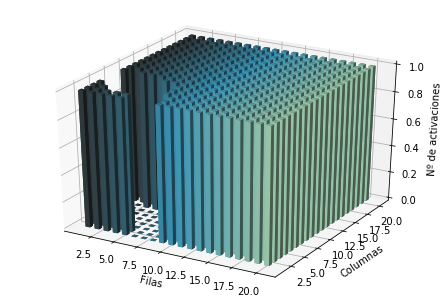

[[1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

In [25]:
print('Mapa de Clasificación')
print(mClasificacion)
#Para pintar este mapa hay que mirar la practica y hacer uso del resto de csv
print('\nMapa de Activación')
histograma3d(mActivacion)
print(mActivacion)
print('\nMapa de Distancias')
print(mDistancias)

##### Calculamos el número de clases

In [26]:
num_clases = np.count_nonzero(mActivacion)
print('Número de clases: ', num_clases)

Número de clases:  362


##### Calculamos el Error de Cuantificación y el Error Topológico del mapa

In [27]:
#error de cuantificación
eCuantificacion = (np.sum(mDistancias))/(np.sum(mActivacion))
print('Error de Cuantificación: ', eCuantificacion)

Error de Cuantificación:  0.3585941197819898


In [28]:
#error topológico
#calculamos la segunda bmu para el error topológico
def calcular_bmu2(patron_entrada, m_pesos, num_entradas):
    #inicializamos la distancia minina
    dMin = np.iinfo(np.int).max
    bmu_idx = np.zeros(2) #le pasamos a las bmu_idx un array de ceros (2D)
    #recorremos la matriz de pesos
    for x in range (m_pesos.shape[0]): #para x
        for y in range (m_pesos.shape[1]): #para y
            w = m_pesos[x, y] #vector de pesos
            dEuclidea = np.sqrt(np.sum((w - patron_entrada)** 2)) #distancia Euclidea
            if dEuclidea < dMin:
                bmu_idx2 = bmu_idx
                dMin = dEuclidea
                bmu_idx = np.array([x, y])
   
    return (bmu_idx, bmu_idx2)


t=0
for i in range(t, num_jugadores):
    bmu_idx, bmu_idx2 = calcular_bmu2(datosN[i], m_pesos, num_entradas)
    x = bmu_idx[0]
    y = bmu_idx[1]
    for a in [x-1,x,x+1]:
        for b in [y-1,y,y+1]:
            if bmu_idx2[0]== a and bmu_idx2[1] == b:
                ady = True #t(x) = 0 si la primera y segunda BMU son adyacentes
            elif a == bmu_idx[0]+1 and b == bmu_idx[1]+1 and ady != True:
                t+=1 #en cambio, t(x) = 1 en caso contrario

eTopologico = t/num_jugadores
            
print('Error Topológico: ', eTopologico) 

Error Topológico:  0.0


## SOM Prueba

#### Clasificación con tablas añadidas

Las columnas a usar ya han sido limpiadas y normalizadas anteriormente en el notebook

In [29]:
print('Mapa de Clasificación VALUE')
print(mClasificacion1)

print('Mapa de Clasificación OVERALL')
print(mClasificacion2)

# print('Mapa de Clasificación PREFERRED POSITIONS')
# print(mClasificacion3)


Mapa de Clasificación VALUE
[[7.60082645e+01 1.33057851e+01 5.57024793e+00 6.03305785e-01
  5.78512397e-02 0.00000000e+00 0.00000000e+00 0.00000000e+00
  2.44628099e+00 1.22892562e+01 1.52727273e+01 1.12892562e+01
  5.48760331e+00 3.95041322e+00 5.28099174e+00 4.26446281e+00
  5.47933884e+00 4.85950413e+00 6.22314050e+00 2.14462810e+01]
 [5.16528926e+00 3.71900826e+00 1.34710744e+00 1.98347107e-01
  6.61157025e-02 0.00000000e+00 0.00000000e+00 0.00000000e+00
  3.96694215e-01 9.25619835e-01 1.95041322e+00 1.07438017e+00
  5.95041322e-01 5.78512397e-01 6.11570248e-01 5.20661157e-01
  5.70247934e-01 4.95867769e-01 4.38016529e-01 4.83471074e+00]
 [2.06611570e+00 3.30578512e-01 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  1.38842975e+00 2.19834711e+00 2.61157025e+00 1.07438017e+00
  1.15702479e+00 4.21487603e-01 7.60330579e-01 3.88429752e-01
  1.42975207e+00 9.25619835e-01 4.13223140e-01 5.04132231e+00]
 [2.64462810e-01 0.00000000e+00 0.00000

Mapa de Clasificación VALUE


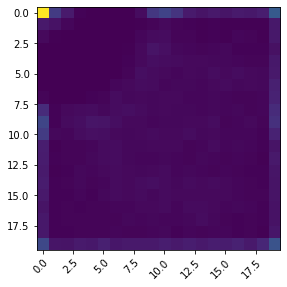

Mapa de Clasificación OVERALL


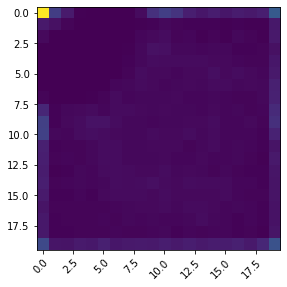

In [30]:
#dibujamos
print('Mapa de Clasificación VALUE')
pintar_mapa(mClasificacion1)

print('Mapa de Clasificación OVERALL')
pintar_mapa(mClasificacion2)